In [2]:
!pip install 'git+https://github.com/facebookresearch/detectron2.git'
!pip3 install opencv-python

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-sn8fynfx
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-sn8fynfx
  Resolved https://github.com/facebookresearch/detectron2.git to commit 9604f5995cc628619f0e4fd913453b4d7d61db3f
  Preparing metadata (setup.py) ... done
  Using cached pycocotools-2.0.8-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (1.1 kB)
  Using cached yacs-0.1.8-py3-none-any.whl.metadata (639 bytes)
  Using cached fvcore-0.1.5.post20221221-py3-none-any.whl
  Using cached iopath-0.1.9-py3-none-any.whl.metadata (370 bytes)
  Using cached omegaconf-2.3.0-py3-none-any.whl.metadata (3.9 kB)
  Using cached hydra_core-1.3.2-py3-none-any.whl.metadata (5.5 kB)
  Using cached black-25.1.0-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.manylinux_2_28_x86_64.whl.metadata (81 kB)
  Using cached antlr4_python3_runtime-4.9.3-py3-none-any.whl
  

In [3]:
import os
import json
import cv2
import shutil
import random
import numpy as np
import matplotlib.pyplot as plt
import detectron2
from collections import defaultdict
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.evaluation import COCOEvaluator

In [5]:
imgs_dir = '/home/jovyan/__ANIMALS/images'
train_images_dir = "train/images"
val_images_dir = "val/images"

In [6]:
!ls -la /home/jovyan/__ANIMALS/datasets/ds7_final_detectron/train/images | wc -l

1914


In [7]:
!ls -la /home/jovyan/__ANIMALS/datasets/ds7_final_detectron/val/images | wc -l

527


In [8]:
tr_set = set(os.listdir('/home/jovyan/__ANIMALS/datasets/ds7_final_detectron/train/images'))
val_set = set(os.listdir('/home/jovyan/__ANIMALS/datasets/ds7_final_detectron/val/images'))

In [9]:
len(set.intersection(tr_set, val_set))

112

In [10]:
dataset_dir = '/home/jovyan/__ANIMALS/datasets/ds7_final_detectron'
imgs_dir = '/home/jovyan/__ANIMALS/images'

In [11]:
coco_file = os.path.join(dataset_dir, 'result.json')
with open(coco_file, 'r') as f:
    coco_data = json.load(f)
for img in coco_data['images']:
    img['file_name'] = img['file_name'].split('__')[-1]
print('total images in dataset:', len(coco_data['images']))

total images in dataset: 2339


In [12]:
idxs_none = [x['id'] for x in coco_data['images'] if x['width'] is None]
idxs_none

[347, 820, 1937, 1964, 1981, 2016, 2049, 2131, 2153]

In [13]:
    images_ = [x for x in coco_data['images'] if x['id'] not in idxs_none]
    coco_data['images'] = images_
    annotations_ = [x for x in coco_data['annotations'] if x['id'] not in idxs_none]
    coco_data['annotations'] = annotations_

In [14]:
coco_data.keys()

dict_keys(['images', 'categories', 'annotations', 'info'])

In [15]:
coco_data['images'][:2]

[{'width': 2048,
  'height': 1536,
  'id': 0,
  'file_name': 'Uss-1.1.AnikinRidge_002_12-17-2023_15-00.JPG'},
 {'width': 2048,
  'height': 1536,
  'id': 1,
  'file_name': 'Uss-1.1.AnikinRidge_003_12-21-2023_09-22.JPG'}]

In [16]:
print('categories:', len(coco_data['categories']))
coco_data['categories'][:2]

categories: 21


[{'id': 0, 'name': 'badger'}, {'id': 1, 'name': 'boar'}]

In [17]:
print('annotations:', len(coco_data['annotations']))
coco_data['annotations'][:2]

annotations: 2690


[{'id': 0,
  'image_id': 0,
  'category_id': 4,
  'segmentation': [],
  'bbox': [5.527665317139001,
   696.1726618705035,
   442.2132253711201,
   425.43884892086334],
  'ignore': 0,
  'iscrowd': 0,
  'area': 188134.68557947164},
 {'id': 1,
  'image_id': 1,
  'category_id': 13,
  'segmentation': [],
  'bbox': [514.0728744939271,
   707.223021582734,
   1133.1713900134953,
   718.2733812949639],
  'ignore': 0,
  'iscrowd': 0,
  'area': 813926.8458917076}]

In [18]:
coco_data['info']

{'year': 2025,
 'version': '1.0',
 'description': '',
 'contributor': 'Label Studio',
 'url': '',
 'date_created': '2025-03-26 08:53:15.136617'}

In [19]:
def split_coco_dataset(coco_data, balanced=True, train_size=.8):
    images = coco_data['images']
    annotations = coco_data['annotations']
    categories = coco_data['categories']
    info = coco_data['info']
    split_index = int(len(images) * train_size)

    if balanced:
        category_to_anns = defaultdict(list)
        for ann in annotations:
            category_to_anns[ann['category_id']].append(ann)
        train_anns = []
        val_anns = []
        for category_id, anns in category_to_anns.items():
            random.shuffle(anns)
            split_index = int(len(anns) * train_size)
            train_anns.extend(anns[:split_index])
            val_anns.extend(anns[split_index:])
        train_ids = set(ann['image_id'] for ann in train_anns)
        val_ids = set(ann['image_id'] for ann in val_anns)
        train_images = [img for img in images if img['id'] in train_ids]
        val_images = [img for img in images if img['id'] in val_ids]
    else:
        random.shuffle(images)
        train_ids = set([img['id'] for img in train_images])
        val_ids = set([img['id'] for img in val_images])
        train_images = images[:split_index]
        val_images = images[split_index:]
    train_anns = [ann for ann in annotations 
                  if ann['image_id'] in train_ids]
    val_anns = [ann for ann in annotations 
                if ann['image_id'] in val_ids]

    train_data = {
        'info': info,
        'images': train_images,
        'annotations': train_anns,
        'categories': categories
    }
    print(
        'training -', 
        len(train_data['images']), 'images,',
        len(train_data['annotations']), 'annotations'
    )
    val_data = {
        'info': info,
        'images': val_images,
        'annotations': val_anns,
        'categories': categories
    }
    print(
        'val -', 
        len(val_data['images']), 'images,',
        len(val_data['annotations']), 'annotations'
    )
    return train_data, val_data
train_data, val_data = split_coco_dataset(coco_data, balanced=True, train_size=.8)

training - 1893 images, 2256 annotations
val - 532 images, 708 annotations


In [20]:
train_images = train_data["images"]
val_images = val_data["images"]


# Copy images to train and validation directories
for img in train_images:
    img_name = img['file_name']
    src = os.path.join(imgs_dir, img_name)
    dst = os.path.join(train_images_dir, img_name)
    if os.path.exists(src):
        shutil.copyfile(src, dst)
    else:
        print(f"Warning: Train image {img_name} not found.")

for img in val_images:
    img_name = img['file_name']
    src = os.path.join(imgs_dir, img_name)
    dst = os.path.join(val_images_dir, img_name)
    if os.path.exists(src):
        shutil.copyfile(src, dst)
    else:
        print(f"Warning: Validation image {img_name} not found.")

print("Images copied to train and validation directories.")

KeyboardInterrupt: 

In [20]:
train_data, val_data = split_coco_dataset(coco_data, balanced=True, train_size=.8)
coco_train_file = os.path.join(dataset_dir, 'coco_train.json')
with open('coco_train.json', 'w') as file:
    json.dump(train_data, file)
coco_val_file = os.path.join(dataset_dir, 'coco_val.json')
with open(coco_val_file, 'w') as file:
    json.dump(val_data, file)

training - 1900 images, 2259 annotations
val - 524 images, 704 annotations


In [21]:
def balance_count(data):
    for cat in data['categories']:
        print(
            cat['id'], cat['name'], '=',
            sum(x['category_id'] == cat['id'] for x in data['annotations'])
        )

print('--- ALL ---')
balance_count(coco_data)
print('--- TRAIN ---')
balance_count(train_data)
print('--- VAL ---')
balance_count(val_data)

--- ALL ---
0 badger = 173
1 boar = 172
2 brown_bear = 3
3 hare = 8
4 lynx = 93
5 musk_deer = 2
6 otter = 2
7 raccoon = 35
8 red_fox = 36
9 red_squirrel = 0
10 roe_deer_female = 313
11 roe_deer_male = 79
12 sable = 35
13 sika_deer_female = 995
14 sika_deer_male = 214
15 tiger = 499
16 ussuri_bear = 4
17 wild_cat = 15
18 wolf = 0
19 wolverine = 0
20 yellow_marten = 12
--- TRAIN ---
0 badger = 138
1 boar = 157
2 brown_bear = 2
3 hare = 6
4 lynx = 74
5 musk_deer = 1
6 otter = 1
7 raccoon = 29
8 red_fox = 28
9 red_squirrel = 0
10 roe_deer_female = 265
11 roe_deer_male = 67
12 sable = 28
13 sika_deer_female = 862
14 sika_deer_male = 177
15 tiger = 400
16 ussuri_bear = 3
17 wild_cat = 12
18 wolf = 0
19 wolverine = 0
20 yellow_marten = 9
--- VAL ---
0 badger = 35
1 boar = 68
2 brown_bear = 1
3 hare = 2
4 lynx = 19
5 musk_deer = 1
6 otter = 1
7 raccoon = 8
8 red_fox = 8
9 red_squirrel = 0
10 roe_deer_female = 79
11 roe_deer_male = 20
12 sable = 7
13 sika_deer_female = 294
14 sika_deer_male = 5

In [22]:
register_coco_instances(
    'animal_train', 
    {},
    coco_train_file,
    imgs_dir
)
register_coco_instances(
    'animal_val', 
    {},
    coco_val_file,
    imgs_dir
)

In [23]:
class CocoTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            os.makedirs("coco_eval", exist_ok=True)
            output_folder = "coco_eval"
        return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [27]:
cfg = get_cfg()
cfg.MODEL.DEVICE = 'cpu'
model_name = 'COCO-Detection/faster_rcnn_R_50_C4_1x.yaml'

In [ ]:
cfg.merge_from_file(model_zoo.get_config_file(model_name))
cfg.DATASETS.TRAIN = ('animal_train',)
cfg.DATASETS.TEST = ('animal_val',)
cfg.TEST.EVAL_PERIOD =  200
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(model_name)
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = .00025
cfg.SOLVER.MAX_ITER = 1000
cfg.SOLVER.STEPS = []
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256  # default: 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(train_data['categories'])

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
#trainer = DefaultTrainer(cfg)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[04/01 15:57:41 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 2048) in the checkpoint but (22, 2048) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (22,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 2048) in the checkpoint but (84, 2048) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (84,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias

[04/01 15:57:44 d2.engine.train_loop]: Starting training from iteration 0


/opt/conda/lib/python3.12/site-packages/torch/functional.py:539: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:3637.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[04/01 16:19:18 d2.utils.events]:  eta: 17:02:20  iter: 19  total_loss: 3.565  loss_cls: 3.119  loss_box_reg: 0.3726  loss_rpn_cls: 0.03086  loss_rpn_loc: 0.02729    time: 63.4172  last_time: 56.4246  data_time: 0.0450  last_data_time: 0.0080   lr: 4.9953e-06  


2025-04-01 16:19:18.943690: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-01 16:19:18.980932: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


[04/01 16:39:46 d2.utils.events]:  eta: 16:24:44  iter: 39  total_loss: 3.438  loss_cls: 2.936  loss_box_reg: 0.4252  loss_rpn_cls: 0.02726  loss_rpn_loc: 0.02945    time: 62.2720  last_time: 60.1689  data_time: 0.0131  last_data_time: 0.0087   lr: 9.9902e-06  
[04/01 17:01:12 d2.utils.events]:  eta: 16:14:42  iter: 59  total_loss: 2.987  loss_cls: 2.56  loss_box_reg: 0.434  loss_rpn_cls: 0.03089  loss_rpn_loc: 0.02418    time: 62.9721  last_time: 76.0983  data_time: 0.0155  last_data_time: 0.0207   lr: 1.4985e-05  
[04/01 17:25:35 d2.utils.events]:  eta: 16:18:19  iter: 79  total_loss: 2.447  loss_cls: 1.979  loss_box_reg: 0.4554  loss_rpn_cls: 0.0308  loss_rpn_loc: 0.01505    time: 65.5769  last_time: 72.6960  data_time: 0.0151  last_data_time: 0.0093   lr: 1.998e-05  
[04/01 17:49:50 d2.utils.events]:  eta: 17:12:27  iter: 99  total_loss: 1.698  loss_cls: 1.196  loss_box_reg: 0.4545  loss_rpn_cls: 0.02105  loss_rpn_loc: 0.02611    time: 67.0421  last_time: 75.3767  data_time: 0.0175

In [33]:
import os
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, 'model_final.pth')
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = .5
predictor = DefaultPredictor(cfg)

[04/01 18:58:22 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


In [34]:
all_imgs = [x for x in os.listdir(imgs_dir) if '.JPG' in x]
print('total images:', len(all_imgs))

total images: 7054


In [35]:
im_idx = 110
im = cv2.imread(imgs_dir + '/' + all_imgs[im_idx])

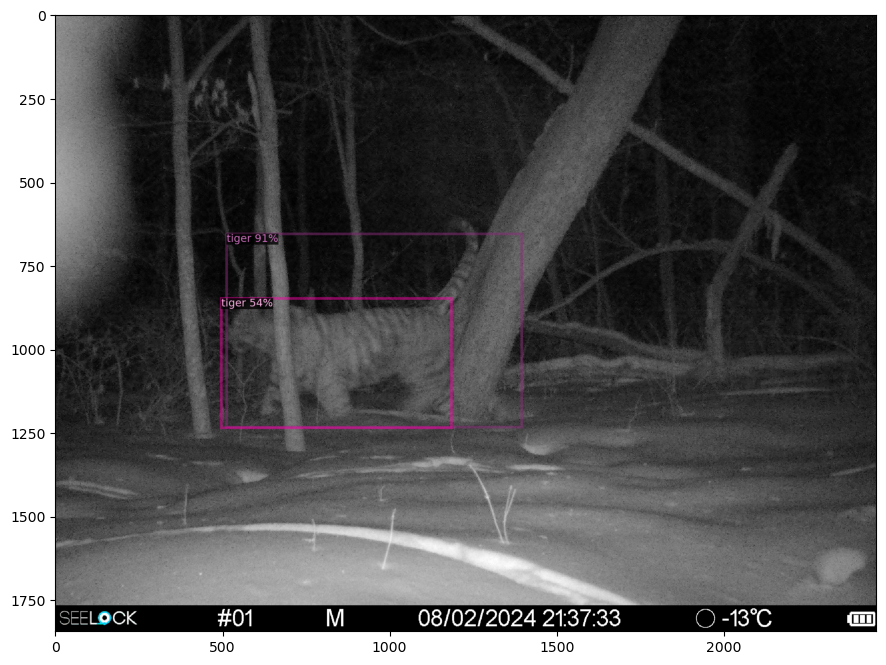

In [36]:
outputs = predictor(im)
v = Visualizer(im[:,:,::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs['instances'].to('cpu'))
plt.figure(figsize=(12, 8))
plt.imshow(out.get_image()[:, :, ::-1])
plt.show()

In [29]:
outputs

NameError: name 'outputs' is not defined

## load trained weights and model

In [ ]:
import os
import json
import torch
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
from detectron2.data.datasets import register_coco_instances

# Load training data
with open('coco_train.json', 'r') as f:
    train_data = json.load(f)


cfg = get_cfg()


cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_C4_1x.yaml"))

# Set model weights path
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # Default Detectron2 output folder
if not os.path.exists(cfg.MODEL.WEIGHTS):
    raise FileNotFoundError(f"Model weights not found at {cfg.MODEL.WEIGHTS}")


cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # Confidence threshold
cfg.MODEL.DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# Set number of classes
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(train_data['categories'])

# Register datasets
register_coco_instances("animal_train", {}, "coco_train.json", "/home/jovyan/__ANIMALS/images")
register_coco_instances("animal_val", {}, "coco_val.json", "/home/jovyan/__ANIMALS/images")

# Create predictor
predictor = DefaultPredictor(cfg)
print("✔ Predictor created successfully!")
print(f"• Model: {cfg.MODEL.WEIGHTS}")
print(f"• Classes: {cfg.MODEL.ROI_HEADS.NUM_CLASSES}")
print(f"• Device: {cfg.MODEL.DEVICE}")

### Evaluation Metrics

In [18]:
#from detectron2.evaluation import COCOEvaluator, inference_on_dataset
#from detectron2.data import build_detection_test_loader
#import pandas as pd
#from tqdm import tqdm

#def calculate_metrics(cfg, predictor):
    # Setup evaluator
    #evaluator = COCOEvaluator("animal_val", output_dir=cfg.OUTPUT_DIR, tasks=("bbox",))
    #val_loader = build_detection_test_loader(cfg, "animal_val")

    #val_loader = tqdm(val_loader, desc="Evaluating", unit="img")
    
    # Run evaluation
   # results = inference_on_dataset(predictor.model, val_loader, evaluator)
    
    # Extract metrics
    #metrics = {
        #'mAP': results['bbox']['AP'],
        #'mAP50': results['bbox']['AP50'],
        #'mAP75': results['bbox']['AP75'],
       # 'Precision': results['bbox']['precision'][0][0],
        #'Recall': results['bbox']['recall'][0][0],
        #'F1': 2*(results['bbox']['precision'][0][0]*results['bbox']['recall'][0][0])/(results['bbox']['precision'][0][0]+results['bbox']['recall'][0][0]+1e-10)
    }
    
    # Per-class metrics
   # class_metrics = []
    #for idx, cat in enumerate(train_data['categories']):
       # class_metrics.append({
            #'Class': cat['name'],
            #'AP': results['bbox']['AP_per_class'][idx],
            #'AP50': results['bbox']['AP50_per_class'][idx],
            #'AP75': results['bbox']['AP75_per_class'][idx]
        })
    
    #return pd.DataFrame([metrics]), pd.DataFrame(class_metrics)

# Calculate metrics
#overall_df, class_df = calculate_metrics(cfg, predictor)

#print("================ OVERALL METRICS ================")
#print(overall_df.to_markdown(tablefmt="grid", floatfmt=".4f"))

#print("\n================ PER-CLASS METRICS ================")
#print(class_df.to_markdown(tablefmt="grid", floatfmt=".4f"))


Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

Evaluating: 100%|██████████| 519/519 [37:15<00:00,  4.31s/img]


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.076
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.103
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.085
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.077
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.078
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.090
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.090
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.

KeyError: 'precision'

In [38]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
import pandas as pd
from tqdm import tqdm
from detectron2.data import MetadataCatalog

def calculate_metrics(cfg, predictor):
    # Setup evaluator
    evaluator = COCOEvaluator("animal_val", output_dir=cfg.OUTPUT_DIR, tasks=("bbox",))
    val_loader = build_detection_test_loader(cfg, "animal_val")

    val_loader = tqdm(val_loader, desc="Evaluating", unit="img")
    
    # Run evaluation
    results = inference_on_dataset(predictor.model, val_loader, evaluator)

    # Извлекаем метрики
    metrics = {
        'mAP': results['bbox']['AP'],
        'mAP50': results['bbox']['AP50'],
        'mAP75': results['bbox']['AP75'],
    }

    # Проверяем, есть ли precision и recall
    if 'precision' in results['bbox'] and 'recall' in results['bbox']:
        precision = results['bbox']['precision'][0][0]
        recall = results['bbox']['recall'][0][0]
        metrics['Precision'] = precision
        metrics['Recall'] = recall
        metrics['F1'] = 2 * (precision * recall) / (precision + recall + 1e-10)
    
    # Получаем список классов
    class_names = MetadataCatalog.get("animal_val").thing_classes

    # Пер-классовые метрики
    class_metrics = []
    for idx, class_name in enumerate(class_names):
        class_metrics.append({
            'Class': class_name,
            'AP': results['bbox'].get('AP_per_class', [None] * len(class_names))[idx],
            'AP50': results['bbox'].get('AP50_per_class', [None] * len(class_names))[idx],
            'AP75': results['bbox'].get('AP75_per_class', [None] * len(class_names))[idx]
        })
    
    return pd.DataFrame([metrics]), pd.DataFrame(class_metrics)

# Calculate metrics
overall_df, class_df = calculate_metrics(cfg, predictor)

print("================ OVERALL METRICS ================")
print(overall_df.to_markdown(tablefmt="grid", floatfmt=".4f"))

print("\n================ PER-CLASS METRICS ================")
print(class_df.to_markdown(tablefmt="grid", floatfmt=".4f"))


WARNING [04/01 19:36:21 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/01 19:36:21 d2.data.datasets.coco]: Loaded 524 images in COCO format from /home/jovyan/__ANIMALS/datasets/ds7_final_detectron/coco_val.json
[04/01 19:36:21 d2.data.build]: Distribution of instances among all 21 categories:
|   category   | #instances   |   category    | #instances   |   category    | #instances   |
|:------------:|:-------------|:-------------:|:-------------|:-------------:|:-------------|
|    badger    | 35           |     boar      | 68           |  brown_bear   | 1            |
|     hare     | 2            |     lynx      | 19           |   musk_deer   | 1            |
|    otter     | 1            |    raccoon    | 8            |    red_fox    | 8            |
| red_squirrel | 0            | roe_deer_fe.. | 79           | roe_deer_male | 20           |
|    sable     | 7            | sika_deer_f.. | 294          | sika_dee

Evaluating:   0%|          | 0/524 [00:00<?, ?img/s]

[04/01 19:36:21 d2.evaluation.evaluator]: Start inference on 524 batches
[04/01 19:36:30 d2.evaluation.evaluator]: Inference done 1/524. Dataloading: 0.4427 s/iter. Inference: 8.4933 s/iter. Eval: 0.0001 s/iter. Total: 8.9373 s/iter. ETA=1:17:54


Evaluating:   0%|          | 1/524 [00:08<1:17:55,  8.94s/img]

[04/01 19:36:43 d2.evaluation.evaluator]: Inference done 2/524. Dataloading: 0.2227 s/iter. Inference: 10.5259 s/iter. Eval: 0.0003 s/iter. Total: 10.7506 s/iter. ETA=1:33:31


Evaluating:   0%|          | 2/524 [00:21<1:36:19, 11.07s/img]

[04/01 19:36:55 d2.evaluation.evaluator]: Inference done 3/524. Dataloading: 0.1496 s/iter. Inference: 10.9804 s/iter. Eval: 0.0003 s/iter. Total: 11.1317 s/iter. ETA=1:36:39


Evaluating:   1%|          | 3/524 [00:33<1:39:23, 11.45s/img]

[04/01 19:37:08 d2.evaluation.evaluator]: Inference done 4/524. Dataloading: 0.1129 s/iter. Inference: 11.5234 s/iter. Eval: 0.0002 s/iter. Total: 11.6379 s/iter. ETA=1:40:51


Evaluating:   1%|          | 4/524 [00:46<1:45:03, 12.12s/img]

[04/01 19:37:20 d2.evaluation.evaluator]: Inference done 5/524. Dataloading: 0.0926 s/iter. Inference: 11.7027 s/iter. Eval: 0.0002 s/iter. Total: 11.7968 s/iter. ETA=1:42:02


Evaluating:   1%|          | 5/524 [00:58<1:45:49, 12.23s/img]

[04/01 19:37:33 d2.evaluation.evaluator]: Inference done 6/524. Dataloading: 0.0000 s/iter. Inference: 12.5682 s/iter. Eval: 0.0003 s/iter. Total: 12.5685 s/iter. ETA=1:48:30


Evaluating:   1%|          | 6/524 [01:11<1:46:36, 12.35s/img]

[04/01 19:37:47 d2.evaluation.evaluator]: Inference done 7/524. Dataloading: 0.0011 s/iter. Inference: 13.2792 s/iter. Eval: 0.0002 s/iter. Total: 13.2809 s/iter. ETA=1:54:26


Evaluating:   1%|▏         | 7/524 [01:25<1:51:02, 12.89s/img]

[04/01 19:37:58 d2.evaluation.evaluator]: Inference done 8/524. Dataloading: 0.0016 s/iter. Inference: 12.7290 s/iter. Eval: 0.0002 s/iter. Total: 12.7312 s/iter. ETA=1:49:29


Evaluating:   2%|▏         | 8/524 [01:37<1:47:23, 12.49s/img]

[04/01 19:38:12 d2.evaluation.evaluator]: Inference done 9/524. Dataloading: 0.0020 s/iter. Inference: 12.9990 s/iter. Eval: 0.0001 s/iter. Total: 13.0018 s/iter. ETA=1:51:35


Evaluating:   2%|▏         | 9/524 [01:51<1:50:46, 12.91s/img]

[04/01 19:38:27 d2.evaluation.evaluator]: Inference done 10/524. Dataloading: 0.0023 s/iter. Inference: 13.4501 s/iter. Eval: 0.0002 s/iter. Total: 13.4558 s/iter. ETA=1:55:16


Evaluating:   2%|▏         | 10/524 [02:06<1:56:48, 13.64s/img]

[04/01 19:38:41 d2.evaluation.evaluator]: Inference done 11/524. Dataloading: 0.0024 s/iter. Inference: 13.4414 s/iter. Eval: 0.0001 s/iter. Total: 13.4484 s/iter. ETA=1:54:59


Evaluating:   2%|▏         | 11/524 [02:19<1:56:00, 13.57s/img]

[04/01 19:38:55 d2.evaluation.evaluator]: Inference done 12/524. Dataloading: 0.0026 s/iter. Inference: 13.5745 s/iter. Eval: 0.0002 s/iter. Total: 13.5831 s/iter. ETA=1:55:54


Evaluating:   2%|▏         | 12/524 [02:34<1:57:54, 13.82s/img]

[04/01 19:39:10 d2.evaluation.evaluator]: Inference done 13/524. Dataloading: 0.0027 s/iter. Inference: 13.7446 s/iter. Eval: 0.0002 s/iter. Total: 13.7540 s/iter. ETA=1:57:08


Evaluating:   2%|▏         | 13/524 [02:49<2:00:34, 14.16s/img]

[04/01 19:39:26 d2.evaluation.evaluator]: Inference done 14/524. Dataloading: 0.0027 s/iter. Inference: 13.9219 s/iter. Eval: 0.0002 s/iter. Total: 13.9307 s/iter. ETA=1:58:24


Evaluating:   3%|▎         | 14/524 [03:04<2:03:23, 14.52s/img]

[04/01 19:39:40 d2.evaluation.evaluator]: Inference done 15/524. Dataloading: 0.0027 s/iter. Inference: 13.9916 s/iter. Eval: 0.0002 s/iter. Total: 13.9998 s/iter. ETA=1:58:45


Evaluating:   3%|▎         | 15/524 [03:18<2:03:24, 14.55s/img]

[04/01 19:39:54 d2.evaluation.evaluator]: Inference done 16/524. Dataloading: 0.0026 s/iter. Inference: 14.0083 s/iter. Eval: 0.0002 s/iter. Total: 14.0162 s/iter. ETA=1:58:40


Evaluating:   3%|▎         | 16/524 [03:33<2:02:15, 14.44s/img]

[04/01 19:40:09 d2.evaluation.evaluator]: Inference done 17/524. Dataloading: 0.0027 s/iter. Inference: 14.0173 s/iter. Eval: 0.0002 s/iter. Total: 14.0257 s/iter. ETA=1:58:31


Evaluating:   3%|▎         | 17/524 [03:47<2:01:14, 14.35s/img]

[04/01 19:40:23 d2.evaluation.evaluator]: Inference done 18/524. Dataloading: 0.0027 s/iter. Inference: 14.0269 s/iter. Eval: 0.0002 s/iter. Total: 14.0359 s/iter. ETA=1:58:22


Evaluating:   3%|▎         | 18/524 [04:01<2:00:29, 14.29s/img]

[04/01 19:40:38 d2.evaluation.evaluator]: Inference done 19/524. Dataloading: 0.0027 s/iter. Inference: 14.1004 s/iter. Eval: 0.0002 s/iter. Total: 14.1090 s/iter. ETA=1:58:45


Evaluating:   4%|▎         | 19/524 [04:16<2:02:13, 14.52s/img]

[04/01 19:40:52 d2.evaluation.evaluator]: Inference done 20/524. Dataloading: 0.0028 s/iter. Inference: 14.1142 s/iter. Eval: 0.0002 s/iter. Total: 14.1229 s/iter. ETA=1:58:37


Evaluating:   4%|▍         | 20/524 [04:30<2:01:26, 14.46s/img]

[04/01 19:41:08 d2.evaluation.evaluator]: Inference done 21/524. Dataloading: 0.0028 s/iter. Inference: 14.2305 s/iter. Eval: 0.0002 s/iter. Total: 14.2390 s/iter. ETA=1:59:22


Evaluating:   4%|▍         | 21/524 [04:46<2:05:02, 14.92s/img]

[04/01 19:41:22 d2.evaluation.evaluator]: Inference done 22/524. Dataloading: 0.0028 s/iter. Inference: 14.2222 s/iter. Eval: 0.0002 s/iter. Total: 14.2306 s/iter. ETA=1:59:03


Evaluating:   4%|▍         | 22/524 [05:00<2:02:43, 14.67s/img]

[04/01 19:41:34 d2.evaluation.evaluator]: Inference done 23/524. Dataloading: 0.0029 s/iter. Inference: 14.0960 s/iter. Eval: 0.0002 s/iter. Total: 14.1042 s/iter. ETA=1:57:46


Evaluating:   4%|▍         | 23/524 [05:12<1:55:41, 13.85s/img]

[04/01 19:41:47 d2.evaluation.evaluator]: Inference done 24/524. Dataloading: 0.0028 s/iter. Inference: 14.0254 s/iter. Eval: 0.0002 s/iter. Total: 14.0335 s/iter. ETA=1:56:56


Evaluating:   5%|▍         | 24/524 [05:25<1:52:43, 13.53s/img]

[04/01 19:41:59 d2.evaluation.evaluator]: Inference done 25/524. Dataloading: 0.0029 s/iter. Inference: 13.9204 s/iter. Eval: 0.0002 s/iter. Total: 13.9283 s/iter. ETA=1:55:50


Evaluating:   5%|▍         | 25/524 [05:37<1:48:30, 13.05s/img]

[04/01 19:42:14 d2.evaluation.evaluator]: Inference done 26/524. Dataloading: 0.0028 s/iter. Inference: 13.9720 s/iter. Eval: 0.0002 s/iter. Total: 13.9796 s/iter. ETA=1:56:01


Evaluating:   5%|▍         | 26/524 [05:52<1:53:10, 13.64s/img]

[04/01 19:42:29 d2.evaluation.evaluator]: Inference done 27/524. Dataloading: 0.0028 s/iter. Inference: 14.0206 s/iter. Eval: 0.0002 s/iter. Total: 14.0280 s/iter. ETA=1:56:11


Evaluating:   5%|▌         | 27/524 [06:07<1:56:28, 14.06s/img]

[04/01 19:42:45 d2.evaluation.evaluator]: Inference done 28/524. Dataloading: 0.0028 s/iter. Inference: 14.0933 s/iter. Eval: 0.0002 s/iter. Total: 14.1011 s/iter. ETA=1:56:34


Evaluating:   5%|▌         | 28/524 [06:23<2:00:18, 14.55s/img]

[04/01 19:43:00 d2.evaluation.evaluator]: Inference done 29/524. Dataloading: 0.0028 s/iter. Inference: 14.1502 s/iter. Eval: 0.0002 s/iter. Total: 14.1579 s/iter. ETA=1:56:48


Evaluating:   6%|▌         | 29/524 [06:38<2:02:18, 14.83s/img]

[04/01 19:43:15 d2.evaluation.evaluator]: Inference done 30/524. Dataloading: 0.0028 s/iter. Inference: 14.1845 s/iter. Eval: 0.0002 s/iter. Total: 14.1921 s/iter. ETA=1:56:50


Evaluating:   6%|▌         | 30/524 [06:53<2:02:31, 14.88s/img]

[04/01 19:43:28 d2.evaluation.evaluator]: Inference done 31/524. Dataloading: 0.0028 s/iter. Inference: 14.1430 s/iter. Eval: 0.0002 s/iter. Total: 14.1504 s/iter. ETA=1:56:16


Evaluating:   6%|▌         | 31/524 [07:06<1:57:56, 14.35s/img]

[04/01 19:43:43 d2.evaluation.evaluator]: Inference done 32/524. Dataloading: 0.0029 s/iter. Inference: 14.1566 s/iter. Eval: 0.0002 s/iter. Total: 14.1645 s/iter. ETA=1:56:08


Evaluating:   6%|▌         | 32/524 [07:21<1:58:06, 14.40s/img]

[04/01 19:43:58 d2.evaluation.evaluator]: Inference done 33/524. Dataloading: 0.0029 s/iter. Inference: 14.2139 s/iter. Eval: 0.0002 s/iter. Total: 14.2217 s/iter. ETA=1:56:22


Evaluating:   6%|▋         | 33/524 [07:37<2:01:12, 14.81s/img]

[04/01 19:44:14 d2.evaluation.evaluator]: Inference done 34/524. Dataloading: 0.0029 s/iter. Inference: 14.2516 s/iter. Eval: 0.0002 s/iter. Total: 14.2593 s/iter. ETA=1:56:27


Evaluating:   6%|▋         | 34/524 [07:52<2:02:12, 14.96s/img]

[04/01 19:44:28 d2.evaluation.evaluator]: Inference done 35/524. Dataloading: 0.0030 s/iter. Inference: 14.2521 s/iter. Eval: 0.0002 s/iter. Total: 14.2600 s/iter. ETA=1:56:13


Evaluating:   7%|▋         | 35/524 [08:06<2:00:16, 14.76s/img]

[04/01 19:44:41 d2.evaluation.evaluator]: Inference done 36/524. Dataloading: 0.0030 s/iter. Inference: 14.2016 s/iter. Eval: 0.0002 s/iter. Total: 14.2093 s/iter. ETA=1:55:34


Evaluating:   7%|▋         | 36/524 [08:19<1:54:58, 14.14s/img]

[04/01 19:44:55 d2.evaluation.evaluator]: Inference done 37/524. Dataloading: 0.0030 s/iter. Inference: 14.2147 s/iter. Eval: 0.0002 s/iter. Total: 14.2223 s/iter. ETA=1:55:26


Evaluating:   7%|▋         | 37/524 [08:34<1:55:57, 14.29s/img]

[04/01 19:45:09 d2.evaluation.evaluator]: Inference done 38/524. Dataloading: 0.0030 s/iter. Inference: 14.2081 s/iter. Eval: 0.0002 s/iter. Total: 14.2159 s/iter. ETA=1:55:08


Evaluating:   7%|▋         | 38/524 [08:48<1:55:01, 14.20s/img]

[04/01 19:45:18 d2.evaluation.evaluator]: Inference done 39/524. Dataloading: 0.0030 s/iter. Inference: 14.0313 s/iter. Eval: 0.0002 s/iter. Total: 14.0390 s/iter. ETA=1:53:28


Evaluating:   7%|▋         | 39/524 [08:56<1:40:15, 12.40s/img]

[04/01 19:45:33 d2.evaluation.evaluator]: Inference done 40/524. Dataloading: 0.0031 s/iter. Inference: 14.0833 s/iter. Eval: 0.0002 s/iter. Total: 14.0913 s/iter. ETA=1:53:40


Evaluating:   8%|▊         | 40/524 [09:12<1:48:25, 13.44s/img]

[04/01 19:45:46 d2.evaluation.evaluator]: Inference done 41/524. Dataloading: 0.0031 s/iter. Inference: 14.0399 s/iter. Eval: 0.0002 s/iter. Total: 14.0477 s/iter. ETA=1:53:05


Evaluating:   8%|▊         | 41/524 [09:24<1:46:00, 13.17s/img]

[04/01 19:45:58 d2.evaluation.evaluator]: Inference done 42/524. Dataloading: 0.0031 s/iter. Inference: 13.9969 s/iter. Eval: 0.0002 s/iter. Total: 14.0050 s/iter. ETA=1:52:30


Evaluating:   8%|▊         | 42/524 [09:37<1:44:04, 12.95s/img]

[04/01 19:46:14 d2.evaluation.evaluator]: Inference done 43/524. Dataloading: 0.0031 s/iter. Inference: 14.0342 s/iter. Eval: 0.0002 s/iter. Total: 14.0422 s/iter. ETA=1:52:34


Evaluating:   8%|▊         | 43/524 [09:52<1:49:46, 13.69s/img]

[04/01 19:46:24 d2.evaluation.evaluator]: Inference done 44/524. Dataloading: 0.0031 s/iter. Inference: 13.9405 s/iter. Eval: 0.0002 s/iter. Total: 13.9483 s/iter. ETA=1:51:35


Evaluating:   8%|▊         | 44/524 [10:02<1:41:36, 12.70s/img]

[04/01 19:46:35 d2.evaluation.evaluator]: Inference done 45/524. Dataloading: 0.0033 s/iter. Inference: 13.8713 s/iter. Eval: 0.0002 s/iter. Total: 13.8792 s/iter. ETA=1:50:48


Evaluating:   9%|▊         | 45/524 [10:14<1:37:45, 12.25s/img]

[04/01 19:46:49 d2.evaluation.evaluator]: Inference done 46/524. Dataloading: 0.0032 s/iter. Inference: 13.8748 s/iter. Eval: 0.0002 s/iter. Total: 13.8826 s/iter. ETA=1:50:35


Evaluating:   9%|▉         | 46/524 [10:28<1:41:49, 12.78s/img]

[04/01 19:47:04 d2.evaluation.evaluator]: Inference done 47/524. Dataloading: 0.0033 s/iter. Inference: 13.9025 s/iter. Eval: 0.0002 s/iter. Total: 13.9106 s/iter. ETA=1:50:35


Evaluating:   9%|▉         | 47/524 [10:43<1:47:00, 13.46s/img]

[04/01 19:47:12 d2.evaluation.evaluator]: Inference done 48/524. Dataloading: 0.0033 s/iter. Inference: 13.7615 s/iter. Eval: 0.0002 s/iter. Total: 13.7696 s/iter. ETA=1:49:14


Evaluating:   9%|▉         | 48/524 [10:51<1:33:25, 11.78s/img]

[04/01 19:47:21 d2.evaluation.evaluator]: Inference done 49/524. Dataloading: 0.0033 s/iter. Inference: 13.6421 s/iter. Eval: 0.0002 s/iter. Total: 13.6501 s/iter. ETA=1:48:03


Evaluating:   9%|▉         | 49/524 [10:59<1:25:30, 10.80s/img]

[04/01 19:47:36 d2.evaluation.evaluator]: Inference done 50/524. Dataloading: 0.0034 s/iter. Inference: 13.6783 s/iter. Eval: 0.0002 s/iter. Total: 13.6866 s/iter. ETA=1:48:07


Evaluating:  10%|▉         | 50/524 [11:14<1:35:56, 12.14s/img]

[04/01 19:47:50 d2.evaluation.evaluator]: Inference done 51/524. Dataloading: 0.0034 s/iter. Inference: 13.6724 s/iter. Eval: 0.0002 s/iter. Total: 13.6807 s/iter. ETA=1:47:50


Evaluating:  10%|▉         | 51/524 [11:28<1:38:44, 12.53s/img]

[04/01 19:47:57 d2.evaluation.evaluator]: Inference done 52/524. Dataloading: 0.0033 s/iter. Inference: 13.5341 s/iter. Eval: 0.0002 s/iter. Total: 13.5423 s/iter. ETA=1:46:31


Evaluating:  10%|▉         | 52/524 [11:35<1:25:55, 10.92s/img]

[04/01 19:48:07 d2.evaluation.evaluator]: Inference done 53/524. Dataloading: 0.0033 s/iter. Inference: 13.4677 s/iter. Eval: 0.0002 s/iter. Total: 13.4759 s/iter. ETA=1:45:47


Evaluating:  10%|█         | 53/524 [11:45<1:24:23, 10.75s/img]

[04/01 19:48:23 d2.evaluation.evaluator]: Inference done 54/524. Dataloading: 0.0033 s/iter. Inference: 13.5085 s/iter. Eval: 0.0002 s/iter. Total: 13.5166 s/iter. ETA=1:45:52


Evaluating:  10%|█         | 54/524 [12:01<1:35:18, 12.17s/img]

[04/01 19:48:30 d2.evaluation.evaluator]: Inference done 55/524. Dataloading: 0.0033 s/iter. Inference: 13.3887 s/iter. Eval: 0.0002 s/iter. Total: 13.3967 s/iter. ETA=1:44:43


Evaluating:  10%|█         | 55/524 [12:08<1:24:12, 10.77s/img]

[04/01 19:48:46 d2.evaluation.evaluator]: Inference done 56/524. Dataloading: 0.0033 s/iter. Inference: 13.4395 s/iter. Eval: 0.0002 s/iter. Total: 13.4474 s/iter. ETA=1:44:53


Evaluating:  11%|█         | 56/524 [12:24<1:36:13, 12.34s/img]

[04/01 19:48:59 d2.evaluation.evaluator]: Inference done 57/524. Dataloading: 0.0033 s/iter. Inference: 13.4222 s/iter. Eval: 0.0002 s/iter. Total: 13.4301 s/iter. ETA=1:44:31


Evaluating:  11%|█         | 57/524 [12:37<1:36:30, 12.40s/img]

[04/01 19:49:13 d2.evaluation.evaluator]: Inference done 58/524. Dataloading: 0.0033 s/iter. Inference: 13.4487 s/iter. Eval: 0.0002 s/iter. Total: 13.4565 s/iter. ETA=1:44:30


Evaluating:  11%|█         | 58/524 [12:52<1:41:58, 13.13s/img]

[04/01 19:49:24 d2.evaluation.evaluator]: Inference done 59/524. Dataloading: 0.0033 s/iter. Inference: 13.4007 s/iter. Eval: 0.0002 s/iter. Total: 13.4085 s/iter. ETA=1:43:54


Evaluating:  11%|█▏        | 59/524 [13:03<1:36:29, 12.45s/img]

[04/01 19:49:34 d2.evaluation.evaluator]: Inference done 60/524. Dataloading: 0.0033 s/iter. Inference: 13.3387 s/iter. Eval: 0.0002 s/iter. Total: 13.3465 s/iter. ETA=1:43:12


Evaluating:  11%|█▏        | 60/524 [13:13<1:30:35, 11.71s/img]

[04/01 19:49:50 d2.evaluation.evaluator]: Inference done 61/524. Dataloading: 0.0032 s/iter. Inference: 13.3798 s/iter. Eval: 0.0002 s/iter. Total: 13.3875 s/iter. ETA=1:43:18


Evaluating:  12%|█▏        | 61/524 [13:28<1:39:28, 12.89s/img]

[04/01 19:50:06 d2.evaluation.evaluator]: Inference done 62/524. Dataloading: 0.0034 s/iter. Inference: 13.4197 s/iter. Eval: 0.0002 s/iter. Total: 13.4275 s/iter. ETA=1:43:23


Evaluating:  12%|█▏        | 62/524 [13:44<1:45:40, 13.72s/img]

[04/01 19:50:21 d2.evaluation.evaluator]: Inference done 63/524. Dataloading: 0.0033 s/iter. Inference: 13.4461 s/iter. Eval: 0.0002 s/iter. Total: 13.4538 s/iter. ETA=1:43:22


Evaluating:  12%|█▏        | 63/524 [13:59<1:48:16, 14.09s/img]

[04/01 19:50:38 d2.evaluation.evaluator]: Inference done 64/524. Dataloading: 0.0033 s/iter. Inference: 13.5110 s/iter. Eval: 0.0002 s/iter. Total: 13.5187 s/iter. ETA=1:43:38


Evaluating:  12%|█▏        | 64/524 [14:16<1:55:22, 15.05s/img]

[04/01 19:50:54 d2.evaluation.evaluator]: Inference done 65/524. Dataloading: 0.0033 s/iter. Inference: 13.5506 s/iter. Eval: 0.0002 s/iter. Total: 13.5582 s/iter. ETA=1:43:43


Evaluating:  12%|█▏        | 65/524 [14:32<1:57:03, 15.30s/img]

[04/01 19:51:09 d2.evaluation.evaluator]: Inference done 66/524. Dataloading: 0.0033 s/iter. Inference: 13.5839 s/iter. Eval: 0.0002 s/iter. Total: 13.5914 s/iter. ETA=1:43:44


Evaluating:  13%|█▎        | 66/524 [14:48<1:57:27, 15.39s/img]

[04/01 19:51:25 d2.evaluation.evaluator]: Inference done 67/524. Dataloading: 0.0033 s/iter. Inference: 13.6146 s/iter. Eval: 0.0002 s/iter. Total: 13.6220 s/iter. ETA=1:43:45


Evaluating:  13%|█▎        | 67/524 [15:03<1:57:25, 15.42s/img]

[04/01 19:51:39 d2.evaluation.evaluator]: Inference done 68/524. Dataloading: 0.0033 s/iter. Inference: 13.6316 s/iter. Eval: 0.0002 s/iter. Total: 13.6390 s/iter. ETA=1:43:39


Evaluating:  13%|█▎        | 68/524 [15:18<1:55:31, 15.20s/img]

[04/01 19:51:55 d2.evaluation.evaluator]: Inference done 69/524. Dataloading: 0.0033 s/iter. Inference: 13.6570 s/iter. Eval: 0.0002 s/iter. Total: 13.6643 s/iter. ETA=1:43:37


Evaluating:  13%|█▎        | 69/524 [15:33<1:55:24, 15.22s/img]

[04/01 19:52:09 d2.evaluation.evaluator]: Inference done 70/524. Dataloading: 0.0032 s/iter. Inference: 13.6622 s/iter. Eval: 0.0002 s/iter. Total: 13.6694 s/iter. ETA=1:43:25


Evaluating:  13%|█▎        | 70/524 [15:47<1:52:22, 14.85s/img]

[04/01 19:52:23 d2.evaluation.evaluator]: Inference done 71/524. Dataloading: 0.0033 s/iter. Inference: 13.6751 s/iter. Eval: 0.0002 s/iter. Total: 13.6823 s/iter. ETA=1:43:18


Evaluating:  14%|█▎        | 71/524 [16:02<1:51:22, 14.75s/img]

[04/01 19:52:39 d2.evaluation.evaluator]: Inference done 72/524. Dataloading: 0.0033 s/iter. Inference: 13.7038 s/iter. Eval: 0.0002 s/iter. Total: 13.7110 s/iter. ETA=1:43:17


Evaluating:  14%|█▎        | 72/524 [16:17<1:53:03, 15.01s/img]

[04/01 19:52:52 d2.evaluation.evaluator]: Inference done 73/524. Dataloading: 0.0032 s/iter. Inference: 13.7026 s/iter. Eval: 0.0002 s/iter. Total: 13.7098 s/iter. ETA=1:43:03


Evaluating:  14%|█▍        | 73/524 [16:31<1:49:41, 14.59s/img]

[04/01 19:53:07 d2.evaluation.evaluator]: Inference done 74/524. Dataloading: 0.0034 s/iter. Inference: 13.7209 s/iter. Eval: 0.0002 s/iter. Total: 13.7282 s/iter. ETA=1:42:57


Evaluating:  14%|█▍        | 74/524 [16:46<1:50:19, 14.71s/img]

[04/01 19:53:22 d2.evaluation.evaluator]: Inference done 75/524. Dataloading: 0.0034 s/iter. Inference: 13.7378 s/iter. Eval: 0.0002 s/iter. Total: 13.7450 s/iter. ETA=1:42:51


Evaluating:  14%|█▍        | 75/524 [17:01<1:50:31, 14.77s/img]

[04/01 19:53:35 d2.evaluation.evaluator]: Inference done 76/524. Dataloading: 0.0034 s/iter. Inference: 13.7169 s/iter. Eval: 0.0002 s/iter. Total: 13.7240 s/iter. ETA=1:42:28


Evaluating:  15%|█▍        | 76/524 [17:13<1:44:38, 14.01s/img]

[04/01 19:53:49 d2.evaluation.evaluator]: Inference done 77/524. Dataloading: 0.0034 s/iter. Inference: 13.7192 s/iter. Eval: 0.0002 s/iter. Total: 13.7263 s/iter. ETA=1:42:15


Evaluating:  15%|█▍        | 77/524 [17:27<1:44:07, 13.98s/img]

[04/01 19:54:04 d2.evaluation.evaluator]: Inference done 78/524. Dataloading: 0.0034 s/iter. Inference: 13.7382 s/iter. Eval: 0.0002 s/iter. Total: 13.7453 s/iter. ETA=1:42:10


Evaluating:  15%|█▍        | 78/524 [17:42<1:46:25, 14.32s/img]

[04/01 19:54:18 d2.evaluation.evaluator]: Inference done 79/524. Dataloading: 0.0033 s/iter. Inference: 13.7509 s/iter. Eval: 0.0002 s/iter. Total: 13.7580 s/iter. ETA=1:42:02


Evaluating:  15%|█▌        | 79/524 [17:57<1:47:00, 14.43s/img]

[04/01 19:54:32 d2.evaluation.evaluator]: Inference done 80/524. Dataloading: 0.0033 s/iter. Inference: 13.7533 s/iter. Eval: 0.0002 s/iter. Total: 13.7603 s/iter. ETA=1:41:49


Evaluating:  15%|█▌        | 80/524 [18:11<1:45:39, 14.28s/img]

[04/01 19:54:46 d2.evaluation.evaluator]: Inference done 81/524. Dataloading: 0.0033 s/iter. Inference: 13.7496 s/iter. Eval: 0.0002 s/iter. Total: 13.7566 s/iter. ETA=1:41:34


Evaluating:  15%|█▌        | 81/524 [18:24<1:43:39, 14.04s/img]

[04/01 19:55:00 d2.evaluation.evaluator]: Inference done 82/524. Dataloading: 0.0033 s/iter. Inference: 13.7545 s/iter. Eval: 0.0002 s/iter. Total: 13.7614 s/iter. ETA=1:41:22


Evaluating:  16%|█▌        | 82/524 [18:38<1:43:36, 14.07s/img]

[04/01 19:55:13 d2.evaluation.evaluator]: Inference done 83/524. Dataloading: 0.0033 s/iter. Inference: 13.7489 s/iter. Eval: 0.0002 s/iter. Total: 13.7558 s/iter. ETA=1:41:06


Evaluating:  16%|█▌        | 83/524 [18:51<1:41:44, 13.84s/img]

[04/01 19:55:28 d2.evaluation.evaluator]: Inference done 84/524. Dataloading: 0.0033 s/iter. Inference: 13.7639 s/iter. Eval: 0.0002 s/iter. Total: 13.7708 s/iter. ETA=1:40:59


Evaluating:  16%|█▌        | 84/524 [19:06<1:43:56, 14.17s/img]

[04/01 19:55:39 d2.evaluation.evaluator]: Inference done 85/524. Dataloading: 0.0033 s/iter. Inference: 13.7276 s/iter. Eval: 0.0002 s/iter. Total: 13.7345 s/iter. ETA=1:40:29


Evaluating:  16%|█▌        | 85/524 [19:17<1:36:26, 13.18s/img]

[04/01 19:55:53 d2.evaluation.evaluator]: Inference done 86/524. Dataloading: 0.0033 s/iter. Inference: 13.7353 s/iter. Eval: 0.0002 s/iter. Total: 13.7422 s/iter. ETA=1:40:19


Evaluating:  16%|█▋        | 86/524 [19:32<1:38:47, 13.53s/img]

[04/01 19:56:08 d2.evaluation.evaluator]: Inference done 87/524. Dataloading: 0.0033 s/iter. Inference: 13.7432 s/iter. Eval: 0.0002 s/iter. Total: 13.7501 s/iter. ETA=1:40:08


Evaluating:  17%|█▋        | 87/524 [19:46<1:40:26, 13.79s/img]

[04/01 19:56:19 d2.evaluation.evaluator]: Inference done 88/524. Dataloading: 0.0033 s/iter. Inference: 13.7136 s/iter. Eval: 0.0002 s/iter. Total: 13.7206 s/iter. ETA=1:39:42


Evaluating:  17%|█▋        | 88/524 [19:57<1:34:46, 13.04s/img]

[04/01 19:56:31 d2.evaluation.evaluator]: Inference done 89/524. Dataloading: 0.0033 s/iter. Inference: 13.6977 s/iter. Eval: 0.0002 s/iter. Total: 13.7046 s/iter. ETA=1:39:21


Evaluating:  17%|█▋        | 89/524 [20:10<1:33:07, 12.84s/img]

[04/01 19:56:46 d2.evaluation.evaluator]: Inference done 90/524. Dataloading: 0.0033 s/iter. Inference: 13.7136 s/iter. Eval: 0.0002 s/iter. Total: 13.7204 s/iter. ETA=1:39:14


Evaluating:  17%|█▋        | 90/524 [20:25<1:37:41, 13.51s/img]

[04/01 19:57:02 d2.evaluation.evaluator]: Inference done 91/524. Dataloading: 0.0033 s/iter. Inference: 13.7375 s/iter. Eval: 0.0002 s/iter. Total: 13.7443 s/iter. ETA=1:39:11


Evaluating:  17%|█▋        | 91/524 [20:41<1:42:23, 14.19s/img]

[04/01 19:57:18 d2.evaluation.evaluator]: Inference done 92/524. Dataloading: 0.0033 s/iter. Inference: 13.7614 s/iter. Eval: 0.0002 s/iter. Total: 13.7683 s/iter. ETA=1:39:07


Evaluating:  18%|█▊        | 92/524 [20:56<1:45:41, 14.68s/img]

[04/01 19:57:29 d2.evaluation.evaluator]: Inference done 93/524. Dataloading: 0.0033 s/iter. Inference: 13.7245 s/iter. Eval: 0.0002 s/iter. Total: 13.7313 s/iter. ETA=1:38:38


Evaluating:  18%|█▊        | 93/524 [21:07<1:36:28, 13.43s/img]

[04/01 19:57:43 d2.evaluation.evaluator]: Inference done 94/524. Dataloading: 0.0033 s/iter. Inference: 13.7315 s/iter. Eval: 0.0002 s/iter. Total: 13.7383 s/iter. ETA=1:38:27


Evaluating:  18%|█▊        | 94/524 [21:21<1:38:14, 13.71s/img]

[04/01 19:57:58 d2.evaluation.evaluator]: Inference done 95/524. Dataloading: 0.0033 s/iter. Inference: 13.7503 s/iter. Eval: 0.0002 s/iter. Total: 13.7571 s/iter. ETA=1:38:21


Evaluating:  18%|█▊        | 95/524 [21:37<1:41:41, 14.22s/img]

[04/01 19:58:14 d2.evaluation.evaluator]: Inference done 96/524. Dataloading: 0.0033 s/iter. Inference: 13.7669 s/iter. Eval: 0.0002 s/iter. Total: 13.7737 s/iter. ETA=1:38:15


Evaluating:  18%|█▊        | 96/524 [21:52<1:43:42, 14.54s/img]

[04/01 19:58:29 d2.evaluation.evaluator]: Inference done 97/524. Dataloading: 0.0033 s/iter. Inference: 13.7806 s/iter. Eval: 0.0002 s/iter. Total: 13.7875 s/iter. ETA=1:38:07


Evaluating:  19%|█▊        | 97/524 [22:07<1:44:31, 14.69s/img]

[04/01 19:58:45 d2.evaluation.evaluator]: Inference done 98/524. Dataloading: 0.0033 s/iter. Inference: 13.8069 s/iter. Eval: 0.0002 s/iter. Total: 13.8137 s/iter. ETA=1:38:04


Evaluating:  19%|█▊        | 98/524 [22:23<1:47:33, 15.15s/img]

[04/01 19:58:59 d2.evaluation.evaluator]: Inference done 99/524. Dataloading: 0.0033 s/iter. Inference: 13.8112 s/iter. Eval: 0.0002 s/iter. Total: 13.8180 s/iter. ETA=1:37:52


Evaluating:  19%|█▉        | 99/524 [22:37<1:45:20, 14.87s/img]

[04/01 19:59:14 d2.evaluation.evaluator]: Inference done 100/524. Dataloading: 0.0033 s/iter. Inference: 13.8258 s/iter. Eval: 0.0002 s/iter. Total: 13.8326 s/iter. ETA=1:37:45


Evaluating:  19%|█▉        | 100/524 [22:53<1:45:47, 14.97s/img]

[04/01 19:59:31 d2.evaluation.evaluator]: Inference done 101/524. Dataloading: 0.0033 s/iter. Inference: 13.8511 s/iter. Eval: 0.0002 s/iter. Total: 13.8580 s/iter. ETA=1:37:41


Evaluating:  19%|█▉        | 101/524 [23:09<1:48:16, 15.36s/img]

[04/01 19:59:46 d2.evaluation.evaluator]: Inference done 102/524. Dataloading: 0.0033 s/iter. Inference: 13.8699 s/iter. Eval: 0.0002 s/iter. Total: 13.8767 s/iter. ETA=1:37:35


Evaluating:  19%|█▉        | 102/524 [23:25<1:48:41, 15.45s/img]

[04/01 20:00:01 d2.evaluation.evaluator]: Inference done 103/524. Dataloading: 0.0033 s/iter. Inference: 13.8801 s/iter. Eval: 0.0002 s/iter. Total: 13.8869 s/iter. ETA=1:37:26


Evaluating:  20%|█▉        | 103/524 [23:39<1:47:13, 15.28s/img]

[04/01 20:00:17 d2.evaluation.evaluator]: Inference done 104/524. Dataloading: 0.0033 s/iter. Inference: 13.8959 s/iter. Eval: 0.0002 s/iter. Total: 13.9027 s/iter. ETA=1:37:19


Evaluating:  20%|█▉        | 104/524 [23:55<1:47:18, 15.33s/img]

[04/01 20:00:30 d2.evaluation.evaluator]: Inference done 105/524. Dataloading: 0.0033 s/iter. Inference: 13.8919 s/iter. Eval: 0.0002 s/iter. Total: 13.8986 s/iter. ETA=1:37:03


Evaluating:  20%|██        | 105/524 [24:08<1:43:12, 14.78s/img]

[04/01 20:00:45 d2.evaluation.evaluator]: Inference done 106/524. Dataloading: 0.0033 s/iter. Inference: 13.8993 s/iter. Eval: 0.0002 s/iter. Total: 13.9060 s/iter. ETA=1:36:52


Evaluating:  20%|██        | 106/524 [24:23<1:42:41, 14.74s/img]

[04/01 20:01:00 d2.evaluation.evaluator]: Inference done 107/524. Dataloading: 0.0033 s/iter. Inference: 13.9096 s/iter. Eval: 0.0002 s/iter. Total: 13.9163 s/iter. ETA=1:36:43


Evaluating:  20%|██        | 107/524 [24:38<1:42:53, 14.81s/img]

[04/01 20:01:14 d2.evaluation.evaluator]: Inference done 108/524. Dataloading: 0.0032 s/iter. Inference: 13.9115 s/iter. Eval: 0.0002 s/iter. Total: 13.9182 s/iter. ETA=1:36:29


Evaluating:  21%|██        | 108/524 [24:52<1:41:11, 14.60s/img]

[04/01 20:01:27 d2.evaluation.evaluator]: Inference done 109/524. Dataloading: 0.0032 s/iter. Inference: 13.9094 s/iter. Eval: 0.0002 s/iter. Total: 13.9160 s/iter. ETA=1:36:15


Evaluating:  21%|██        | 109/524 [25:06<1:39:05, 14.33s/img]

[04/01 20:01:40 d2.evaluation.evaluator]: Inference done 110/524. Dataloading: 0.0032 s/iter. Inference: 13.8942 s/iter. Eval: 0.0002 s/iter. Total: 13.9008 s/iter. ETA=1:35:54


Evaluating:  21%|██        | 110/524 [25:18<1:34:41, 13.72s/img]

[04/01 20:01:53 d2.evaluation.evaluator]: Inference done 111/524. Dataloading: 0.0032 s/iter. Inference: 13.8857 s/iter. Eval: 0.0002 s/iter. Total: 13.8923 s/iter. ETA=1:35:37


Evaluating:  21%|██        | 111/524 [25:31<1:32:57, 13.51s/img]

[04/01 20:02:05 d2.evaluation.evaluator]: Inference done 112/524. Dataloading: 0.0032 s/iter. Inference: 13.8740 s/iter. Eval: 0.0002 s/iter. Total: 13.8806 s/iter. ETA=1:35:18


Evaluating:  21%|██▏       | 112/524 [25:44<1:30:57, 13.25s/img]

[04/01 20:02:19 d2.evaluation.evaluator]: Inference done 113/524. Dataloading: 0.0032 s/iter. Inference: 13.8678 s/iter. Eval: 0.0002 s/iter. Total: 13.8744 s/iter. ETA=1:35:02


Evaluating:  22%|██▏       | 113/524 [25:57<1:30:39, 13.23s/img]

[04/01 20:02:32 d2.evaluation.evaluator]: Inference done 114/524. Dataloading: 0.0032 s/iter. Inference: 13.8632 s/iter. Eval: 0.0002 s/iter. Total: 13.8697 s/iter. ETA=1:34:46


Evaluating:  22%|██▏       | 114/524 [26:10<1:30:42, 13.28s/img]

[04/01 20:02:42 d2.evaluation.evaluator]: Inference done 115/524. Dataloading: 0.0032 s/iter. Inference: 13.8312 s/iter. Eval: 0.0002 s/iter. Total: 13.8377 s/iter. ETA=1:34:19


Evaluating:  22%|██▏       | 115/524 [26:21<1:24:30, 12.40s/img]

[04/01 20:02:55 d2.evaluation.evaluator]: Inference done 116/524. Dataloading: 0.0032 s/iter. Inference: 13.8234 s/iter. Eval: 0.0002 s/iter. Total: 13.8298 s/iter. ETA=1:34:02


Evaluating:  22%|██▏       | 116/524 [26:34<1:25:26, 12.57s/img]

[04/01 20:03:06 d2.evaluation.evaluator]: Inference done 117/524. Dataloading: 0.0032 s/iter. Inference: 13.7917 s/iter. Eval: 0.0002 s/iter. Total: 13.7982 s/iter. ETA=1:33:35


Evaluating:  22%|██▏       | 117/524 [26:44<1:20:35, 11.88s/img]

[04/01 20:03:19 d2.evaluation.evaluator]: Inference done 118/524. Dataloading: 0.0032 s/iter. Inference: 13.7873 s/iter. Eval: 0.0002 s/iter. Total: 13.7937 s/iter. ETA=1:33:20


Evaluating:  23%|██▎       | 118/524 [26:57<1:23:15, 12.30s/img]

[04/01 20:03:31 d2.evaluation.evaluator]: Inference done 119/524. Dataloading: 0.0032 s/iter. Inference: 13.7737 s/iter. Eval: 0.0002 s/iter. Total: 13.7801 s/iter. ETA=1:33:00


Evaluating:  23%|██▎       | 119/524 [27:09<1:22:56, 12.29s/img]

[04/01 20:03:44 d2.evaluation.evaluator]: Inference done 120/524. Dataloading: 0.0032 s/iter. Inference: 13.7615 s/iter. Eval: 0.0002 s/iter. Total: 13.7679 s/iter. ETA=1:32:42


Evaluating:  23%|██▎       | 120/524 [27:22<1:22:56, 12.32s/img]

[04/01 20:03:56 d2.evaluation.evaluator]: Inference done 121/524. Dataloading: 0.0032 s/iter. Inference: 13.7498 s/iter. Eval: 0.0002 s/iter. Total: 13.7563 s/iter. ETA=1:32:23


Evaluating:  23%|██▎       | 121/524 [27:34<1:22:55, 12.35s/img]

[04/01 20:04:10 d2.evaluation.evaluator]: Inference done 122/524. Dataloading: 0.0032 s/iter. Inference: 13.7567 s/iter. Eval: 0.0002 s/iter. Total: 13.7631 s/iter. ETA=1:32:12


Evaluating:  23%|██▎       | 122/524 [27:49<1:27:09, 13.01s/img]

[04/01 20:04:25 d2.evaluation.evaluator]: Inference done 123/524. Dataloading: 0.0032 s/iter. Inference: 13.7617 s/iter. Eval: 0.0002 s/iter. Total: 13.7681 s/iter. ETA=1:32:01


Evaluating:  23%|██▎       | 123/524 [28:03<1:29:38, 13.41s/img]

[04/01 20:04:40 d2.evaluation.evaluator]: Inference done 124/524. Dataloading: 0.0032 s/iter. Inference: 13.7764 s/iter. Eval: 0.0002 s/iter. Total: 13.7828 s/iter. ETA=1:31:53


Evaluating:  24%|██▎       | 124/524 [28:19<1:33:36, 14.04s/img]

[04/01 20:04:54 d2.evaluation.evaluator]: Inference done 125/524. Dataloading: 0.0032 s/iter. Inference: 13.7723 s/iter. Eval: 0.0002 s/iter. Total: 13.7787 s/iter. ETA=1:31:37


Evaluating:  24%|██▍       | 125/524 [28:32<1:31:53, 13.82s/img]

[04/01 20:05:09 d2.evaluation.evaluator]: Inference done 126/524. Dataloading: 0.0032 s/iter. Inference: 13.7825 s/iter. Eval: 0.0002 s/iter. Total: 13.7888 s/iter. ETA=1:31:27


Evaluating:  24%|██▍       | 126/524 [28:47<1:34:01, 14.17s/img]

[04/01 20:05:21 d2.evaluation.evaluator]: Inference done 127/524. Dataloading: 0.0032 s/iter. Inference: 13.7670 s/iter. Eval: 0.0002 s/iter. Total: 13.7734 s/iter. ETA=1:31:08


Evaluating:  24%|██▍       | 127/524 [28:59<1:29:16, 13.49s/img]

[04/01 20:05:35 d2.evaluation.evaluator]: Inference done 128/524. Dataloading: 0.0032 s/iter. Inference: 13.7725 s/iter. Eval: 0.0002 s/iter. Total: 13.7788 s/iter. ETA=1:30:56


Evaluating:  24%|██▍       | 128/524 [29:13<1:30:56, 13.78s/img]

[04/01 20:05:49 d2.evaluation.evaluator]: Inference done 129/524. Dataloading: 0.0032 s/iter. Inference: 13.7725 s/iter. Eval: 0.0002 s/iter. Total: 13.7789 s/iter. ETA=1:30:42


Evaluating:  25%|██▍       | 129/524 [29:27<1:30:42, 13.78s/img]

[04/01 20:06:04 d2.evaluation.evaluator]: Inference done 130/524. Dataloading: 0.0032 s/iter. Inference: 13.7865 s/iter. Eval: 0.0002 s/iter. Total: 13.7929 s/iter. ETA=1:30:34


Evaluating:  25%|██▍       | 130/524 [29:43<1:33:56, 14.31s/img]

[04/01 20:06:19 d2.evaluation.evaluator]: Inference done 131/524. Dataloading: 0.0032 s/iter. Inference: 13.7896 s/iter. Eval: 0.0002 s/iter. Total: 13.7961 s/iter. ETA=1:30:21


Evaluating:  25%|██▌       | 131/524 [29:57<1:33:29, 14.27s/img]

[04/01 20:06:31 d2.evaluation.evaluator]: Inference done 132/524. Dataloading: 0.0032 s/iter. Inference: 13.7782 s/iter. Eval: 0.0002 s/iter. Total: 13.7847 s/iter. ETA=1:30:03


Evaluating:  25%|██▌       | 132/524 [30:09<1:29:28, 13.70s/img]

[04/01 20:06:46 d2.evaluation.evaluator]: Inference done 133/524. Dataloading: 0.0032 s/iter. Inference: 13.7863 s/iter. Eval: 0.0002 s/iter. Total: 13.7928 s/iter. ETA=1:29:52


Evaluating:  25%|██▌       | 133/524 [30:24<1:31:26, 14.03s/img]

[04/01 20:07:01 d2.evaluation.evaluator]: Inference done 134/524. Dataloading: 0.0032 s/iter. Inference: 13.7947 s/iter. Eval: 0.0002 s/iter. Total: 13.8011 s/iter. ETA=1:29:42


Evaluating:  26%|██▌       | 134/524 [30:39<1:32:50, 14.28s/img]

[04/01 20:07:15 d2.evaluation.evaluator]: Inference done 135/524. Dataloading: 0.0032 s/iter. Inference: 13.7978 s/iter. Eval: 0.0002 s/iter. Total: 13.8043 s/iter. ETA=1:29:29


Evaluating:  26%|██▌       | 135/524 [30:53<1:32:27, 14.26s/img]

[04/01 20:07:28 d2.evaluation.evaluator]: Inference done 136/524. Dataloading: 0.0032 s/iter. Inference: 13.7969 s/iter. Eval: 0.0002 s/iter. Total: 13.8033 s/iter. ETA=1:29:15


Evaluating:  26%|██▌       | 136/524 [31:07<1:31:05, 14.09s/img]

[04/01 20:07:44 d2.evaluation.evaluator]: Inference done 137/524. Dataloading: 0.0032 s/iter. Inference: 13.8134 s/iter. Eval: 0.0002 s/iter. Total: 13.8198 s/iter. ETA=1:29:08


Evaluating:  26%|██▌       | 137/524 [31:23<1:34:30, 14.65s/img]

[04/01 20:07:59 d2.evaluation.evaluator]: Inference done 138/524. Dataloading: 0.0032 s/iter. Inference: 13.8199 s/iter. Eval: 0.0002 s/iter. Total: 13.8263 s/iter. ETA=1:28:56


Evaluating:  26%|██▋       | 138/524 [31:37<1:34:20, 14.66s/img]

[04/01 20:08:15 d2.evaluation.evaluator]: Inference done 139/524. Dataloading: 0.0032 s/iter. Inference: 13.8318 s/iter. Eval: 0.0002 s/iter. Total: 13.8382 s/iter. ETA=1:28:47


Evaluating:  27%|██▋       | 139/524 [31:53<1:35:32, 14.89s/img]

[04/01 20:08:27 d2.evaluation.evaluator]: Inference done 140/524. Dataloading: 0.0032 s/iter. Inference: 13.8216 s/iter. Eval: 0.0002 s/iter. Total: 13.8279 s/iter. ETA=1:28:29


Evaluating:  27%|██▋       | 140/524 [32:05<1:30:37, 14.16s/img]

[04/01 20:08:42 d2.evaluation.evaluator]: Inference done 141/524. Dataloading: 0.0032 s/iter. Inference: 13.8304 s/iter. Eval: 0.0002 s/iter. Total: 13.8367 s/iter. ETA=1:28:19


Evaluating:  27%|██▋       | 141/524 [32:20<1:32:03, 14.42s/img]

[04/01 20:08:58 d2.evaluation.evaluator]: Inference done 142/524. Dataloading: 0.0032 s/iter. Inference: 13.8454 s/iter. Eval: 0.0002 s/iter. Total: 13.8518 s/iter. ETA=1:28:11


Evaluating:  27%|██▋       | 142/524 [32:36<1:34:37, 14.86s/img]

[04/01 20:09:14 d2.evaluation.evaluator]: Inference done 143/524. Dataloading: 0.0032 s/iter. Inference: 13.8586 s/iter. Eval: 0.0002 s/iter. Total: 13.8650 s/iter. ETA=1:28:02


Evaluating:  27%|██▋       | 143/524 [32:52<1:35:55, 15.11s/img]

[04/01 20:09:27 d2.evaluation.evaluator]: Inference done 144/524. Dataloading: 0.0032 s/iter. Inference: 13.8537 s/iter. Eval: 0.0002 s/iter. Total: 13.8601 s/iter. ETA=1:27:46


Evaluating:  27%|██▋       | 144/524 [33:05<1:32:01, 14.53s/img]

[04/01 20:09:39 d2.evaluation.evaluator]: Inference done 145/524. Dataloading: 0.0032 s/iter. Inference: 13.8415 s/iter. Eval: 0.0002 s/iter. Total: 13.8478 s/iter. ETA=1:27:28


Evaluating:  28%|██▊       | 145/524 [33:17<1:27:14, 13.81s/img]

[04/01 20:09:53 d2.evaluation.evaluator]: Inference done 146/524. Dataloading: 0.0032 s/iter. Inference: 13.8408 s/iter. Eval: 0.0002 s/iter. Total: 13.8471 s/iter. ETA=1:27:14


Evaluating:  28%|██▊       | 146/524 [33:31<1:26:54, 13.79s/img]

[04/01 20:10:07 d2.evaluation.evaluator]: Inference done 147/524. Dataloading: 0.0032 s/iter. Inference: 13.8474 s/iter. Eval: 0.0002 s/iter. Total: 13.8537 s/iter. ETA=1:27:02


Evaluating:  28%|██▊       | 147/524 [33:46<1:28:31, 14.09s/img]

[04/01 20:10:21 d2.evaluation.evaluator]: Inference done 148/524. Dataloading: 0.0032 s/iter. Inference: 13.8420 s/iter. Eval: 0.0002 s/iter. Total: 13.8483 s/iter. ETA=1:26:46


Evaluating:  28%|██▊       | 148/524 [33:59<1:26:23, 13.79s/img]

[04/01 20:10:36 d2.evaluation.evaluator]: Inference done 149/524. Dataloading: 0.0032 s/iter. Inference: 13.8562 s/iter. Eval: 0.0002 s/iter. Total: 13.8625 s/iter. ETA=1:26:38


Evaluating:  28%|██▊       | 149/524 [34:15<1:30:08, 14.42s/img]

[04/01 20:10:48 d2.evaluation.evaluator]: Inference done 150/524. Dataloading: 0.0032 s/iter. Inference: 13.8398 s/iter. Eval: 0.0002 s/iter. Total: 13.8462 s/iter. ETA=1:26:18


Evaluating:  29%|██▊       | 150/524 [34:26<1:24:24, 13.54s/img]

[04/01 20:11:01 d2.evaluation.evaluator]: Inference done 151/524. Dataloading: 0.0032 s/iter. Inference: 13.8351 s/iter. Eval: 0.0002 s/iter. Total: 13.8415 s/iter. ETA=1:26:02


Evaluating:  29%|██▉       | 151/524 [34:39<1:23:28, 13.43s/img]

[04/01 20:11:12 d2.evaluation.evaluator]: Inference done 152/524. Dataloading: 0.0032 s/iter. Inference: 13.8174 s/iter. Eval: 0.0002 s/iter. Total: 13.8237 s/iter. ETA=1:25:42


Evaluating:  29%|██▉       | 152/524 [34:51<1:19:09, 12.77s/img]

[04/01 20:11:24 d2.evaluation.evaluator]: Inference done 153/524. Dataloading: 0.0032 s/iter. Inference: 13.8031 s/iter. Eval: 0.0002 s/iter. Total: 13.8094 s/iter. ETA=1:25:23


Evaluating:  29%|██▉       | 153/524 [35:02<1:16:59, 12.45s/img]

[04/01 20:11:36 d2.evaluation.evaluator]: Inference done 154/524. Dataloading: 0.0032 s/iter. Inference: 13.7902 s/iter. Eval: 0.0002 s/iter. Total: 13.7965 s/iter. ETA=1:25:04


Evaluating:  29%|██▉       | 154/524 [35:14<1:15:43, 12.28s/img]

[04/01 20:11:50 d2.evaluation.evaluator]: Inference done 155/524. Dataloading: 0.0032 s/iter. Inference: 13.7919 s/iter. Eval: 0.0002 s/iter. Total: 13.7982 s/iter. ETA=1:24:51


Evaluating:  30%|██▉       | 155/524 [35:28<1:18:48, 12.81s/img]

[04/01 20:12:04 d2.evaluation.evaluator]: Inference done 156/524. Dataloading: 0.0032 s/iter. Inference: 13.7967 s/iter. Eval: 0.0002 s/iter. Total: 13.8030 s/iter. ETA=1:24:39


Evaluating:  30%|██▉       | 156/524 [35:43<1:21:43, 13.32s/img]

[04/01 20:12:19 d2.evaluation.evaluator]: Inference done 157/524. Dataloading: 0.0032 s/iter. Inference: 13.8046 s/iter. Eval: 0.0002 s/iter. Total: 13.8108 s/iter. ETA=1:24:28


Evaluating:  30%|██▉       | 157/524 [35:58<1:24:33, 13.83s/img]

[04/01 20:12:35 d2.evaluation.evaluator]: Inference done 158/524. Dataloading: 0.0032 s/iter. Inference: 13.8166 s/iter. Eval: 0.0002 s/iter. Total: 13.8228 s/iter. ETA=1:24:19


Evaluating:  30%|███       | 158/524 [36:13<1:27:40, 14.37s/img]

[04/01 20:12:50 d2.evaluation.evaluator]: Inference done 159/524. Dataloading: 0.0032 s/iter. Inference: 13.8223 s/iter. Eval: 0.0002 s/iter. Total: 13.8286 s/iter. ETA=1:24:07


Evaluating:  30%|███       | 159/524 [36:28<1:28:03, 14.48s/img]

[04/01 20:13:03 d2.evaluation.evaluator]: Inference done 160/524. Dataloading: 0.0032 s/iter. Inference: 13.8198 s/iter. Eval: 0.0002 s/iter. Total: 13.8261 s/iter. ETA=1:23:52


Evaluating:  31%|███       | 160/524 [36:42<1:25:56, 14.17s/img]

[04/01 20:13:18 d2.evaluation.evaluator]: Inference done 161/524. Dataloading: 0.0032 s/iter. Inference: 13.8278 s/iter. Eval: 0.0002 s/iter. Total: 13.8341 s/iter. ETA=1:23:41


Evaluating:  31%|███       | 161/524 [36:57<1:27:20, 14.44s/img]

[04/01 20:13:33 d2.evaluation.evaluator]: Inference done 162/524. Dataloading: 0.0032 s/iter. Inference: 13.8308 s/iter. Eval: 0.0002 s/iter. Total: 13.8371 s/iter. ETA=1:23:29


Evaluating:  31%|███       | 162/524 [37:11<1:26:51, 14.40s/img]

[04/01 20:13:48 d2.evaluation.evaluator]: Inference done 163/524. Dataloading: 0.0032 s/iter. Inference: 13.8401 s/iter. Eval: 0.0002 s/iter. Total: 13.8464 s/iter. ETA=1:23:18


Evaluating:  31%|███       | 163/524 [37:26<1:28:15, 14.67s/img]

[04/01 20:14:03 d2.evaluation.evaluator]: Inference done 164/524. Dataloading: 0.0032 s/iter. Inference: 13.8486 s/iter. Eval: 0.0002 s/iter. Total: 13.8548 s/iter. ETA=1:23:07


Evaluating:  31%|███▏      | 164/524 [37:41<1:28:56, 14.82s/img]

[04/01 20:14:17 d2.evaluation.evaluator]: Inference done 165/524. Dataloading: 0.0032 s/iter. Inference: 13.8513 s/iter. Eval: 0.0002 s/iter. Total: 13.8575 s/iter. ETA=1:22:54


Evaluating:  31%|███▏      | 165/524 [37:56<1:27:44, 14.66s/img]

[04/01 20:14:32 d2.evaluation.evaluator]: Inference done 166/524. Dataloading: 0.0032 s/iter. Inference: 13.8574 s/iter. Eval: 0.0002 s/iter. Total: 13.8636 s/iter. ETA=1:22:43


Evaluating:  32%|███▏      | 166/524 [38:11<1:27:48, 14.72s/img]

[04/01 20:14:48 d2.evaluation.evaluator]: Inference done 167/524. Dataloading: 0.0032 s/iter. Inference: 13.8692 s/iter. Eval: 0.0002 s/iter. Total: 13.8754 s/iter. ETA=1:22:33


Evaluating:  32%|███▏      | 167/524 [38:26<1:29:26, 15.03s/img]

[04/01 20:15:03 d2.evaluation.evaluator]: Inference done 168/524. Dataloading: 0.0032 s/iter. Inference: 13.8780 s/iter. Eval: 0.0002 s/iter. Total: 13.8842 s/iter. ETA=1:22:22


Evaluating:  32%|███▏      | 168/524 [38:42<1:29:41, 15.12s/img]

[04/01 20:15:17 d2.evaluation.evaluator]: Inference done 169/524. Dataloading: 0.0032 s/iter. Inference: 13.8762 s/iter. Eval: 0.0002 s/iter. Total: 13.8824 s/iter. ETA=1:22:08


Evaluating:  32%|███▏      | 169/524 [38:55<1:26:43, 14.66s/img]

[04/01 20:15:31 d2.evaluation.evaluator]: Inference done 170/524. Dataloading: 0.0033 s/iter. Inference: 13.8786 s/iter. Eval: 0.0002 s/iter. Total: 13.8848 s/iter. ETA=1:21:55


Evaluating:  32%|███▏      | 170/524 [39:09<1:25:49, 14.55s/img]

[04/01 20:15:45 d2.evaluation.evaluator]: Inference done 171/524. Dataloading: 0.0033 s/iter. Inference: 13.8790 s/iter. Eval: 0.0002 s/iter. Total: 13.8852 s/iter. ETA=1:21:41


Evaluating:  33%|███▎      | 171/524 [39:23<1:24:31, 14.37s/img]

[04/01 20:16:01 d2.evaluation.evaluator]: Inference done 172/524. Dataloading: 0.0033 s/iter. Inference: 13.8911 s/iter. Eval: 0.0002 s/iter. Total: 13.8973 s/iter. ETA=1:21:31


Evaluating:  33%|███▎      | 172/524 [39:39<1:27:02, 14.84s/img]

[04/01 20:16:09 d2.evaluation.evaluator]: Inference done 173/524. Dataloading: 0.0033 s/iter. Inference: 13.8548 s/iter. Eval: 0.0002 s/iter. Total: 13.8612 s/iter. ETA=1:21:05


Evaluating:  33%|███▎      | 173/524 [39:47<1:14:26, 12.73s/img]

[04/01 20:16:23 d2.evaluation.evaluator]: Inference done 174/524. Dataloading: 0.0033 s/iter. Inference: 13.8549 s/iter. Eval: 0.0002 s/iter. Total: 13.8612 s/iter. ETA=1:20:51


Evaluating:  33%|███▎      | 174/524 [40:01<1:16:14, 13.07s/img]

[04/01 20:16:38 d2.evaluation.evaluator]: Inference done 175/524. Dataloading: 0.0033 s/iter. Inference: 13.8641 s/iter. Eval: 0.0002 s/iter. Total: 13.8705 s/iter. ETA=1:20:40


Evaluating:  33%|███▎      | 175/524 [40:16<1:20:08, 13.78s/img]

[04/01 20:16:54 d2.evaluation.evaluator]: Inference done 176/524. Dataloading: 0.0033 s/iter. Inference: 13.8744 s/iter. Eval: 0.0002 s/iter. Total: 13.8807 s/iter. ETA=1:20:30


Evaluating:  34%|███▎      | 176/524 [40:32<1:23:07, 14.33s/img]

[04/01 20:17:08 d2.evaluation.evaluator]: Inference done 177/524. Dataloading: 0.0033 s/iter. Inference: 13.8744 s/iter. Eval: 0.0002 s/iter. Total: 13.8808 s/iter. ETA=1:20:16


Evaluating:  34%|███▍      | 177/524 [40:46<1:22:06, 14.20s/img]

[04/01 20:17:22 d2.evaluation.evaluator]: Inference done 178/524. Dataloading: 0.0033 s/iter. Inference: 13.8740 s/iter. Eval: 0.0002 s/iter. Total: 13.8803 s/iter. ETA=1:20:02


Evaluating:  34%|███▍      | 178/524 [41:00<1:21:11, 14.08s/img]

[04/01 20:17:36 d2.evaluation.evaluator]: Inference done 179/524. Dataloading: 0.0033 s/iter. Inference: 13.8750 s/iter. Eval: 0.0002 s/iter. Total: 13.8813 s/iter. ETA=1:19:49


Evaluating:  34%|███▍      | 179/524 [41:14<1:20:54, 14.07s/img]

[04/01 20:17:50 d2.evaluation.evaluator]: Inference done 180/524. Dataloading: 0.0033 s/iter. Inference: 13.8773 s/iter. Eval: 0.0002 s/iter. Total: 13.8836 s/iter. ETA=1:19:35


Evaluating:  34%|███▍      | 180/524 [41:28<1:21:01, 14.13s/img]

[04/01 20:18:05 d2.evaluation.evaluator]: Inference done 181/524. Dataloading: 0.0033 s/iter. Inference: 13.8822 s/iter. Eval: 0.0002 s/iter. Total: 13.8885 s/iter. ETA=1:19:23


Evaluating:  35%|███▍      | 181/524 [41:43<1:21:51, 14.32s/img]

[04/01 20:18:20 d2.evaluation.evaluator]: Inference done 182/524. Dataloading: 0.0033 s/iter. Inference: 13.8904 s/iter. Eval: 0.0002 s/iter. Total: 13.8967 s/iter. ETA=1:19:12


Evaluating:  35%|███▍      | 182/524 [41:58<1:23:21, 14.63s/img]

[04/01 20:18:31 d2.evaluation.evaluator]: Inference done 183/524. Dataloading: 0.0032 s/iter. Inference: 13.8741 s/iter. Eval: 0.0002 s/iter. Total: 13.8803 s/iter. ETA=1:18:53


Evaluating:  35%|███▍      | 183/524 [42:09<1:16:56, 13.54s/img]

[04/01 20:18:43 d2.evaluation.evaluator]: Inference done 184/524. Dataloading: 0.0033 s/iter. Inference: 13.8666 s/iter. Eval: 0.0002 s/iter. Total: 13.8730 s/iter. ETA=1:18:36


Evaluating:  35%|███▌      | 184/524 [42:22<1:15:01, 13.24s/img]

[04/01 20:18:59 d2.evaluation.evaluator]: Inference done 185/524. Dataloading: 0.0033 s/iter. Inference: 13.8742 s/iter. Eval: 0.0002 s/iter. Total: 13.8806 s/iter. ETA=1:18:25


Evaluating:  35%|███▌      | 185/524 [42:37<1:18:11, 13.84s/img]

[04/01 20:19:14 d2.evaluation.evaluator]: Inference done 186/524. Dataloading: 0.0033 s/iter. Inference: 13.8793 s/iter. Eval: 0.0002 s/iter. Total: 13.8857 s/iter. ETA=1:18:13


Evaluating:  35%|███▌      | 186/524 [42:52<1:19:35, 14.13s/img]

[04/01 20:19:28 d2.evaluation.evaluator]: Inference done 187/524. Dataloading: 0.0033 s/iter. Inference: 13.8834 s/iter. Eval: 0.0002 s/iter. Total: 13.8898 s/iter. ETA=1:18:00


Evaluating:  36%|███▌      | 187/524 [43:06<1:20:13, 14.28s/img]

[04/01 20:19:43 d2.evaluation.evaluator]: Inference done 188/524. Dataloading: 0.0033 s/iter. Inference: 13.8910 s/iter. Eval: 0.0002 s/iter. Total: 13.8973 s/iter. ETA=1:17:49


Evaluating:  36%|███▌      | 188/524 [43:22<1:21:38, 14.58s/img]

[04/01 20:19:59 d2.evaluation.evaluator]: Inference done 189/524. Dataloading: 0.0033 s/iter. Inference: 13.8978 s/iter. Eval: 0.0002 s/iter. Total: 13.9042 s/iter. ETA=1:17:37


Evaluating:  36%|███▌      | 189/524 [43:37<1:22:21, 14.75s/img]

[04/01 20:20:14 d2.evaluation.evaluator]: Inference done 190/524. Dataloading: 0.0033 s/iter. Inference: 13.9044 s/iter. Eval: 0.0002 s/iter. Total: 13.9108 s/iter. ETA=1:17:26


Evaluating:  36%|███▋      | 190/524 [43:52<1:22:45, 14.87s/img]

[04/01 20:20:30 d2.evaluation.evaluator]: Inference done 191/524. Dataloading: 0.0033 s/iter. Inference: 13.9149 s/iter. Eval: 0.0002 s/iter. Total: 13.9213 s/iter. ETA=1:17:15


Evaluating:  36%|███▋      | 191/524 [44:08<1:24:09, 15.16s/img]

[04/01 20:20:45 d2.evaluation.evaluator]: Inference done 192/524. Dataloading: 0.0033 s/iter. Inference: 13.9233 s/iter. Eval: 0.0002 s/iter. Total: 13.9297 s/iter. ETA=1:17:04


Evaluating:  37%|███▋      | 192/524 [44:23<1:24:27, 15.26s/img]

[04/01 20:21:01 d2.evaluation.evaluator]: Inference done 193/524. Dataloading: 0.0033 s/iter. Inference: 13.9325 s/iter. Eval: 0.0002 s/iter. Total: 13.9389 s/iter. ETA=1:16:53


Evaluating:  37%|███▋      | 193/524 [44:39<1:24:51, 15.38s/img]

[04/01 20:21:16 d2.evaluation.evaluator]: Inference done 194/524. Dataloading: 0.0033 s/iter. Inference: 13.9380 s/iter. Eval: 0.0002 s/iter. Total: 13.9443 s/iter. ETA=1:16:41


Evaluating:  37%|███▋      | 194/524 [44:54<1:23:55, 15.26s/img]

[04/01 20:21:31 d2.evaluation.evaluator]: Inference done 195/524. Dataloading: 0.0033 s/iter. Inference: 13.9468 s/iter. Eval: 0.0002 s/iter. Total: 13.9531 s/iter. ETA=1:16:30


Evaluating:  37%|███▋      | 195/524 [45:10<1:24:15, 15.37s/img]

[04/01 20:21:47 d2.evaluation.evaluator]: Inference done 196/524. Dataloading: 0.0033 s/iter. Inference: 13.9547 s/iter. Eval: 0.0002 s/iter. Total: 13.9610 s/iter. ETA=1:16:19


Evaluating:  37%|███▋      | 196/524 [45:25<1:24:09, 15.39s/img]

[04/01 20:22:01 d2.evaluation.evaluator]: Inference done 197/524. Dataloading: 0.0033 s/iter. Inference: 13.9550 s/iter. Eval: 0.0002 s/iter. Total: 13.9613 s/iter. ETA=1:16:05


Evaluating:  38%|███▊      | 197/524 [45:39<1:21:38, 14.98s/img]

[04/01 20:22:15 d2.evaluation.evaluator]: Inference done 198/524. Dataloading: 0.0033 s/iter. Inference: 13.9581 s/iter. Eval: 0.0002 s/iter. Total: 13.9644 s/iter. ETA=1:15:52


Evaluating:  38%|███▊      | 198/524 [45:54<1:20:43, 14.86s/img]

[04/01 20:22:32 d2.evaluation.evaluator]: Inference done 199/524. Dataloading: 0.0033 s/iter. Inference: 13.9701 s/iter. Eval: 0.0002 s/iter. Total: 13.9764 s/iter. ETA=1:15:42


Evaluating:  38%|███▊      | 199/524 [46:10<1:22:48, 15.29s/img]

[04/01 20:22:46 d2.evaluation.evaluator]: Inference done 200/524. Dataloading: 0.0033 s/iter. Inference: 13.9738 s/iter. Eval: 0.0002 s/iter. Total: 13.9801 s/iter. ETA=1:15:29


Evaluating:  38%|███▊      | 200/524 [46:25<1:21:34, 15.11s/img]

[04/01 20:23:02 d2.evaluation.evaluator]: Inference done 201/524. Dataloading: 0.0033 s/iter. Inference: 13.9820 s/iter. Eval: 0.0002 s/iter. Total: 13.9883 s/iter. ETA=1:15:18


Evaluating:  38%|███▊      | 201/524 [46:40<1:22:06, 15.25s/img]

[04/01 20:23:17 d2.evaluation.evaluator]: Inference done 202/524. Dataloading: 0.0033 s/iter. Inference: 13.9870 s/iter. Eval: 0.0002 s/iter. Total: 13.9934 s/iter. ETA=1:15:05


Evaluating:  39%|███▊      | 202/524 [46:55<1:21:27, 15.18s/img]

[04/01 20:23:32 d2.evaluation.evaluator]: Inference done 203/524. Dataloading: 0.0033 s/iter. Inference: 13.9926 s/iter. Eval: 0.0002 s/iter. Total: 13.9990 s/iter. ETA=1:14:53


Evaluating:  39%|███▊      | 203/524 [47:10<1:21:04, 15.15s/img]

[04/01 20:23:47 d2.evaluation.evaluator]: Inference done 204/524. Dataloading: 0.0033 s/iter. Inference: 13.9994 s/iter. Eval: 0.0002 s/iter. Total: 14.0058 s/iter. ETA=1:14:41


Evaluating:  39%|███▉      | 204/524 [47:26<1:21:06, 15.21s/img]

[04/01 20:24:01 d2.evaluation.evaluator]: Inference done 205/524. Dataloading: 0.0033 s/iter. Inference: 14.0000 s/iter. Eval: 0.0002 s/iter. Total: 14.0064 s/iter. ETA=1:14:28


Evaluating:  39%|███▉      | 205/524 [47:40<1:19:08, 14.89s/img]

[04/01 20:24:16 d2.evaluation.evaluator]: Inference done 206/524. Dataloading: 0.0034 s/iter. Inference: 14.0042 s/iter. Eval: 0.0002 s/iter. Total: 14.0106 s/iter. ETA=1:14:15


Evaluating:  39%|███▉      | 206/524 [47:55<1:18:50, 14.87s/img]

[04/01 20:24:28 d2.evaluation.evaluator]: Inference done 207/524. Dataloading: 0.0034 s/iter. Inference: 13.9944 s/iter. Eval: 0.0002 s/iter. Total: 14.0008 s/iter. ETA=1:13:58


Evaluating:  40%|███▉      | 207/524 [48:07<1:14:05, 14.02s/img]

[04/01 20:24:39 d2.evaluation.evaluator]: Inference done 208/524. Dataloading: 0.0034 s/iter. Inference: 13.9790 s/iter. Eval: 0.0002 s/iter. Total: 13.9854 s/iter. ETA=1:13:39


Evaluating:  40%|███▉      | 208/524 [48:18<1:08:52, 13.08s/img]

[04/01 20:24:47 d2.evaluation.evaluator]: Inference done 209/524. Dataloading: 0.0034 s/iter. Inference: 13.9507 s/iter. Eval: 0.0002 s/iter. Total: 13.9571 s/iter. ETA=1:13:16


Evaluating:  40%|███▉      | 209/524 [48:26<1:00:59, 11.62s/img]

[04/01 20:25:02 d2.evaluation.evaluator]: Inference done 210/524. Dataloading: 0.0034 s/iter. Inference: 13.9549 s/iter. Eval: 0.0002 s/iter. Total: 13.9613 s/iter. ETA=1:13:03


Evaluating:  40%|████      | 210/524 [48:41<1:05:49, 12.58s/img]

[04/01 20:25:18 d2.evaluation.evaluator]: Inference done 211/524. Dataloading: 0.0034 s/iter. Inference: 13.9642 s/iter. Eval: 0.0002 s/iter. Total: 13.9706 s/iter. ETA=1:12:52


Evaluating:  40%|████      | 211/524 [48:56<1:10:46, 13.57s/img]

[04/01 20:25:33 d2.evaluation.evaluator]: Inference done 212/524. Dataloading: 0.0034 s/iter. Inference: 13.9670 s/iter. Eval: 0.0002 s/iter. Total: 13.9734 s/iter. ETA=1:12:39


Evaluating:  40%|████      | 212/524 [49:11<1:12:04, 13.86s/img]

[04/01 20:25:47 d2.evaluation.evaluator]: Inference done 213/524. Dataloading: 0.0034 s/iter. Inference: 13.9701 s/iter. Eval: 0.0002 s/iter. Total: 13.9764 s/iter. ETA=1:12:26


Evaluating:  41%|████      | 213/524 [49:26<1:13:01, 14.09s/img]

[04/01 20:26:01 d2.evaluation.evaluator]: Inference done 214/524. Dataloading: 0.0034 s/iter. Inference: 13.9676 s/iter. Eval: 0.0002 s/iter. Total: 13.9740 s/iter. ETA=1:12:11


Evaluating:  41%|████      | 214/524 [49:39<1:11:48, 13.90s/img]

[04/01 20:26:13 d2.evaluation.evaluator]: Inference done 215/524. Dataloading: 0.0033 s/iter. Inference: 13.9593 s/iter. Eval: 0.0002 s/iter. Total: 13.9657 s/iter. ETA=1:11:55


Evaluating:  41%|████      | 215/524 [49:51<1:09:00, 13.40s/img]

[04/01 20:26:27 d2.evaluation.evaluator]: Inference done 216/524. Dataloading: 0.0033 s/iter. Inference: 13.9597 s/iter. Eval: 0.0002 s/iter. Total: 13.9661 s/iter. ETA=1:11:41


Evaluating:  41%|████      | 216/524 [50:05<1:09:47, 13.59s/img]

[04/01 20:26:42 d2.evaluation.evaluator]: Inference done 217/524. Dataloading: 0.0033 s/iter. Inference: 13.9644 s/iter. Eval: 0.0002 s/iter. Total: 13.9708 s/iter. ETA=1:11:29


Evaluating:  41%|████▏     | 217/524 [50:20<1:11:39, 14.00s/img]

[04/01 20:26:57 d2.evaluation.evaluator]: Inference done 218/524. Dataloading: 0.0033 s/iter. Inference: 13.9702 s/iter. Eval: 0.0002 s/iter. Total: 13.9765 s/iter. ETA=1:11:16


Evaluating:  42%|████▏     | 218/524 [50:35<1:13:13, 14.36s/img]

[04/01 20:27:12 d2.evaluation.evaluator]: Inference done 219/524. Dataloading: 0.0034 s/iter. Inference: 13.9741 s/iter. Eval: 0.0002 s/iter. Total: 13.9805 s/iter. ETA=1:11:04


Evaluating:  42%|████▏     | 219/524 [50:50<1:13:42, 14.50s/img]

[04/01 20:27:28 d2.evaluation.evaluator]: Inference done 220/524. Dataloading: 0.0034 s/iter. Inference: 13.9820 s/iter. Eval: 0.0002 s/iter. Total: 13.9884 s/iter. ETA=1:10:52


Evaluating:  42%|████▏     | 220/524 [51:06<1:15:15, 14.86s/img]

[04/01 20:27:44 d2.evaluation.evaluator]: Inference done 221/524. Dataloading: 0.0034 s/iter. Inference: 13.9918 s/iter. Eval: 0.0002 s/iter. Total: 13.9982 s/iter. ETA=1:10:41


Evaluating:  42%|████▏     | 221/524 [51:22<1:16:54, 15.23s/img]

[04/01 20:27:58 d2.evaluation.evaluator]: Inference done 222/524. Dataloading: 0.0034 s/iter. Inference: 13.9921 s/iter. Eval: 0.0002 s/iter. Total: 13.9985 s/iter. ETA=1:10:27


Evaluating:  42%|████▏     | 222/524 [51:36<1:14:53, 14.88s/img]

[04/01 20:28:13 d2.evaluation.evaluator]: Inference done 223/524. Dataloading: 0.0034 s/iter. Inference: 13.9965 s/iter. Eval: 0.0002 s/iter. Total: 14.0029 s/iter. ETA=1:10:14


Evaluating:  43%|████▎     | 223/524 [51:51<1:14:45, 14.90s/img]

[04/01 20:28:28 d2.evaluation.evaluator]: Inference done 224/524. Dataloading: 0.0034 s/iter. Inference: 14.0020 s/iter. Eval: 0.0002 s/iter. Total: 14.0084 s/iter. ETA=1:10:02


Evaluating:  43%|████▎     | 224/524 [52:06<1:14:58, 14.99s/img]

[04/01 20:28:43 d2.evaluation.evaluator]: Inference done 225/524. Dataloading: 0.0034 s/iter. Inference: 14.0073 s/iter. Eval: 0.0002 s/iter. Total: 14.0136 s/iter. ETA=1:09:50


Evaluating:  43%|████▎     | 225/524 [52:21<1:14:59, 15.05s/img]

[04/01 20:28:58 d2.evaluation.evaluator]: Inference done 226/524. Dataloading: 0.0034 s/iter. Inference: 14.0117 s/iter. Eval: 0.0002 s/iter. Total: 14.0181 s/iter. ETA=1:09:37


Evaluating:  43%|████▎     | 226/524 [52:36<1:14:39, 15.03s/img]

[04/01 20:29:13 d2.evaluation.evaluator]: Inference done 227/524. Dataloading: 0.0034 s/iter. Inference: 14.0143 s/iter. Eval: 0.0002 s/iter. Total: 14.0207 s/iter. ETA=1:09:24


Evaluating:  43%|████▎     | 227/524 [52:51<1:13:45, 14.90s/img]

[04/01 20:29:28 d2.evaluation.evaluator]: Inference done 228/524. Dataloading: 0.0034 s/iter. Inference: 14.0214 s/iter. Eval: 0.0002 s/iter. Total: 14.0278 s/iter. ETA=1:09:12


Evaluating:  44%|████▎     | 228/524 [53:07<1:14:32, 15.11s/img]

[04/01 20:29:44 d2.evaluation.evaluator]: Inference done 229/524. Dataloading: 0.0034 s/iter. Inference: 14.0265 s/iter. Eval: 0.0002 s/iter. Total: 14.0328 s/iter. ETA=1:08:59


Evaluating:  44%|████▎     | 229/524 [53:22<1:14:21, 15.12s/img]

[04/01 20:29:53 d2.evaluation.evaluator]: Inference done 230/524. Dataloading: 0.0034 s/iter. Inference: 14.0057 s/iter. Eval: 0.0002 s/iter. Total: 14.0120 s/iter. ETA=1:08:39


Evaluating:  44%|████▍     | 230/524 [53:31<1:05:36, 13.39s/img]

[04/01 20:30:08 d2.evaluation.evaluator]: Inference done 231/524. Dataloading: 0.0034 s/iter. Inference: 14.0099 s/iter. Eval: 0.0002 s/iter. Total: 14.0162 s/iter. ETA=1:08:26


Evaluating:  44%|████▍     | 231/524 [53:46<1:07:41, 13.86s/img]

[04/01 20:30:23 d2.evaluation.evaluator]: Inference done 232/524. Dataloading: 0.0034 s/iter. Inference: 14.0126 s/iter. Eval: 0.0002 s/iter. Total: 14.0190 s/iter. ETA=1:08:13


Evaluating:  44%|████▍     | 232/524 [54:01<1:08:36, 14.10s/img]

[04/01 20:30:37 d2.evaluation.evaluator]: Inference done 233/524. Dataloading: 0.0034 s/iter. Inference: 14.0156 s/iter. Eval: 0.0002 s/iter. Total: 14.0219 s/iter. ETA=1:08:00


Evaluating:  44%|████▍     | 233/524 [54:15<1:09:14, 14.28s/img]

[04/01 20:30:50 d2.evaluation.evaluator]: Inference done 234/524. Dataloading: 0.0034 s/iter. Inference: 14.0120 s/iter. Eval: 0.0002 s/iter. Total: 14.0182 s/iter. ETA=1:07:45


Evaluating:  45%|████▍     | 234/524 [54:29<1:07:25, 13.95s/img]

[04/01 20:31:06 d2.evaluation.evaluator]: Inference done 235/524. Dataloading: 0.0034 s/iter. Inference: 14.0202 s/iter. Eval: 0.0002 s/iter. Total: 14.0265 s/iter. ETA=1:07:33


Evaluating:  45%|████▍     | 235/524 [54:45<1:10:01, 14.54s/img]

[04/01 20:31:22 d2.evaluation.evaluator]: Inference done 236/524. Dataloading: 0.0034 s/iter. Inference: 14.0279 s/iter. Eval: 0.0002 s/iter. Total: 14.0343 s/iter. ETA=1:07:21


Evaluating:  45%|████▌     | 236/524 [55:00<1:11:37, 14.92s/img]

[04/01 20:31:34 d2.evaluation.evaluator]: Inference done 237/524. Dataloading: 0.0034 s/iter. Inference: 14.0202 s/iter. Eval: 0.0002 s/iter. Total: 14.0265 s/iter. ETA=1:07:05


Evaluating:  45%|████▌     | 237/524 [55:13<1:07:31, 14.12s/img]

[04/01 20:31:48 d2.evaluation.evaluator]: Inference done 238/524. Dataloading: 0.0034 s/iter. Inference: 14.0180 s/iter. Eval: 0.0002 s/iter. Total: 14.0243 s/iter. ETA=1:06:50


Evaluating:  45%|████▌     | 238/524 [55:26<1:06:25, 13.93s/img]

[04/01 20:32:03 d2.evaluation.evaluator]: Inference done 239/524. Dataloading: 0.0034 s/iter. Inference: 14.0207 s/iter. Eval: 0.0002 s/iter. Total: 14.0270 s/iter. ETA=1:06:37


Evaluating:  46%|████▌     | 239/524 [55:41<1:07:13, 14.15s/img]

[04/01 20:32:17 d2.evaluation.evaluator]: Inference done 240/524. Dataloading: 0.0034 s/iter. Inference: 14.0220 s/iter. Eval: 0.0002 s/iter. Total: 14.0283 s/iter. ETA=1:06:24


Evaluating:  46%|████▌     | 240/524 [55:55<1:07:14, 14.21s/img]

[04/01 20:32:31 d2.evaluation.evaluator]: Inference done 241/524. Dataloading: 0.0034 s/iter. Inference: 14.0242 s/iter. Eval: 0.0002 s/iter. Total: 14.0305 s/iter. ETA=1:06:10


Evaluating:  46%|████▌     | 241/524 [56:10<1:07:29, 14.31s/img]

[04/01 20:32:46 d2.evaluation.evaluator]: Inference done 242/524. Dataloading: 0.0034 s/iter. Inference: 14.0251 s/iter. Eval: 0.0002 s/iter. Total: 14.0314 s/iter. ETA=1:05:56


Evaluating:  46%|████▌     | 242/524 [56:24<1:07:09, 14.29s/img]

[04/01 20:32:57 d2.evaluation.evaluator]: Inference done 243/524. Dataloading: 0.0034 s/iter. Inference: 14.0131 s/iter. Eval: 0.0002 s/iter. Total: 14.0194 s/iter. ETA=1:05:39


Evaluating:  46%|████▋     | 243/524 [56:35<1:02:33, 13.36s/img]

[04/01 20:33:12 d2.evaluation.evaluator]: Inference done 244/524. Dataloading: 0.0034 s/iter. Inference: 14.0188 s/iter. Eval: 0.0002 s/iter. Total: 14.0251 s/iter. ETA=1:05:27


Evaluating:  47%|████▋     | 244/524 [56:50<1:05:09, 13.96s/img]

[04/01 20:33:28 d2.evaluation.evaluator]: Inference done 245/524. Dataloading: 0.0034 s/iter. Inference: 14.0246 s/iter. Eval: 0.0002 s/iter. Total: 14.0309 s/iter. ETA=1:05:14


Evaluating:  47%|████▋     | 245/524 [57:06<1:06:57, 14.40s/img]

[04/01 20:33:44 d2.evaluation.evaluator]: Inference done 246/524. Dataloading: 0.0034 s/iter. Inference: 14.0327 s/iter. Eval: 0.0002 s/iter. Total: 14.0391 s/iter. ETA=1:05:02


Evaluating:  47%|████▋     | 246/524 [57:22<1:08:56, 14.88s/img]

[04/01 20:33:59 d2.evaluation.evaluator]: Inference done 247/524. Dataloading: 0.0034 s/iter. Inference: 14.0397 s/iter. Eval: 0.0002 s/iter. Total: 14.0461 s/iter. ETA=1:04:50


Evaluating:  47%|████▋     | 247/524 [57:38<1:09:51, 15.13s/img]

[04/01 20:34:14 d2.evaluation.evaluator]: Inference done 248/524. Dataloading: 0.0034 s/iter. Inference: 14.0431 s/iter. Eval: 0.0002 s/iter. Total: 14.0494 s/iter. ETA=1:04:37


Evaluating:  47%|████▋     | 248/524 [57:52<1:09:14, 15.05s/img]

[04/01 20:34:27 d2.evaluation.evaluator]: Inference done 249/524. Dataloading: 0.0034 s/iter. Inference: 14.0392 s/iter. Eval: 0.0002 s/iter. Total: 14.0455 s/iter. ETA=1:04:22


Evaluating:  48%|████▊     | 249/524 [58:06<1:06:18, 14.47s/img]

[04/01 20:34:41 d2.evaluation.evaluator]: Inference done 250/524. Dataloading: 0.0034 s/iter. Inference: 14.0380 s/iter. Eval: 0.0002 s/iter. Total: 14.0444 s/iter. ETA=1:04:08


Evaluating:  48%|████▊     | 250/524 [58:19<1:05:06, 14.26s/img]

[04/01 20:34:53 d2.evaluation.evaluator]: Inference done 251/524. Dataloading: 0.0034 s/iter. Inference: 14.0313 s/iter. Eval: 0.0002 s/iter. Total: 14.0377 s/iter. ETA=1:03:52


Evaluating:  48%|████▊     | 251/524 [58:32<1:02:19, 13.70s/img]

[04/01 20:35:07 d2.evaluation.evaluator]: Inference done 252/524. Dataloading: 0.0034 s/iter. Inference: 14.0286 s/iter. Eval: 0.0002 s/iter. Total: 14.0349 s/iter. ETA=1:03:37


Evaluating:  48%|████▊     | 252/524 [58:45<1:01:37, 13.59s/img]

[04/01 20:35:21 d2.evaluation.evaluator]: Inference done 253/524. Dataloading: 0.0034 s/iter. Inference: 14.0279 s/iter. Eval: 0.0002 s/iter. Total: 14.0342 s/iter. ETA=1:03:23


Evaluating:  48%|████▊     | 253/524 [58:59<1:01:45, 13.67s/img]

[04/01 20:35:33 d2.evaluation.evaluator]: Inference done 254/524. Dataloading: 0.0034 s/iter. Inference: 14.0217 s/iter. Eval: 0.0002 s/iter. Total: 14.0280 s/iter. ETA=1:03:07


Evaluating:  48%|████▊     | 254/524 [59:11<59:55, 13.32s/img]  

[04/01 20:35:45 d2.evaluation.evaluator]: Inference done 255/524. Dataloading: 0.0034 s/iter. Inference: 14.0127 s/iter. Eval: 0.0002 s/iter. Total: 14.0191 s/iter. ETA=1:02:51


Evaluating:  49%|████▊     | 255/524 [59:23<57:39, 12.86s/img]

[04/01 20:35:58 d2.evaluation.evaluator]: Inference done 256/524. Dataloading: 0.0034 s/iter. Inference: 14.0073 s/iter. Eval: 0.0002 s/iter. Total: 14.0136 s/iter. ETA=1:02:35


Evaluating:  49%|████▉     | 256/524 [59:36<57:09, 12.80s/img]

[04/01 20:36:12 d2.evaluation.evaluator]: Inference done 257/524. Dataloading: 0.0033 s/iter. Inference: 14.0068 s/iter. Eval: 0.0002 s/iter. Total: 14.0131 s/iter. ETA=1:02:21


Evaluating:  49%|████▉     | 257/524 [59:50<58:24, 13.13s/img]

[04/01 20:36:24 d2.evaluation.evaluator]: Inference done 258/524. Dataloading: 0.0033 s/iter. Inference: 14.0028 s/iter. Eval: 0.0002 s/iter. Total: 14.0090 s/iter. ETA=1:02:06


Evaluating:  49%|████▉     | 258/524 [1:00:03<58:00, 13.08s/img]

[04/01 20:36:38 d2.evaluation.evaluator]: Inference done 259/524. Dataloading: 0.0033 s/iter. Inference: 13.9999 s/iter. Eval: 0.0002 s/iter. Total: 14.0062 s/iter. ETA=1:01:51


Evaluating:  49%|████▉     | 259/524 [1:00:16<58:03, 13.15s/img]

[04/01 20:36:51 d2.evaluation.evaluator]: Inference done 260/524. Dataloading: 0.0033 s/iter. Inference: 13.9950 s/iter. Eval: 0.0002 s/iter. Total: 14.0013 s/iter. ETA=1:01:36


Evaluating:  50%|████▉     | 260/524 [1:00:29<57:18, 13.03s/img]

[04/01 20:37:04 d2.evaluation.evaluator]: Inference done 261/524. Dataloading: 0.0033 s/iter. Inference: 13.9910 s/iter. Eval: 0.0002 s/iter. Total: 13.9973 s/iter. ETA=1:01:21


Evaluating:  50%|████▉     | 261/524 [1:00:42<57:02, 13.01s/img]

[04/01 20:37:17 d2.evaluation.evaluator]: Inference done 262/524. Dataloading: 0.0033 s/iter. Inference: 13.9874 s/iter. Eval: 0.0002 s/iter. Total: 13.9937 s/iter. ETA=1:01:06


Evaluating:  50%|█████     | 262/524 [1:00:55<56:53, 13.03s/img]

[04/01 20:37:29 d2.evaluation.evaluator]: Inference done 263/524. Dataloading: 0.0033 s/iter. Inference: 13.9805 s/iter. Eval: 0.0002 s/iter. Total: 13.9867 s/iter. ETA=1:00:50


Evaluating:  50%|█████     | 263/524 [1:01:07<55:35, 12.78s/img]

[04/01 20:37:41 d2.evaluation.evaluator]: Inference done 264/524. Dataloading: 0.0033 s/iter. Inference: 13.9718 s/iter. Eval: 0.0002 s/iter. Total: 13.9780 s/iter. ETA=1:00:34


Evaluating:  50%|█████     | 264/524 [1:01:19<54:01, 12.47s/img]

[04/01 20:37:54 d2.evaluation.evaluator]: Inference done 265/524. Dataloading: 0.0033 s/iter. Inference: 13.9707 s/iter. Eval: 0.0002 s/iter. Total: 13.9770 s/iter. ETA=1:00:20


Evaluating:  51%|█████     | 265/524 [1:01:33<55:24, 12.84s/img]

[04/01 20:38:08 d2.evaluation.evaluator]: Inference done 266/524. Dataloading: 0.0033 s/iter. Inference: 13.9689 s/iter. Eval: 0.0002 s/iter. Total: 13.9751 s/iter. ETA=1:00:05


Evaluating:  51%|█████     | 266/524 [1:01:46<56:03, 13.04s/img]

[04/01 20:38:21 d2.evaluation.evaluator]: Inference done 267/524. Dataloading: 0.0033 s/iter. Inference: 13.9674 s/iter. Eval: 0.0002 s/iter. Total: 13.9737 s/iter. ETA=0:59:51


Evaluating:  51%|█████     | 267/524 [1:02:00<56:34, 13.21s/img]

[04/01 20:38:35 d2.evaluation.evaluator]: Inference done 268/524. Dataloading: 0.0033 s/iter. Inference: 13.9656 s/iter. Eval: 0.0002 s/iter. Total: 13.9719 s/iter. ETA=0:59:36


Evaluating:  51%|█████     | 268/524 [1:02:13<56:43, 13.29s/img]

[04/01 20:38:50 d2.evaluation.evaluator]: Inference done 269/524. Dataloading: 0.0033 s/iter. Inference: 13.9694 s/iter. Eval: 0.0002 s/iter. Total: 13.9757 s/iter. ETA=0:59:23


Evaluating:  51%|█████▏    | 269/524 [1:02:28<58:38, 13.80s/img]

[04/01 20:39:05 d2.evaluation.evaluator]: Inference done 270/524. Dataloading: 0.0033 s/iter. Inference: 13.9722 s/iter. Eval: 0.0002 s/iter. Total: 13.9785 s/iter. ETA=0:59:10


Evaluating:  52%|█████▏    | 270/524 [1:02:43<59:34, 14.07s/img]

[04/01 20:39:19 d2.evaluation.evaluator]: Inference done 271/524. Dataloading: 0.0033 s/iter. Inference: 13.9740 s/iter. Eval: 0.0002 s/iter. Total: 13.9803 s/iter. ETA=0:58:57


Evaluating:  52%|█████▏    | 271/524 [1:02:57<59:49, 14.19s/img]

[04/01 20:39:32 d2.evaluation.evaluator]: Inference done 272/524. Dataloading: 0.0033 s/iter. Inference: 13.9702 s/iter. Eval: 0.0002 s/iter. Total: 13.9765 s/iter. ETA=0:58:42


Evaluating:  52%|█████▏    | 272/524 [1:03:10<58:02, 13.82s/img]

[04/01 20:39:42 d2.evaluation.evaluator]: Inference done 273/524. Dataloading: 0.0033 s/iter. Inference: 13.9545 s/iter. Eval: 0.0002 s/iter. Total: 13.9608 s/iter. ETA=0:58:24


Evaluating:  52%|█████▏    | 273/524 [1:03:20<52:44, 12.61s/img]

[04/01 20:39:51 d2.evaluation.evaluator]: Inference done 274/524. Dataloading: 0.0033 s/iter. Inference: 13.9383 s/iter. Eval: 0.0002 s/iter. Total: 13.9446 s/iter. ETA=0:58:06


Evaluating:  52%|█████▏    | 274/524 [1:03:30<48:46, 11.70s/img]

[04/01 20:40:02 d2.evaluation.evaluator]: Inference done 275/524. Dataloading: 0.0033 s/iter. Inference: 13.9278 s/iter. Eval: 0.0002 s/iter. Total: 13.9341 s/iter. ETA=0:57:49


Evaluating:  52%|█████▏    | 275/524 [1:03:41<47:49, 11.52s/img]

[04/01 20:40:14 d2.evaluation.evaluator]: Inference done 276/524. Dataloading: 0.0033 s/iter. Inference: 13.9204 s/iter. Eval: 0.0002 s/iter. Total: 13.9267 s/iter. ETA=0:57:33


Evaluating:  53%|█████▎    | 276/524 [1:03:53<48:07, 11.64s/img]

[04/01 20:40:26 d2.evaluation.evaluator]: Inference done 277/524. Dataloading: 0.0033 s/iter. Inference: 13.9138 s/iter. Eval: 0.0002 s/iter. Total: 13.9201 s/iter. ETA=0:57:18


Evaluating:  53%|█████▎    | 277/524 [1:04:05<48:31, 11.79s/img]

[04/01 20:40:36 d2.evaluation.evaluator]: Inference done 278/524. Dataloading: 0.0033 s/iter. Inference: 13.8963 s/iter. Eval: 0.0002 s/iter. Total: 13.9025 s/iter. ETA=0:57:00


Evaluating:  53%|█████▎    | 278/524 [1:04:14<45:04, 10.99s/img]

[04/01 20:40:44 d2.evaluation.evaluator]: Inference done 279/524. Dataloading: 0.0033 s/iter. Inference: 13.8774 s/iter. Eval: 0.0002 s/iter. Total: 13.8837 s/iter. ETA=0:56:41


Evaluating:  53%|█████▎    | 279/524 [1:04:23<42:07, 10.32s/img]

[04/01 20:40:53 d2.evaluation.evaluator]: Inference done 280/524. Dataloading: 0.0033 s/iter. Inference: 13.8583 s/iter. Eval: 0.0002 s/iter. Total: 13.8646 s/iter. ETA=0:56:22


Evaluating:  53%|█████▎    | 280/524 [1:04:31<39:53,  9.81s/img]

[04/01 20:41:05 d2.evaluation.evaluator]: Inference done 281/524. Dataloading: 0.0033 s/iter. Inference: 13.8506 s/iter. Eval: 0.0002 s/iter. Total: 13.8568 s/iter. ETA=0:56:07


Evaluating:  54%|█████▎    | 281/524 [1:04:43<42:03, 10.39s/img]

[04/01 20:41:18 d2.evaluation.evaluator]: Inference done 282/524. Dataloading: 0.0033 s/iter. Inference: 13.8499 s/iter. Eval: 0.0002 s/iter. Total: 13.8561 s/iter. ETA=0:55:53


Evaluating:  54%|█████▍    | 282/524 [1:04:57<45:50, 11.37s/img]

[04/01 20:41:29 d2.evaluation.evaluator]: Inference done 283/524. Dataloading: 0.0033 s/iter. Inference: 13.8394 s/iter. Eval: 0.0002 s/iter. Total: 13.8457 s/iter. ETA=0:55:36


Evaluating:  54%|█████▍    | 283/524 [1:05:08<45:09, 11.24s/img]

[04/01 20:41:42 d2.evaluation.evaluator]: Inference done 284/524. Dataloading: 0.0033 s/iter. Inference: 13.8357 s/iter. Eval: 0.0002 s/iter. Total: 13.8419 s/iter. ETA=0:55:22


Evaluating:  54%|█████▍    | 284/524 [1:05:20<46:50, 11.71s/img]

[04/01 20:41:54 d2.evaluation.evaluator]: Inference done 285/524. Dataloading: 0.0033 s/iter. Inference: 13.8280 s/iter. Eval: 0.0002 s/iter. Total: 13.8342 s/iter. ETA=0:55:06


Evaluating:  54%|█████▍    | 285/524 [1:05:32<46:35, 11.70s/img]

[04/01 20:42:07 d2.evaluation.evaluator]: Inference done 286/524. Dataloading: 0.0033 s/iter. Inference: 13.8241 s/iter. Eval: 0.0002 s/iter. Total: 13.8302 s/iter. ETA=0:54:51


Evaluating:  55%|█████▍    | 286/524 [1:05:45<47:38, 12.01s/img]

[04/01 20:42:19 d2.evaluation.evaluator]: Inference done 287/524. Dataloading: 0.0033 s/iter. Inference: 13.8186 s/iter. Eval: 0.0002 s/iter. Total: 13.8248 s/iter. ETA=0:54:36


Evaluating:  55%|█████▍    | 287/524 [1:05:57<47:46, 12.10s/img]

[04/01 20:42:29 d2.evaluation.evaluator]: Inference done 288/524. Dataloading: 0.0033 s/iter. Inference: 13.8062 s/iter. Eval: 0.0002 s/iter. Total: 13.8125 s/iter. ETA=0:54:19


Evaluating:  55%|█████▍    | 288/524 [1:06:07<45:29, 11.57s/img]

[04/01 20:42:44 d2.evaluation.evaluator]: Inference done 289/524. Dataloading: 0.0033 s/iter. Inference: 13.8098 s/iter. Eval: 0.0002 s/iter. Total: 13.8160 s/iter. ETA=0:54:06


Evaluating:  55%|█████▌    | 289/524 [1:06:22<49:06, 12.54s/img]

[04/01 20:42:56 d2.evaluation.evaluator]: Inference done 290/524. Dataloading: 0.0033 s/iter. Inference: 13.8021 s/iter. Eval: 0.0002 s/iter. Total: 13.8083 s/iter. ETA=0:53:51


Evaluating:  55%|█████▌    | 290/524 [1:06:34<47:49, 12.26s/img]

[04/01 20:43:07 d2.evaluation.evaluator]: Inference done 291/524. Dataloading: 0.0033 s/iter. Inference: 13.7954 s/iter. Eval: 0.0002 s/iter. Total: 13.8016 s/iter. ETA=0:53:35


Evaluating:  56%|█████▌    | 291/524 [1:06:46<47:12, 12.16s/img]

[04/01 20:43:22 d2.evaluation.evaluator]: Inference done 292/524. Dataloading: 0.0033 s/iter. Inference: 13.7973 s/iter. Eval: 0.0002 s/iter. Total: 13.8035 s/iter. ETA=0:53:22


Evaluating:  56%|█████▌    | 292/524 [1:07:00<49:32, 12.81s/img]

[04/01 20:43:37 d2.evaluation.evaluator]: Inference done 293/524. Dataloading: 0.0033 s/iter. Inference: 13.8016 s/iter. Eval: 0.0002 s/iter. Total: 13.8077 s/iter. ETA=0:53:09


Evaluating:  56%|█████▌    | 293/524 [1:07:15<51:52, 13.47s/img]

[04/01 20:43:49 d2.evaluation.evaluator]: Inference done 294/524. Dataloading: 0.0033 s/iter. Inference: 13.7967 s/iter. Eval: 0.0002 s/iter. Total: 13.8029 s/iter. ETA=0:52:54


Evaluating:  56%|█████▌    | 294/524 [1:07:28<50:25, 13.15s/img]

[04/01 20:44:00 d2.evaluation.evaluator]: Inference done 295/524. Dataloading: 0.0033 s/iter. Inference: 13.7878 s/iter. Eval: 0.0002 s/iter. Total: 13.7940 s/iter. ETA=0:52:38


Evaluating:  56%|█████▋    | 295/524 [1:07:39<48:00, 12.58s/img]

[04/01 20:44:09 d2.evaluation.evaluator]: Inference done 296/524. Dataloading: 0.0033 s/iter. Inference: 13.7687 s/iter. Eval: 0.0002 s/iter. Total: 13.7748 s/iter. ETA=0:52:20


Evaluating:  56%|█████▋    | 296/524 [1:07:47<42:48, 11.27s/img]

[04/01 20:44:19 d2.evaluation.evaluator]: Inference done 297/524. Dataloading: 0.0033 s/iter. Inference: 13.7578 s/iter. Eval: 0.0002 s/iter. Total: 13.7640 s/iter. ETA=0:52:04


Evaluating:  57%|█████▋    | 297/524 [1:07:58<41:52, 11.07s/img]

[04/01 20:44:34 d2.evaluation.evaluator]: Inference done 298/524. Dataloading: 0.0033 s/iter. Inference: 13.7609 s/iter. Eval: 0.0002 s/iter. Total: 13.7670 s/iter. ETA=0:51:51


Evaluating:  57%|█████▋    | 298/524 [1:08:12<45:44, 12.15s/img]

[04/01 20:44:48 d2.evaluation.evaluator]: Inference done 299/524. Dataloading: 0.0033 s/iter. Inference: 13.7605 s/iter. Eval: 0.0002 s/iter. Total: 13.7667 s/iter. ETA=0:51:37


Evaluating:  57%|█████▋    | 299/524 [1:08:26<47:15, 12.60s/img]

[04/01 20:45:02 d2.evaluation.evaluator]: Inference done 300/524. Dataloading: 0.0033 s/iter. Inference: 13.7627 s/iter. Eval: 0.0002 s/iter. Total: 13.7689 s/iter. ETA=0:51:24


Evaluating:  57%|█████▋    | 300/524 [1:08:40<49:04, 13.15s/img]

[04/01 20:45:17 d2.evaluation.evaluator]: Inference done 301/524. Dataloading: 0.0033 s/iter. Inference: 13.7664 s/iter. Eval: 0.0002 s/iter. Total: 13.7726 s/iter. ETA=0:51:11


Evaluating:  57%|█████▋    | 301/524 [1:08:55<50:47, 13.67s/img]

[04/01 20:45:32 d2.evaluation.evaluator]: Inference done 302/524. Dataloading: 0.0033 s/iter. Inference: 13.7700 s/iter. Eval: 0.0002 s/iter. Total: 13.7762 s/iter. ETA=0:50:58


Evaluating:  58%|█████▊    | 302/524 [1:09:10<51:51, 14.01s/img]

[04/01 20:45:47 d2.evaluation.evaluator]: Inference done 303/524. Dataloading: 0.0033 s/iter. Inference: 13.7754 s/iter. Eval: 0.0002 s/iter. Total: 13.7815 s/iter. ETA=0:50:45


Evaluating:  58%|█████▊    | 303/524 [1:09:25<53:06, 14.42s/img]

[04/01 20:46:03 d2.evaluation.evaluator]: Inference done 304/524. Dataloading: 0.0033 s/iter. Inference: 13.7819 s/iter. Eval: 0.0002 s/iter. Total: 13.7880 s/iter. ETA=0:50:33


Evaluating:  58%|█████▊    | 304/524 [1:09:41<54:19, 14.82s/img]

[04/01 20:46:18 d2.evaluation.evaluator]: Inference done 305/524. Dataloading: 0.0033 s/iter. Inference: 13.7851 s/iter. Eval: 0.0002 s/iter. Total: 13.7912 s/iter. ETA=0:50:20


Evaluating:  58%|█████▊    | 305/524 [1:09:56<54:00, 14.79s/img]

[04/01 20:46:29 d2.evaluation.evaluator]: Inference done 306/524. Dataloading: 0.0033 s/iter. Inference: 13.7758 s/iter. Eval: 0.0002 s/iter. Total: 13.7819 s/iter. ETA=0:50:04


Evaluating:  58%|█████▊    | 306/524 [1:10:07<49:36, 13.65s/img]

[04/01 20:46:43 d2.evaluation.evaluator]: Inference done 307/524. Dataloading: 0.0033 s/iter. Inference: 13.7770 s/iter. Eval: 0.0002 s/iter. Total: 13.7832 s/iter. ETA=0:49:50


Evaluating:  59%|█████▊    | 307/524 [1:10:21<49:55, 13.81s/img]

[04/01 20:46:55 d2.evaluation.evaluator]: Inference done 308/524. Dataloading: 0.0033 s/iter. Inference: 13.7714 s/iter. Eval: 0.0002 s/iter. Total: 13.7776 s/iter. ETA=0:49:35


Evaluating:  59%|█████▉    | 308/524 [1:10:33<47:50, 13.29s/img]

[04/01 20:47:07 d2.evaluation.evaluator]: Inference done 309/524. Dataloading: 0.0033 s/iter. Inference: 13.7665 s/iter. Eval: 0.0002 s/iter. Total: 13.7727 s/iter. ETA=0:49:21


Evaluating:  59%|█████▉    | 309/524 [1:10:45<46:32, 12.99s/img]

[04/01 20:47:22 d2.evaluation.evaluator]: Inference done 310/524. Dataloading: 0.0033 s/iter. Inference: 13.7706 s/iter. Eval: 0.0002 s/iter. Total: 13.7768 s/iter. ETA=0:49:08


Evaluating:  59%|█████▉    | 310/524 [1:11:00<48:29, 13.60s/img]

[04/01 20:47:37 d2.evaluation.evaluator]: Inference done 311/524. Dataloading: 0.0033 s/iter. Inference: 13.7751 s/iter. Eval: 0.0002 s/iter. Total: 13.7813 s/iter. ETA=0:48:55


Evaluating:  59%|█████▉    | 311/524 [1:11:16<49:55, 14.06s/img]

[04/01 20:47:52 d2.evaluation.evaluator]: Inference done 312/524. Dataloading: 0.0033 s/iter. Inference: 13.7789 s/iter. Eval: 0.0002 s/iter. Total: 13.7851 s/iter. ETA=0:48:42


Evaluating:  60%|█████▉    | 312/524 [1:11:31<50:38, 14.33s/img]

[04/01 20:48:06 d2.evaluation.evaluator]: Inference done 313/524. Dataloading: 0.0033 s/iter. Inference: 13.7785 s/iter. Eval: 0.0002 s/iter. Total: 13.7847 s/iter. ETA=0:48:28


Evaluating:  60%|█████▉    | 313/524 [1:11:44<49:42, 14.13s/img]

[04/01 20:48:20 d2.evaluation.evaluator]: Inference done 314/524. Dataloading: 0.0033 s/iter. Inference: 13.7800 s/iter. Eval: 0.0002 s/iter. Total: 13.7861 s/iter. ETA=0:48:15


Evaluating:  60%|█████▉    | 314/524 [1:11:58<49:34, 14.16s/img]

[04/01 20:48:33 d2.evaluation.evaluator]: Inference done 315/524. Dataloading: 0.0033 s/iter. Inference: 13.7785 s/iter. Eval: 0.0002 s/iter. Total: 13.7847 s/iter. ETA=0:48:01


Evaluating:  60%|██████    | 315/524 [1:12:12<48:28, 13.92s/img]

[04/01 20:48:48 d2.evaluation.evaluator]: Inference done 316/524. Dataloading: 0.0033 s/iter. Inference: 13.7813 s/iter. Eval: 0.0002 s/iter. Total: 13.7875 s/iter. ETA=0:47:47


Evaluating:  60%|██████    | 316/524 [1:12:26<48:59, 14.13s/img]

[04/01 20:48:58 d2.evaluation.evaluator]: Inference done 317/524. Dataloading: 0.0033 s/iter. Inference: 13.7678 s/iter. Eval: 0.0002 s/iter. Total: 13.7740 s/iter. ETA=0:47:31


Evaluating:  60%|██████    | 317/524 [1:12:36<44:04, 12.77s/img]

[04/01 20:49:12 d2.evaluation.evaluator]: Inference done 318/524. Dataloading: 0.0033 s/iter. Inference: 13.7693 s/iter. Eval: 0.0002 s/iter. Total: 13.7755 s/iter. ETA=0:47:17


Evaluating:  61%|██████    | 318/524 [1:12:50<45:21, 13.21s/img]

[04/01 20:49:26 d2.evaluation.evaluator]: Inference done 319/524. Dataloading: 0.0033 s/iter. Inference: 13.7715 s/iter. Eval: 0.0002 s/iter. Total: 13.7777 s/iter. ETA=0:47:04


Evaluating:  61%|██████    | 319/524 [1:13:05<46:25, 13.59s/img]

[04/01 20:49:39 d2.evaluation.evaluator]: Inference done 320/524. Dataloading: 0.0032 s/iter. Inference: 13.7687 s/iter. Eval: 0.0002 s/iter. Total: 13.7749 s/iter. ETA=0:46:50


Evaluating:  61%|██████    | 320/524 [1:13:18<45:29, 13.38s/img]

[04/01 20:49:53 d2.evaluation.evaluator]: Inference done 321/524. Dataloading: 0.0033 s/iter. Inference: 13.7685 s/iter. Eval: 0.0002 s/iter. Total: 13.7747 s/iter. ETA=0:46:36


Evaluating:  61%|██████▏   | 321/524 [1:13:31<45:36, 13.48s/img]

[04/01 20:50:07 d2.evaluation.evaluator]: Inference done 322/524. Dataloading: 0.0033 s/iter. Inference: 13.7697 s/iter. Eval: 0.0002 s/iter. Total: 13.7759 s/iter. ETA=0:46:22


Evaluating:  61%|██████▏   | 322/524 [1:13:45<46:03, 13.68s/img]

[04/01 20:50:20 d2.evaluation.evaluator]: Inference done 323/524. Dataloading: 0.0033 s/iter. Inference: 13.7683 s/iter. Eval: 0.0002 s/iter. Total: 13.7745 s/iter. ETA=0:46:08


Evaluating:  62%|██████▏   | 323/524 [1:13:59<45:28, 13.57s/img]

[04/01 20:50:35 d2.evaluation.evaluator]: Inference done 324/524. Dataloading: 0.0033 s/iter. Inference: 13.7702 s/iter. Eval: 0.0002 s/iter. Total: 13.7764 s/iter. ETA=0:45:55


Evaluating:  62%|██████▏   | 324/524 [1:14:13<46:03, 13.82s/img]

[04/01 20:50:49 d2.evaluation.evaluator]: Inference done 325/524. Dataloading: 0.0033 s/iter. Inference: 13.7719 s/iter. Eval: 0.0002 s/iter. Total: 13.7781 s/iter. ETA=0:45:41


Evaluating:  62%|██████▏   | 325/524 [1:14:27<46:19, 13.97s/img]

[04/01 20:51:03 d2.evaluation.evaluator]: Inference done 326/524. Dataloading: 0.0033 s/iter. Inference: 13.7723 s/iter. Eval: 0.0002 s/iter. Total: 13.7785 s/iter. ETA=0:45:28


Evaluating:  62%|██████▏   | 326/524 [1:14:41<46:01, 13.95s/img]

[04/01 20:51:17 d2.evaluation.evaluator]: Inference done 327/524. Dataloading: 0.0033 s/iter. Inference: 13.7718 s/iter. Eval: 0.0002 s/iter. Total: 13.7780 s/iter. ETA=0:45:14


Evaluating:  62%|██████▏   | 327/524 [1:14:55<45:28, 13.85s/img]

[04/01 20:51:31 d2.evaluation.evaluator]: Inference done 328/524. Dataloading: 0.0033 s/iter. Inference: 13.7744 s/iter. Eval: 0.0002 s/iter. Total: 13.7806 s/iter. ETA=0:45:01


Evaluating:  63%|██████▎   | 328/524 [1:15:10<46:00, 14.08s/img]

[04/01 20:51:45 d2.evaluation.evaluator]: Inference done 329/524. Dataloading: 0.0032 s/iter. Inference: 13.7731 s/iter. Eval: 0.0002 s/iter. Total: 13.7794 s/iter. ETA=0:44:46


Evaluating:  63%|██████▎   | 329/524 [1:15:23<45:04, 13.87s/img]

[04/01 20:51:58 d2.evaluation.evaluator]: Inference done 330/524. Dataloading: 0.0032 s/iter. Inference: 13.7719 s/iter. Eval: 0.0002 s/iter. Total: 13.7781 s/iter. ETA=0:44:32


Evaluating:  63%|██████▎   | 330/524 [1:15:36<44:21, 13.72s/img]

[04/01 20:52:08 d2.evaluation.evaluator]: Inference done 331/524. Dataloading: 0.0032 s/iter. Inference: 13.7585 s/iter. Eval: 0.0002 s/iter. Total: 13.7647 s/iter. ETA=0:44:16


Evaluating:  63%|██████▎   | 331/524 [1:15:46<39:58, 12.43s/img]

[04/01 20:52:22 d2.evaluation.evaluator]: Inference done 332/524. Dataloading: 0.0032 s/iter. Inference: 13.7607 s/iter. Eval: 0.0002 s/iter. Total: 13.7669 s/iter. ETA=0:44:03


Evaluating:  63%|██████▎   | 332/524 [1:16:00<41:45, 13.05s/img]

[04/01 20:52:36 d2.evaluation.evaluator]: Inference done 333/524. Dataloading: 0.0032 s/iter. Inference: 13.7624 s/iter. Eval: 0.0002 s/iter. Total: 13.7686 s/iter. ETA=0:43:49


Evaluating:  64%|██████▎   | 333/524 [1:16:15<42:43, 13.42s/img]

[04/01 20:52:51 d2.evaluation.evaluator]: Inference done 334/524. Dataloading: 0.0032 s/iter. Inference: 13.7640 s/iter. Eval: 0.0002 s/iter. Total: 13.7702 s/iter. ETA=0:43:36


Evaluating:  64%|██████▎   | 334/524 [1:16:29<43:21, 13.69s/img]

[04/01 20:53:02 d2.evaluation.evaluator]: Inference done 335/524. Dataloading: 0.0032 s/iter. Inference: 13.7569 s/iter. Eval: 0.0002 s/iter. Total: 13.7631 s/iter. ETA=0:43:21


Evaluating:  64%|██████▍   | 335/524 [1:16:40<40:58, 13.01s/img]

[04/01 20:53:17 d2.evaluation.evaluator]: Inference done 336/524. Dataloading: 0.0032 s/iter. Inference: 13.7597 s/iter. Eval: 0.0002 s/iter. Total: 13.7659 s/iter. ETA=0:43:07


Evaluating:  64%|██████▍   | 336/524 [1:16:55<42:20, 13.52s/img]

[04/01 20:53:31 d2.evaluation.evaluator]: Inference done 337/524. Dataloading: 0.0032 s/iter. Inference: 13.7617 s/iter. Eval: 0.0002 s/iter. Total: 13.7680 s/iter. ETA=0:42:54


Evaluating:  64%|██████▍   | 337/524 [1:17:09<42:59, 13.80s/img]

[04/01 20:53:45 d2.evaluation.evaluator]: Inference done 338/524. Dataloading: 0.0032 s/iter. Inference: 13.7607 s/iter. Eval: 0.0002 s/iter. Total: 13.7670 s/iter. ETA=0:42:40


Evaluating:  65%|██████▍   | 338/524 [1:17:23<42:25, 13.69s/img]

[04/01 20:53:59 d2.evaluation.evaluator]: Inference done 339/524. Dataloading: 0.0032 s/iter. Inference: 13.7612 s/iter. Eval: 0.0002 s/iter. Total: 13.7674 s/iter. ETA=0:42:26


Evaluating:  65%|██████▍   | 339/524 [1:17:37<42:25, 13.76s/img]

[04/01 20:54:09 d2.evaluation.evaluator]: Inference done 340/524. Dataloading: 0.0032 s/iter. Inference: 13.7510 s/iter. Eval: 0.0002 s/iter. Total: 13.7573 s/iter. ETA=0:42:11


Evaluating:  65%|██████▍   | 340/524 [1:17:47<39:04, 12.74s/img]

[04/01 20:54:22 d2.evaluation.evaluator]: Inference done 341/524. Dataloading: 0.0032 s/iter. Inference: 13.7500 s/iter. Eval: 0.0002 s/iter. Total: 13.7563 s/iter. ETA=0:41:57


Evaluating:  65%|██████▌   | 341/524 [1:18:01<39:29, 12.95s/img]

[04/01 20:54:36 d2.evaluation.evaluator]: Inference done 342/524. Dataloading: 0.0033 s/iter. Inference: 13.7511 s/iter. Eval: 0.0002 s/iter. Total: 13.7574 s/iter. ETA=0:41:43


Evaluating:  65%|██████▌   | 342/524 [1:18:15<40:20, 13.30s/img]

[04/01 20:54:49 d2.evaluation.evaluator]: Inference done 343/524. Dataloading: 0.0033 s/iter. Inference: 13.7484 s/iter. Eval: 0.0002 s/iter. Total: 13.7547 s/iter. ETA=0:41:29


Evaluating:  65%|██████▌   | 343/524 [1:18:28<39:42, 13.16s/img]

[04/01 20:55:03 d2.evaluation.evaluator]: Inference done 344/524. Dataloading: 0.0033 s/iter. Inference: 13.7482 s/iter. Eval: 0.0002 s/iter. Total: 13.7545 s/iter. ETA=0:41:15


Evaluating:  66%|██████▌   | 344/524 [1:18:41<39:57, 13.32s/img]

[04/01 20:55:15 d2.evaluation.evaluator]: Inference done 345/524. Dataloading: 0.0033 s/iter. Inference: 13.7443 s/iter. Eval: 0.0002 s/iter. Total: 13.7506 s/iter. ETA=0:41:01


Evaluating:  66%|██████▌   | 345/524 [1:18:54<38:57, 13.06s/img]

[04/01 20:55:28 d2.evaluation.evaluator]: Inference done 346/524. Dataloading: 0.0033 s/iter. Inference: 13.7414 s/iter. Eval: 0.0002 s/iter. Total: 13.7477 s/iter. ETA=0:40:47


Evaluating:  66%|██████▌   | 346/524 [1:19:06<38:26, 12.96s/img]

[04/01 20:55:43 d2.evaluation.evaluator]: Inference done 347/524. Dataloading: 0.0033 s/iter. Inference: 13.7446 s/iter. Eval: 0.0002 s/iter. Total: 13.7509 s/iter. ETA=0:40:33


Evaluating:  66%|██████▌   | 347/524 [1:19:21<39:54, 13.53s/img]

[04/01 20:55:57 d2.evaluation.evaluator]: Inference done 348/524. Dataloading: 0.0033 s/iter. Inference: 13.7439 s/iter. Eval: 0.0002 s/iter. Total: 13.7502 s/iter. ETA=0:40:20


Evaluating:  66%|██████▋   | 348/524 [1:19:35<39:39, 13.52s/img]

[04/01 20:56:11 d2.evaluation.evaluator]: Inference done 349/524. Dataloading: 0.0033 s/iter. Inference: 13.7452 s/iter. Eval: 0.0002 s/iter. Total: 13.7515 s/iter. ETA=0:40:06


Evaluating:  67%|██████▋   | 349/524 [1:19:49<40:02, 13.73s/img]

[04/01 20:56:24 d2.evaluation.evaluator]: Inference done 350/524. Dataloading: 0.0033 s/iter. Inference: 13.7425 s/iter. Eval: 0.0002 s/iter. Total: 13.7489 s/iter. ETA=0:39:52


Evaluating:  67%|██████▋   | 350/524 [1:20:02<39:01, 13.46s/img]

[04/01 20:56:37 d2.evaluation.evaluator]: Inference done 351/524. Dataloading: 0.0033 s/iter. Inference: 13.7413 s/iter. Eval: 0.0002 s/iter. Total: 13.7476 s/iter. ETA=0:39:38


Evaluating:  67%|██████▋   | 351/524 [1:20:15<38:41, 13.42s/img]

[04/01 20:56:47 d2.evaluation.evaluator]: Inference done 352/524. Dataloading: 0.0033 s/iter. Inference: 13.7303 s/iter. Eval: 0.0002 s/iter. Total: 13.7366 s/iter. ETA=0:39:22


Evaluating:  67%|██████▋   | 352/524 [1:20:25<35:28, 12.37s/img]

[04/01 20:56:54 d2.evaluation.evaluator]: Inference done 353/524. Dataloading: 0.0033 s/iter. Inference: 13.7121 s/iter. Eval: 0.0002 s/iter. Total: 13.7184 s/iter. ETA=0:39:05


Evaluating:  67%|██████▋   | 353/524 [1:20:33<31:00, 10.88s/img]

[04/01 20:57:05 d2.evaluation.evaluator]: Inference done 354/524. Dataloading: 0.0033 s/iter. Inference: 13.7030 s/iter. Eval: 0.0002 s/iter. Total: 13.7093 s/iter. ETA=0:38:50


Evaluating:  68%|██████▊   | 354/524 [1:20:43<30:32, 10.78s/img]

[04/01 20:57:20 d2.evaluation.evaluator]: Inference done 355/524. Dataloading: 0.0033 s/iter. Inference: 13.7068 s/iter. Eval: 0.0002 s/iter. Total: 13.7132 s/iter. ETA=0:38:37


Evaluating:  68%|██████▊   | 355/524 [1:20:58<33:58, 12.06s/img]

[04/01 20:57:33 d2.evaluation.evaluator]: Inference done 356/524. Dataloading: 0.0033 s/iter. Inference: 13.7054 s/iter. Eval: 0.0002 s/iter. Total: 13.7117 s/iter. ETA=0:38:23


Evaluating:  68%|██████▊   | 356/524 [1:21:11<34:43, 12.40s/img]

[04/01 20:57:46 d2.evaluation.evaluator]: Inference done 357/524. Dataloading: 0.0033 s/iter. Inference: 13.7045 s/iter. Eval: 0.0002 s/iter. Total: 13.7108 s/iter. ETA=0:38:09


Evaluating:  68%|██████▊   | 357/524 [1:21:25<35:20, 12.70s/img]

[04/01 20:57:54 d2.evaluation.evaluator]: Inference done 358/524. Dataloading: 0.0033 s/iter. Inference: 13.6885 s/iter. Eval: 0.0002 s/iter. Total: 13.6948 s/iter. ETA=0:37:53


Evaluating:  68%|██████▊   | 358/524 [1:21:33<31:18, 11.31s/img]

[04/01 20:58:10 d2.evaluation.evaluator]: Inference done 359/524. Dataloading: 0.0033 s/iter. Inference: 13.6936 s/iter. Eval: 0.0002 s/iter. Total: 13.6999 s/iter. ETA=0:37:40


Evaluating:  69%|██████▊   | 359/524 [1:21:48<34:33, 12.57s/img]

[04/01 20:58:21 d2.evaluation.evaluator]: Inference done 360/524. Dataloading: 0.0033 s/iter. Inference: 13.6851 s/iter. Eval: 0.0002 s/iter. Total: 13.6914 s/iter. ETA=0:37:25


Evaluating:  69%|██████▊   | 360/524 [1:21:59<32:48, 12.01s/img]

[04/01 20:58:35 d2.evaluation.evaluator]: Inference done 361/524. Dataloading: 0.0033 s/iter. Inference: 13.6855 s/iter. Eval: 0.0002 s/iter. Total: 13.6919 s/iter. ETA=0:37:11


Evaluating:  69%|██████▉   | 361/524 [1:22:13<34:06, 12.56s/img]

[04/01 20:58:43 d2.evaluation.evaluator]: Inference done 362/524. Dataloading: 0.0033 s/iter. Inference: 13.6716 s/iter. Eval: 0.0002 s/iter. Total: 13.6779 s/iter. ETA=0:36:55


Evaluating:  69%|██████▉   | 362/524 [1:22:22<30:47, 11.41s/img]

[04/01 20:58:58 d2.evaluation.evaluator]: Inference done 363/524. Dataloading: 0.0033 s/iter. Inference: 13.6744 s/iter. Eval: 0.0002 s/iter. Total: 13.6807 s/iter. ETA=0:36:42


Evaluating:  69%|██████▉   | 363/524 [1:22:36<33:14, 12.39s/img]

[04/01 20:59:11 d2.evaluation.evaluator]: Inference done 364/524. Dataloading: 0.0033 s/iter. Inference: 13.6725 s/iter. Eval: 0.0002 s/iter. Total: 13.6788 s/iter. ETA=0:36:28


Evaluating:  69%|██████▉   | 364/524 [1:22:49<33:31, 12.57s/img]

[04/01 20:59:26 d2.evaluation.evaluator]: Inference done 365/524. Dataloading: 0.0033 s/iter. Inference: 13.6756 s/iter. Eval: 0.0002 s/iter. Total: 13.6820 s/iter. ETA=0:36:15


Evaluating:  70%|██████▉   | 365/524 [1:23:04<35:04, 13.24s/img]

[04/01 20:59:39 d2.evaluation.evaluator]: Inference done 366/524. Dataloading: 0.0033 s/iter. Inference: 13.6740 s/iter. Eval: 0.0002 s/iter. Total: 13.6804 s/iter. ETA=0:36:01


Evaluating:  70%|██████▉   | 366/524 [1:23:17<34:45, 13.20s/img]

[04/01 20:59:50 d2.evaluation.evaluator]: Inference done 367/524. Dataloading: 0.0033 s/iter. Inference: 13.6659 s/iter. Eval: 0.0002 s/iter. Total: 13.6722 s/iter. ETA=0:35:46


Evaluating:  70%|███████   | 367/524 [1:23:28<32:35, 12.46s/img]

[04/01 21:00:03 d2.evaluation.evaluator]: Inference done 368/524. Dataloading: 0.0033 s/iter. Inference: 13.6660 s/iter. Eval: 0.0002 s/iter. Total: 13.6724 s/iter. ETA=0:35:32


Evaluating:  70%|███████   | 368/524 [1:23:42<33:23, 12.84s/img]

[04/01 21:00:19 d2.evaluation.evaluator]: Inference done 369/524. Dataloading: 0.0033 s/iter. Inference: 13.6709 s/iter. Eval: 0.0002 s/iter. Total: 13.6773 s/iter. ETA=0:35:19


Evaluating:  70%|███████   | 369/524 [1:23:57<35:12, 13.63s/img]

[04/01 21:00:34 d2.evaluation.evaluator]: Inference done 370/524. Dataloading: 0.0033 s/iter. Inference: 13.6762 s/iter. Eval: 0.0002 s/iter. Total: 13.6825 s/iter. ETA=0:35:07


Evaluating:  71%|███████   | 370/524 [1:24:13<36:29, 14.22s/img]

[04/01 21:00:50 d2.evaluation.evaluator]: Inference done 371/524. Dataloading: 0.0033 s/iter. Inference: 13.6812 s/iter. Eval: 0.0002 s/iter. Total: 13.6875 s/iter. ETA=0:34:54


Evaluating:  71%|███████   | 371/524 [1:24:28<37:14, 14.61s/img]

[04/01 21:01:05 d2.evaluation.evaluator]: Inference done 372/524. Dataloading: 0.0033 s/iter. Inference: 13.6849 s/iter. Eval: 0.0002 s/iter. Total: 13.6913 s/iter. ETA=0:34:41


Evaluating:  71%|███████   | 372/524 [1:24:43<37:21, 14.75s/img]

[04/01 21:01:21 d2.evaluation.evaluator]: Inference done 373/524. Dataloading: 0.0033 s/iter. Inference: 13.6904 s/iter. Eval: 0.0002 s/iter. Total: 13.6968 s/iter. ETA=0:34:28


Evaluating:  71%|███████   | 373/524 [1:24:59<37:50, 15.03s/img]

[04/01 21:01:30 d2.evaluation.evaluator]: Inference done 374/524. Dataloading: 0.0033 s/iter. Inference: 13.6774 s/iter. Eval: 0.0002 s/iter. Total: 13.6838 s/iter. ETA=0:34:12


Evaluating:  71%|███████▏  | 374/524 [1:25:08<32:58, 13.19s/img]

[04/01 21:01:37 d2.evaluation.evaluator]: Inference done 375/524. Dataloading: 0.0033 s/iter. Inference: 13.6605 s/iter. Eval: 0.0002 s/iter. Total: 13.6669 s/iter. ETA=0:33:56


Evaluating:  72%|███████▏  | 375/524 [1:25:15<28:28, 11.46s/img]

[04/01 21:01:53 d2.evaluation.evaluator]: Inference done 376/524. Dataloading: 0.0033 s/iter. Inference: 13.6658 s/iter. Eval: 0.0002 s/iter. Total: 13.6722 s/iter. ETA=0:33:43


Evaluating:  72%|███████▏  | 376/524 [1:25:31<31:21, 12.71s/img]

[04/01 21:02:08 d2.evaluation.evaluator]: Inference done 377/524. Dataloading: 0.0033 s/iter. Inference: 13.6701 s/iter. Eval: 0.0002 s/iter. Total: 13.6765 s/iter. ETA=0:33:30


Evaluating:  72%|███████▏  | 377/524 [1:25:46<33:01, 13.48s/img]

[04/01 21:02:22 d2.evaluation.evaluator]: Inference done 378/524. Dataloading: 0.0033 s/iter. Inference: 13.6711 s/iter. Eval: 0.0002 s/iter. Total: 13.6775 s/iter. ETA=0:33:16


Evaluating:  72%|███████▏  | 378/524 [1:26:00<33:13, 13.65s/img]

[04/01 21:02:36 d2.evaluation.evaluator]: Inference done 379/524. Dataloading: 0.0033 s/iter. Inference: 13.6727 s/iter. Eval: 0.0002 s/iter. Total: 13.6791 s/iter. ETA=0:33:03


Evaluating:  72%|███████▏  | 379/524 [1:26:14<33:26, 13.84s/img]

[04/01 21:02:52 d2.evaluation.evaluator]: Inference done 380/524. Dataloading: 0.0033 s/iter. Inference: 13.6779 s/iter. Eval: 0.0002 s/iter. Total: 13.6842 s/iter. ETA=0:32:50


Evaluating:  73%|███████▎  | 380/524 [1:26:30<34:29, 14.37s/img]

[04/01 21:03:07 d2.evaluation.evaluator]: Inference done 381/524. Dataloading: 0.0033 s/iter. Inference: 13.6813 s/iter. Eval: 0.0002 s/iter. Total: 13.6877 s/iter. ETA=0:32:37


Evaluating:  73%|███████▎  | 381/524 [1:26:45<34:41, 14.55s/img]

[04/01 21:03:22 d2.evaluation.evaluator]: Inference done 382/524. Dataloading: 0.0033 s/iter. Inference: 13.6867 s/iter. Eval: 0.0002 s/iter. Total: 13.6931 s/iter. ETA=0:32:24


Evaluating:  73%|███████▎  | 382/524 [1:27:01<35:16, 14.90s/img]

[04/01 21:03:36 d2.evaluation.evaluator]: Inference done 383/524. Dataloading: 0.0033 s/iter. Inference: 13.6863 s/iter. Eval: 0.0002 s/iter. Total: 13.6926 s/iter. ETA=0:32:10


Evaluating:  73%|███████▎  | 383/524 [1:27:14<34:03, 14.49s/img]

[04/01 21:03:47 d2.evaluation.evaluator]: Inference done 384/524. Dataloading: 0.0033 s/iter. Inference: 13.6780 s/iter. Eval: 0.0002 s/iter. Total: 13.6844 s/iter. ETA=0:31:55


Evaluating:  73%|███████▎  | 384/524 [1:27:25<31:04, 13.32s/img]

[04/01 21:04:00 d2.evaluation.evaluator]: Inference done 385/524. Dataloading: 0.0033 s/iter. Inference: 13.6770 s/iter. Eval: 0.0002 s/iter. Total: 13.6835 s/iter. ETA=0:31:42


Evaluating:  73%|███████▎  | 385/524 [1:27:38<30:51, 13.32s/img]

[04/01 21:04:15 d2.evaluation.evaluator]: Inference done 386/524. Dataloading: 0.0033 s/iter. Inference: 13.6817 s/iter. Eval: 0.0002 s/iter. Total: 13.6881 s/iter. ETA=0:31:28


Evaluating:  74%|███████▎  | 386/524 [1:27:54<32:06, 13.96s/img]

[04/01 21:04:31 d2.evaluation.evaluator]: Inference done 387/524. Dataloading: 0.0033 s/iter. Inference: 13.6867 s/iter. Eval: 0.0002 s/iter. Total: 13.6931 s/iter. ETA=0:31:15


Evaluating:  74%|███████▍  | 387/524 [1:28:09<32:59, 14.45s/img]

[04/01 21:04:46 d2.evaluation.evaluator]: Inference done 388/524. Dataloading: 0.0033 s/iter. Inference: 13.6907 s/iter. Eval: 0.0002 s/iter. Total: 13.6971 s/iter. ETA=0:31:02


Evaluating:  74%|███████▍  | 388/524 [1:28:24<33:17, 14.69s/img]

[04/01 21:05:01 d2.evaluation.evaluator]: Inference done 389/524. Dataloading: 0.0033 s/iter. Inference: 13.6923 s/iter. Eval: 0.0002 s/iter. Total: 13.6987 s/iter. ETA=0:30:49


Evaluating:  74%|███████▍  | 389/524 [1:28:39<32:47, 14.57s/img]

[04/01 21:05:15 d2.evaluation.evaluator]: Inference done 390/524. Dataloading: 0.0033 s/iter. Inference: 13.6932 s/iter. Eval: 0.0002 s/iter. Total: 13.6997 s/iter. ETA=0:30:35


Evaluating:  74%|███████▍  | 390/524 [1:28:53<32:12, 14.42s/img]

[04/01 21:05:28 d2.evaluation.evaluator]: Inference done 391/524. Dataloading: 0.0033 s/iter. Inference: 13.6933 s/iter. Eval: 0.0002 s/iter. Total: 13.6998 s/iter. ETA=0:30:22


Evaluating:  75%|███████▍  | 391/524 [1:29:07<31:30, 14.22s/img]

[04/01 21:05:42 d2.evaluation.evaluator]: Inference done 392/524. Dataloading: 0.0033 s/iter. Inference: 13.6931 s/iter. Eval: 0.0002 s/iter. Total: 13.6995 s/iter. ETA=0:30:08


Evaluating:  75%|███████▍  | 392/524 [1:29:20<30:52, 14.04s/img]

[04/01 21:05:56 d2.evaluation.evaluator]: Inference done 393/524. Dataloading: 0.0033 s/iter. Inference: 13.6951 s/iter. Eval: 0.0002 s/iter. Total: 13.7016 s/iter. ETA=0:29:54


Evaluating:  75%|███████▌  | 393/524 [1:29:35<30:56, 14.17s/img]

[04/01 21:06:11 d2.evaluation.evaluator]: Inference done 394/524. Dataloading: 0.0033 s/iter. Inference: 13.6981 s/iter. Eval: 0.0002 s/iter. Total: 13.7046 s/iter. ETA=0:29:41


Evaluating:  75%|███████▌  | 394/524 [1:29:50<31:09, 14.38s/img]

[04/01 21:06:25 d2.evaluation.evaluator]: Inference done 395/524. Dataloading: 0.0033 s/iter. Inference: 13.6984 s/iter. Eval: 0.0002 s/iter. Total: 13.7049 s/iter. ETA=0:29:27


Evaluating:  75%|███████▌  | 395/524 [1:30:03<30:33, 14.22s/img]

[04/01 21:06:40 d2.evaluation.evaluator]: Inference done 396/524. Dataloading: 0.0033 s/iter. Inference: 13.7022 s/iter. Eval: 0.0002 s/iter. Total: 13.7086 s/iter. ETA=0:29:14


Evaluating:  76%|███████▌  | 396/524 [1:30:19<30:55, 14.50s/img]

[04/01 21:06:56 d2.evaluation.evaluator]: Inference done 397/524. Dataloading: 0.0033 s/iter. Inference: 13.7060 s/iter. Eval: 0.0002 s/iter. Total: 13.7125 s/iter. ETA=0:29:01


Evaluating:  76%|███████▌  | 397/524 [1:30:34<31:09, 14.72s/img]

[04/01 21:07:10 d2.evaluation.evaluator]: Inference done 398/524. Dataloading: 0.0033 s/iter. Inference: 13.7069 s/iter. Eval: 0.0002 s/iter. Total: 13.7134 s/iter. ETA=0:28:47


Evaluating:  76%|███████▌  | 398/524 [1:30:48<30:30, 14.53s/img]

[04/01 21:07:22 d2.evaluation.evaluator]: Inference done 399/524. Dataloading: 0.0033 s/iter. Inference: 13.7036 s/iter. Eval: 0.0002 s/iter. Total: 13.7101 s/iter. ETA=0:28:33


Evaluating:  76%|███████▌  | 399/524 [1:31:00<28:55, 13.88s/img]

[04/01 21:07:36 d2.evaluation.evaluator]: Inference done 400/524. Dataloading: 0.0033 s/iter. Inference: 13.7031 s/iter. Eval: 0.0002 s/iter. Total: 13.7096 s/iter. ETA=0:28:19


Evaluating:  76%|███████▋  | 400/524 [1:31:14<28:28, 13.78s/img]

[04/01 21:07:49 d2.evaluation.evaluator]: Inference done 401/524. Dataloading: 0.0033 s/iter. Inference: 13.7021 s/iter. Eval: 0.0002 s/iter. Total: 13.7086 s/iter. ETA=0:28:06


Evaluating:  77%|███████▋  | 401/524 [1:31:27<27:57, 13.64s/img]

[04/01 21:08:02 d2.evaluation.evaluator]: Inference done 402/524. Dataloading: 0.0033 s/iter. Inference: 13.6996 s/iter. Eval: 0.0002 s/iter. Total: 13.7061 s/iter. ETA=0:27:52


Evaluating:  77%|███████▋  | 402/524 [1:31:40<27:09, 13.36s/img]

[04/01 21:08:16 d2.evaluation.evaluator]: Inference done 403/524. Dataloading: 0.0033 s/iter. Inference: 13.7006 s/iter. Eval: 0.0002 s/iter. Total: 13.7071 s/iter. ETA=0:27:38


Evaluating:  77%|███████▋  | 403/524 [1:31:54<27:23, 13.58s/img]

[04/01 21:08:30 d2.evaluation.evaluator]: Inference done 404/524. Dataloading: 0.0033 s/iter. Inference: 13.7031 s/iter. Eval: 0.0002 s/iter. Total: 13.7095 s/iter. ETA=0:27:25


Evaluating:  77%|███████▋  | 404/524 [1:32:09<27:49, 13.92s/img]

[04/01 21:08:44 d2.evaluation.evaluator]: Inference done 405/524. Dataloading: 0.0033 s/iter. Inference: 13.7042 s/iter. Eval: 0.0002 s/iter. Total: 13.7107 s/iter. ETA=0:27:11


Evaluating:  77%|███████▋  | 405/524 [1:32:23<27:44, 13.99s/img]

[04/01 21:08:59 d2.evaluation.evaluator]: Inference done 406/524. Dataloading: 0.0033 s/iter. Inference: 13.7050 s/iter. Eval: 0.0002 s/iter. Total: 13.7115 s/iter. ETA=0:26:57


Evaluating:  77%|███████▋  | 406/524 [1:32:37<27:32, 14.01s/img]

[04/01 21:09:09 d2.evaluation.evaluator]: Inference done 407/524. Dataloading: 0.0033 s/iter. Inference: 13.6959 s/iter. Eval: 0.0002 s/iter. Total: 13.7024 s/iter. ETA=0:26:43


Evaluating:  78%|███████▊  | 407/524 [1:32:47<25:00, 12.82s/img]

[04/01 21:09:20 d2.evaluation.evaluator]: Inference done 408/524. Dataloading: 0.0033 s/iter. Inference: 13.6899 s/iter. Eval: 0.0002 s/iter. Total: 13.6964 s/iter. ETA=0:26:28


Evaluating:  78%|███████▊  | 408/524 [1:32:58<23:53, 12.35s/img]

[04/01 21:09:30 d2.evaluation.evaluator]: Inference done 409/524. Dataloading: 0.0033 s/iter. Inference: 13.6821 s/iter. Eval: 0.0002 s/iter. Total: 13.6885 s/iter. ETA=0:26:14


Evaluating:  78%|███████▊  | 409/524 [1:33:09<22:37, 11.81s/img]

[04/01 21:09:41 d2.evaluation.evaluator]: Inference done 410/524. Dataloading: 0.0033 s/iter. Inference: 13.6740 s/iter. Eval: 0.0002 s/iter. Total: 13.6804 s/iter. ETA=0:25:59


Evaluating:  78%|███████▊  | 410/524 [1:33:19<21:38, 11.39s/img]

[04/01 21:09:52 d2.evaluation.evaluator]: Inference done 411/524. Dataloading: 0.0033 s/iter. Inference: 13.6683 s/iter. Eval: 0.0002 s/iter. Total: 13.6748 s/iter. ETA=0:25:45


Evaluating:  78%|███████▊  | 411/524 [1:33:30<21:27, 11.39s/img]

[04/01 21:10:04 d2.evaluation.evaluator]: Inference done 412/524. Dataloading: 0.0033 s/iter. Inference: 13.6633 s/iter. Eval: 0.0002 s/iter. Total: 13.6698 s/iter. ETA=0:25:31


Evaluating:  79%|███████▊  | 412/524 [1:33:42<21:23, 11.46s/img]

[04/01 21:10:14 d2.evaluation.evaluator]: Inference done 413/524. Dataloading: 0.0033 s/iter. Inference: 13.6541 s/iter. Eval: 0.0002 s/iter. Total: 13.6605 s/iter. ETA=0:25:16


Evaluating:  79%|███████▉  | 413/524 [1:33:52<20:20, 10.99s/img]

[04/01 21:10:26 d2.evaluation.evaluator]: Inference done 414/524. Dataloading: 0.0033 s/iter. Inference: 13.6502 s/iter. Eval: 0.0002 s/iter. Total: 13.6566 s/iter. ETA=0:25:02


Evaluating:  79%|███████▉  | 414/524 [1:34:04<20:44, 11.32s/img]

[04/01 21:10:38 d2.evaluation.evaluator]: Inference done 415/524. Dataloading: 0.0033 s/iter. Inference: 13.6466 s/iter. Eval: 0.0002 s/iter. Total: 13.6531 s/iter. ETA=0:24:48


Evaluating:  79%|███████▉  | 415/524 [1:34:16<21:02, 11.58s/img]

[04/01 21:10:49 d2.evaluation.evaluator]: Inference done 416/524. Dataloading: 0.0033 s/iter. Inference: 13.6407 s/iter. Eval: 0.0002 s/iter. Total: 13.6471 s/iter. ETA=0:24:33


Evaluating:  79%|███████▉  | 416/524 [1:34:27<20:38, 11.47s/img]

[04/01 21:11:01 d2.evaluation.evaluator]: Inference done 417/524. Dataloading: 0.0033 s/iter. Inference: 13.6361 s/iter. Eval: 0.0002 s/iter. Total: 13.6426 s/iter. ETA=0:24:19


Evaluating:  80%|███████▉  | 417/524 [1:34:39<20:36, 11.56s/img]

[04/01 21:11:10 d2.evaluation.evaluator]: Inference done 418/524. Dataloading: 0.0033 s/iter. Inference: 13.6255 s/iter. Eval: 0.0002 s/iter. Total: 13.6319 s/iter. ETA=0:24:04


Evaluating:  80%|███████▉  | 418/524 [1:34:48<19:11, 10.86s/img]

[04/01 21:11:23 d2.evaluation.evaluator]: Inference done 419/524. Dataloading: 0.0033 s/iter. Inference: 13.6241 s/iter. Eval: 0.0002 s/iter. Total: 13.6305 s/iter. ETA=0:23:51


Evaluating:  80%|███████▉  | 419/524 [1:35:02<20:08, 11.51s/img]

[04/01 21:11:34 d2.evaluation.evaluator]: Inference done 420/524. Dataloading: 0.0033 s/iter. Inference: 13.6169 s/iter. Eval: 0.0002 s/iter. Total: 13.6233 s/iter. ETA=0:23:36


Evaluating:  80%|████████  | 420/524 [1:35:12<19:31, 11.26s/img]

[04/01 21:11:39 d2.evaluation.evaluator]: Inference done 421/524. Dataloading: 0.0033 s/iter. Inference: 13.5969 s/iter. Eval: 0.0002 s/iter. Total: 13.6033 s/iter. ETA=0:23:21


Evaluating:  80%|████████  | 421/524 [1:35:17<16:15,  9.47s/img]

[04/01 21:11:51 d2.evaluation.evaluator]: Inference done 422/524. Dataloading: 0.0033 s/iter. Inference: 13.5931 s/iter. Eval: 0.0002 s/iter. Total: 13.5995 s/iter. ETA=0:23:07


Evaluating:  81%|████████  | 422/524 [1:35:29<17:23, 10.23s/img]

[04/01 21:12:05 d2.evaluation.evaluator]: Inference done 423/524. Dataloading: 0.0033 s/iter. Inference: 13.5928 s/iter. Eval: 0.0002 s/iter. Total: 13.5992 s/iter. ETA=0:22:53


Evaluating:  81%|████████  | 423/524 [1:35:43<18:52, 11.21s/img]

[04/01 21:12:17 d2.evaluation.evaluator]: Inference done 424/524. Dataloading: 0.0033 s/iter. Inference: 13.5907 s/iter. Eval: 0.0002 s/iter. Total: 13.5971 s/iter. ETA=0:22:39


Evaluating:  81%|████████  | 424/524 [1:35:56<19:26, 11.66s/img]

[04/01 21:12:30 d2.evaluation.evaluator]: Inference done 425/524. Dataloading: 0.0033 s/iter. Inference: 13.5893 s/iter. Eval: 0.0002 s/iter. Total: 13.5957 s/iter. ETA=0:22:25


Evaluating:  81%|████████  | 425/524 [1:36:09<19:54, 12.07s/img]

[04/01 21:12:44 d2.evaluation.evaluator]: Inference done 426/524. Dataloading: 0.0033 s/iter. Inference: 13.5891 s/iter. Eval: 0.0002 s/iter. Total: 13.5955 s/iter. ETA=0:22:12


Evaluating:  81%|████████▏ | 426/524 [1:36:22<20:24, 12.50s/img]

[04/01 21:12:58 d2.evaluation.evaluator]: Inference done 427/524. Dataloading: 0.0033 s/iter. Inference: 13.5900 s/iter. Eval: 0.0002 s/iter. Total: 13.5964 s/iter. ETA=0:21:58


Evaluating:  81%|████████▏ | 427/524 [1:36:36<20:54, 12.94s/img]

[04/01 21:13:13 d2.evaluation.evaluator]: Inference done 428/524. Dataloading: 0.0033 s/iter. Inference: 13.5926 s/iter. Eval: 0.0002 s/iter. Total: 13.5991 s/iter. ETA=0:21:45


Evaluating:  82%|████████▏ | 428/524 [1:36:51<21:33, 13.47s/img]

[04/01 21:13:28 d2.evaluation.evaluator]: Inference done 429/524. Dataloading: 0.0033 s/iter. Inference: 13.5974 s/iter. Eval: 0.0002 s/iter. Total: 13.6038 s/iter. ETA=0:21:32


Evaluating:  82%|████████▏ | 429/524 [1:37:06<22:20, 14.11s/img]

[04/01 21:13:41 d2.evaluation.evaluator]: Inference done 430/524. Dataloading: 0.0033 s/iter. Inference: 13.5948 s/iter. Eval: 0.0002 s/iter. Total: 13.6012 s/iter. ETA=0:21:18


Evaluating:  82%|████████▏ | 430/524 [1:37:19<21:21, 13.64s/img]

[04/01 21:13:54 d2.evaluation.evaluator]: Inference done 431/524. Dataloading: 0.0033 s/iter. Inference: 13.5946 s/iter. Eval: 0.0002 s/iter. Total: 13.6010 s/iter. ETA=0:21:04


Evaluating:  82%|████████▏ | 431/524 [1:37:33<21:04, 13.59s/img]

[04/01 21:14:06 d2.evaluation.evaluator]: Inference done 432/524. Dataloading: 0.0033 s/iter. Inference: 13.5903 s/iter. Eval: 0.0002 s/iter. Total: 13.5967 s/iter. ETA=0:20:50


Evaluating:  82%|████████▏ | 432/524 [1:37:44<19:59, 13.04s/img]

[04/01 21:14:20 d2.evaluation.evaluator]: Inference done 433/524. Dataloading: 0.0033 s/iter. Inference: 13.5906 s/iter. Eval: 0.0002 s/iter. Total: 13.5970 s/iter. ETA=0:20:37


Evaluating:  83%|████████▎ | 433/524 [1:37:58<20:06, 13.25s/img]

[04/01 21:14:33 d2.evaluation.evaluator]: Inference done 434/524. Dataloading: 0.0033 s/iter. Inference: 13.5889 s/iter. Eval: 0.0002 s/iter. Total: 13.5953 s/iter. ETA=0:20:23


Evaluating:  83%|████████▎ | 434/524 [1:38:11<19:42, 13.13s/img]

[04/01 21:14:48 d2.evaluation.evaluator]: Inference done 435/524. Dataloading: 0.0033 s/iter. Inference: 13.5921 s/iter. Eval: 0.0002 s/iter. Total: 13.5985 s/iter. ETA=0:20:10


Evaluating:  83%|████████▎ | 435/524 [1:38:26<20:17, 13.68s/img]

[04/01 21:14:57 d2.evaluation.evaluator]: Inference done 436/524. Dataloading: 0.0033 s/iter. Inference: 13.5830 s/iter. Eval: 0.0002 s/iter. Total: 13.5894 s/iter. ETA=0:19:55


Evaluating:  83%|████████▎ | 436/524 [1:38:36<18:18, 12.48s/img]

[04/01 21:15:07 d2.evaluation.evaluator]: Inference done 437/524. Dataloading: 0.0033 s/iter. Inference: 13.5735 s/iter. Eval: 0.0002 s/iter. Total: 13.5799 s/iter. ETA=0:19:41


Evaluating:  83%|████████▎ | 437/524 [1:38:45<16:47, 11.58s/img]

[04/01 21:15:20 d2.evaluation.evaluator]: Inference done 438/524. Dataloading: 0.0033 s/iter. Inference: 13.5732 s/iter. Eval: 0.0002 s/iter. Total: 13.5796 s/iter. ETA=0:19:27


Evaluating:  84%|████████▎ | 438/524 [1:38:58<17:25, 12.15s/img]

[04/01 21:15:35 d2.evaluation.evaluator]: Inference done 439/524. Dataloading: 0.0033 s/iter. Inference: 13.5759 s/iter. Eval: 0.0002 s/iter. Total: 13.5823 s/iter. ETA=0:19:14


Evaluating:  84%|████████▍ | 439/524 [1:39:13<18:18, 12.93s/img]

[04/01 21:15:48 d2.evaluation.evaluator]: Inference done 440/524. Dataloading: 0.0033 s/iter. Inference: 13.5747 s/iter. Eval: 0.0002 s/iter. Total: 13.5812 s/iter. ETA=0:19:00


Evaluating:  84%|████████▍ | 440/524 [1:39:26<18:09, 12.97s/img]

[04/01 21:16:03 d2.evaluation.evaluator]: Inference done 441/524. Dataloading: 0.0033 s/iter. Inference: 13.5771 s/iter. Eval: 0.0002 s/iter. Total: 13.5835 s/iter. ETA=0:18:47


Evaluating:  84%|████████▍ | 441/524 [1:39:41<18:37, 13.46s/img]

[04/01 21:16:14 d2.evaluation.evaluator]: Inference done 442/524. Dataloading: 0.0033 s/iter. Inference: 13.5723 s/iter. Eval: 0.0002 s/iter. Total: 13.5788 s/iter. ETA=0:18:33


Evaluating:  84%|████████▍ | 442/524 [1:39:52<17:35, 12.88s/img]

[04/01 21:16:25 d2.evaluation.evaluator]: Inference done 443/524. Dataloading: 0.0033 s/iter. Inference: 13.5670 s/iter. Eval: 0.0002 s/iter. Total: 13.5734 s/iter. ETA=0:18:19


Evaluating:  85%|████████▍ | 443/524 [1:40:04<16:43, 12.39s/img]

[04/01 21:16:40 d2.evaluation.evaluator]: Inference done 444/524. Dataloading: 0.0033 s/iter. Inference: 13.5683 s/iter. Eval: 0.0002 s/iter. Total: 13.5747 s/iter. ETA=0:18:05


Evaluating:  85%|████████▍ | 444/524 [1:40:18<17:13, 12.92s/img]

[04/01 21:16:53 d2.evaluation.evaluator]: Inference done 445/524. Dataloading: 0.0033 s/iter. Inference: 13.5684 s/iter. Eval: 0.0002 s/iter. Total: 13.5748 s/iter. ETA=0:17:52


Evaluating:  85%|████████▍ | 445/524 [1:40:31<17:16, 13.12s/img]

[04/01 21:17:07 d2.evaluation.evaluator]: Inference done 446/524. Dataloading: 0.0033 s/iter. Inference: 13.5691 s/iter. Eval: 0.0002 s/iter. Total: 13.5755 s/iter. ETA=0:17:38


Evaluating:  85%|████████▌ | 446/524 [1:40:45<17:21, 13.36s/img]

[04/01 21:17:15 d2.evaluation.evaluator]: Inference done 447/524. Dataloading: 0.0033 s/iter. Inference: 13.5566 s/iter. Eval: 0.0002 s/iter. Total: 13.5630 s/iter. ETA=0:17:24


Evaluating:  85%|████████▌ | 447/524 [1:40:53<15:05, 11.76s/img]

[04/01 21:17:26 d2.evaluation.evaluator]: Inference done 448/524. Dataloading: 0.0033 s/iter. Inference: 13.5515 s/iter. Eval: 0.0002 s/iter. Total: 13.5580 s/iter. ETA=0:17:10


Evaluating:  85%|████████▌ | 448/524 [1:41:05<14:43, 11.63s/img]

[04/01 21:17:38 d2.evaluation.evaluator]: Inference done 449/524. Dataloading: 0.0033 s/iter. Inference: 13.5465 s/iter. Eval: 0.0002 s/iter. Total: 13.5529 s/iter. ETA=0:16:56


Evaluating:  86%|████████▌ | 449/524 [1:41:16<14:25, 11.54s/img]

[04/01 21:17:50 d2.evaluation.evaluator]: Inference done 450/524. Dataloading: 0.0033 s/iter. Inference: 13.5447 s/iter. Eval: 0.0002 s/iter. Total: 13.5511 s/iter. ETA=0:16:42


Evaluating:  86%|████████▌ | 450/524 [1:41:29<14:40, 11.90s/img]

[04/01 21:18:02 d2.evaluation.evaluator]: Inference done 451/524. Dataloading: 0.0033 s/iter. Inference: 13.5409 s/iter. Eval: 0.0002 s/iter. Total: 13.5473 s/iter. ETA=0:16:28


Evaluating:  86%|████████▌ | 451/524 [1:41:41<14:27, 11.89s/img]

[04/01 21:18:16 d2.evaluation.evaluator]: Inference done 452/524. Dataloading: 0.0033 s/iter. Inference: 13.5403 s/iter. Eval: 0.0002 s/iter. Total: 13.5467 s/iter. ETA=0:16:15


Evaluating:  86%|████████▋ | 452/524 [1:41:54<14:45, 12.30s/img]

[04/01 21:18:30 d2.evaluation.evaluator]: Inference done 453/524. Dataloading: 0.0033 s/iter. Inference: 13.5418 s/iter. Eval: 0.0002 s/iter. Total: 13.5482 s/iter. ETA=0:16:01


Evaluating:  86%|████████▋ | 453/524 [1:42:08<15:14, 12.89s/img]

[04/01 21:18:44 d2.evaluation.evaluator]: Inference done 454/524. Dataloading: 0.0033 s/iter. Inference: 13.5437 s/iter. Eval: 0.0002 s/iter. Total: 13.5501 s/iter. ETA=0:15:48


Evaluating:  87%|████████▋ | 454/524 [1:42:22<15:33, 13.33s/img]

[04/01 21:18:58 d2.evaluation.evaluator]: Inference done 455/524. Dataloading: 0.0033 s/iter. Inference: 13.5451 s/iter. Eval: 0.0002 s/iter. Total: 13.5515 s/iter. ETA=0:15:35


Evaluating:  87%|████████▋ | 455/524 [1:42:37<15:37, 13.58s/img]

[04/01 21:19:10 d2.evaluation.evaluator]: Inference done 456/524. Dataloading: 0.0033 s/iter. Inference: 13.5397 s/iter. Eval: 0.0002 s/iter. Total: 13.5461 s/iter. ETA=0:15:21


Evaluating:  87%|████████▋ | 456/524 [1:42:48<14:33, 12.85s/img]

[04/01 21:19:22 d2.evaluation.evaluator]: Inference done 457/524. Dataloading: 0.0033 s/iter. Inference: 13.5376 s/iter. Eval: 0.0002 s/iter. Total: 13.5440 s/iter. ETA=0:15:07


Evaluating:  87%|████████▋ | 457/524 [1:43:00<14:16, 12.78s/img]

[04/01 21:19:36 d2.evaluation.evaluator]: Inference done 458/524. Dataloading: 0.0033 s/iter. Inference: 13.5373 s/iter. Eval: 0.0002 s/iter. Total: 13.5437 s/iter. ETA=0:14:53


Evaluating:  87%|████████▋ | 458/524 [1:43:14<14:15, 12.97s/img]

[04/01 21:19:47 d2.evaluation.evaluator]: Inference done 459/524. Dataloading: 0.0033 s/iter. Inference: 13.5333 s/iter. Eval: 0.0002 s/iter. Total: 13.5397 s/iter. ETA=0:14:40


Evaluating:  88%|████████▊ | 459/524 [1:43:26<13:38, 12.59s/img]

[04/01 21:20:00 d2.evaluation.evaluator]: Inference done 460/524. Dataloading: 0.0033 s/iter. Inference: 13.5325 s/iter. Eval: 0.0002 s/iter. Total: 13.5390 s/iter. ETA=0:14:26


Evaluating:  88%|████████▊ | 460/524 [1:43:39<13:37, 12.77s/img]

[04/01 21:20:13 d2.evaluation.evaluator]: Inference done 461/524. Dataloading: 0.0033 s/iter. Inference: 13.5303 s/iter. Eval: 0.0002 s/iter. Total: 13.5368 s/iter. ETA=0:14:12


Evaluating:  88%|████████▊ | 461/524 [1:43:51<13:20, 12.70s/img]

[04/01 21:20:27 d2.evaluation.evaluator]: Inference done 462/524. Dataloading: 0.0033 s/iter. Inference: 13.5309 s/iter. Eval: 0.0002 s/iter. Total: 13.5373 s/iter. ETA=0:13:59


Evaluating:  88%|████████▊ | 462/524 [1:44:05<13:28, 13.03s/img]

[04/01 21:20:41 d2.evaluation.evaluator]: Inference done 463/524. Dataloading: 0.0033 s/iter. Inference: 13.5325 s/iter. Eval: 0.0002 s/iter. Total: 13.5389 s/iter. ETA=0:13:45


Evaluating:  88%|████████▊ | 463/524 [1:44:19<13:37, 13.40s/img]

[04/01 21:20:54 d2.evaluation.evaluator]: Inference done 464/524. Dataloading: 0.0033 s/iter. Inference: 13.5323 s/iter. Eval: 0.0002 s/iter. Total: 13.5387 s/iter. ETA=0:13:32


Evaluating:  89%|████████▊ | 464/524 [1:44:33<13:24, 13.41s/img]

[04/01 21:21:09 d2.evaluation.evaluator]: Inference done 465/524. Dataloading: 0.0033 s/iter. Inference: 13.5335 s/iter. Eval: 0.0002 s/iter. Total: 13.5399 s/iter. ETA=0:13:18


Evaluating:  89%|████████▊ | 465/524 [1:44:47<13:23, 13.61s/img]

[04/01 21:21:23 d2.evaluation.evaluator]: Inference done 466/524. Dataloading: 0.0033 s/iter. Inference: 13.5351 s/iter. Eval: 0.0002 s/iter. Total: 13.5415 s/iter. ETA=0:13:05


Evaluating:  89%|████████▉ | 466/524 [1:45:01<13:21, 13.81s/img]

[04/01 21:21:38 d2.evaluation.evaluator]: Inference done 467/524. Dataloading: 0.0033 s/iter. Inference: 13.5378 s/iter. Eval: 0.0002 s/iter. Total: 13.5442 s/iter. ETA=0:12:52


Evaluating:  89%|████████▉ | 467/524 [1:45:16<13:24, 14.11s/img]

[04/01 21:21:52 d2.evaluation.evaluator]: Inference done 468/524. Dataloading: 0.0033 s/iter. Inference: 13.5397 s/iter. Eval: 0.0002 s/iter. Total: 13.5461 s/iter. ETA=0:12:38


Evaluating:  89%|████████▉ | 468/524 [1:45:30<13:15, 14.21s/img]

[04/01 21:22:02 d2.evaluation.evaluator]: Inference done 469/524. Dataloading: 0.0033 s/iter. Inference: 13.5320 s/iter. Eval: 0.0002 s/iter. Total: 13.5385 s/iter. ETA=0:12:24


Evaluating:  90%|████████▉ | 469/524 [1:45:40<11:51, 12.94s/img]

[04/01 21:22:15 d2.evaluation.evaluator]: Inference done 470/524. Dataloading: 0.0033 s/iter. Inference: 13.5305 s/iter. Eval: 0.0002 s/iter. Total: 13.5369 s/iter. ETA=0:12:10


Evaluating:  90%|████████▉ | 470/524 [1:45:53<11:36, 12.90s/img]

[04/01 21:22:26 d2.evaluation.evaluator]: Inference done 471/524. Dataloading: 0.0033 s/iter. Inference: 13.5261 s/iter. Eval: 0.0002 s/iter. Total: 13.5325 s/iter. ETA=0:11:57


Evaluating:  90%|████████▉ | 471/524 [1:46:05<11:01, 12.48s/img]

[04/01 21:22:41 d2.evaluation.evaluator]: Inference done 472/524. Dataloading: 0.0033 s/iter. Inference: 13.5281 s/iter. Eval: 0.0002 s/iter. Total: 13.5345 s/iter. ETA=0:11:43


Evaluating:  90%|█████████ | 472/524 [1:46:19<11:20, 13.08s/img]

[04/01 21:22:56 d2.evaluation.evaluator]: Inference done 473/524. Dataloading: 0.0033 s/iter. Inference: 13.5319 s/iter. Eval: 0.0002 s/iter. Total: 13.5383 s/iter. ETA=0:11:30


Evaluating:  90%|█████████ | 473/524 [1:46:34<11:41, 13.75s/img]

[04/01 21:23:12 d2.evaluation.evaluator]: Inference done 474/524. Dataloading: 0.0033 s/iter. Inference: 13.5372 s/iter. Eval: 0.0002 s/iter. Total: 13.5436 s/iter. ETA=0:11:17


Evaluating:  90%|█████████ | 474/524 [1:46:50<12:01, 14.43s/img]

[04/01 21:23:27 d2.evaluation.evaluator]: Inference done 475/524. Dataloading: 0.0033 s/iter. Inference: 13.5402 s/iter. Eval: 0.0002 s/iter. Total: 13.5466 s/iter. ETA=0:11:03


Evaluating:  91%|█████████ | 475/524 [1:47:05<11:54, 14.59s/img]

[04/01 21:23:40 d2.evaluation.evaluator]: Inference done 476/524. Dataloading: 0.0033 s/iter. Inference: 13.5390 s/iter. Eval: 0.0002 s/iter. Total: 13.5454 s/iter. ETA=0:10:50


Evaluating:  91%|█████████ | 476/524 [1:47:18<11:16, 14.10s/img]

[04/01 21:23:53 d2.evaluation.evaluator]: Inference done 477/524. Dataloading: 0.0033 s/iter. Inference: 13.5386 s/iter. Eval: 0.0002 s/iter. Total: 13.5449 s/iter. ETA=0:10:36


Evaluating:  91%|█████████ | 477/524 [1:47:32<10:52, 13.87s/img]

[04/01 21:24:07 d2.evaluation.evaluator]: Inference done 478/524. Dataloading: 0.0033 s/iter. Inference: 13.5376 s/iter. Eval: 0.0002 s/iter. Total: 13.5440 s/iter. ETA=0:10:23


Evaluating:  91%|█████████ | 478/524 [1:47:45<10:27, 13.64s/img]

[04/01 21:24:20 d2.evaluation.evaluator]: Inference done 479/524. Dataloading: 0.0033 s/iter. Inference: 13.5381 s/iter. Eval: 0.0002 s/iter. Total: 13.5445 s/iter. ETA=0:10:09


Evaluating:  91%|█████████▏| 479/524 [1:47:59<10:15, 13.69s/img]

[04/01 21:24:31 d2.evaluation.evaluator]: Inference done 480/524. Dataloading: 0.0033 s/iter. Inference: 13.5326 s/iter. Eval: 0.0002 s/iter. Total: 13.5390 s/iter. ETA=0:09:55


Evaluating:  92%|█████████▏| 480/524 [1:48:10<09:25, 12.86s/img]

[04/01 21:24:41 d2.evaluation.evaluator]: Inference done 481/524. Dataloading: 0.0033 s/iter. Inference: 13.5240 s/iter. Eval: 0.0002 s/iter. Total: 13.5304 s/iter. ETA=0:09:41


Evaluating:  92%|█████████▏| 481/524 [1:48:19<08:29, 11.84s/img]

[04/01 21:24:51 d2.evaluation.evaluator]: Inference done 482/524. Dataloading: 0.0033 s/iter. Inference: 13.5162 s/iter. Eval: 0.0002 s/iter. Total: 13.5226 s/iter. ETA=0:09:27


Evaluating:  92%|█████████▏| 482/524 [1:48:29<07:51, 11.23s/img]

[04/01 21:25:06 d2.evaluation.evaluator]: Inference done 483/524. Dataloading: 0.0033 s/iter. Inference: 13.5197 s/iter. Eval: 0.0002 s/iter. Total: 13.5261 s/iter. ETA=0:09:14


Evaluating:  92%|█████████▏| 483/524 [1:48:44<08:29, 12.42s/img]

[04/01 21:25:19 d2.evaluation.evaluator]: Inference done 484/524. Dataloading: 0.0033 s/iter. Inference: 13.5193 s/iter. Eval: 0.0002 s/iter. Total: 13.5257 s/iter. ETA=0:09:01


Evaluating:  92%|█████████▏| 484/524 [1:48:57<08:27, 12.69s/img]

[04/01 21:25:33 d2.evaluation.evaluator]: Inference done 485/524. Dataloading: 0.0033 s/iter. Inference: 13.5194 s/iter. Eval: 0.0002 s/iter. Total: 13.5258 s/iter. ETA=0:08:47


Evaluating:  93%|█████████▎| 485/524 [1:49:11<08:25, 12.96s/img]

[04/01 21:25:46 d2.evaluation.evaluator]: Inference done 486/524. Dataloading: 0.0033 s/iter. Inference: 13.5192 s/iter. Eval: 0.0002 s/iter. Total: 13.5256 s/iter. ETA=0:08:33


Evaluating:  93%|█████████▎| 486/524 [1:49:24<08:17, 13.09s/img]

[04/01 21:25:59 d2.evaluation.evaluator]: Inference done 487/524. Dataloading: 0.0033 s/iter. Inference: 13.5178 s/iter. Eval: 0.0002 s/iter. Total: 13.5242 s/iter. ETA=0:08:20


Evaluating:  93%|█████████▎| 487/524 [1:49:37<08:02, 13.03s/img]

[04/01 21:26:14 d2.evaluation.evaluator]: Inference done 488/524. Dataloading: 0.0033 s/iter. Inference: 13.5206 s/iter. Eval: 0.0002 s/iter. Total: 13.5270 s/iter. ETA=0:08:06


Evaluating:  93%|█████████▎| 488/524 [1:49:52<08:08, 13.58s/img]

[04/01 21:26:28 d2.evaluation.evaluator]: Inference done 489/524. Dataloading: 0.0033 s/iter. Inference: 13.5215 s/iter. Eval: 0.0002 s/iter. Total: 13.5279 s/iter. ETA=0:07:53


Evaluating:  93%|█████████▎| 489/524 [1:50:06<07:59, 13.69s/img]

[04/01 21:26:39 d2.evaluation.evaluator]: Inference done 490/524. Dataloading: 0.0033 s/iter. Inference: 13.5171 s/iter. Eval: 0.0002 s/iter. Total: 13.5235 s/iter. ETA=0:07:39


Evaluating:  94%|█████████▎| 490/524 [1:50:17<07:22, 13.00s/img]

[04/01 21:26:51 d2.evaluation.evaluator]: Inference done 491/524. Dataloading: 0.0033 s/iter. Inference: 13.5144 s/iter. Eval: 0.0002 s/iter. Total: 13.5208 s/iter. ETA=0:07:26


Evaluating:  94%|█████████▎| 491/524 [1:50:30<07:01, 12.76s/img]

[04/01 21:27:06 d2.evaluation.evaluator]: Inference done 492/524. Dataloading: 0.0034 s/iter. Inference: 13.5163 s/iter. Eval: 0.0002 s/iter. Total: 13.5228 s/iter. ETA=0:07:12


Evaluating:  94%|█████████▍| 492/524 [1:50:44<07:05, 13.28s/img]

[04/01 21:27:21 d2.evaluation.evaluator]: Inference done 493/524. Dataloading: 0.0034 s/iter. Inference: 13.5203 s/iter. Eval: 0.0002 s/iter. Total: 13.5267 s/iter. ETA=0:06:59


Evaluating:  94%|█████████▍| 493/524 [1:51:00<07:12, 13.94s/img]

[04/01 21:27:35 d2.evaluation.evaluator]: Inference done 494/524. Dataloading: 0.0034 s/iter. Inference: 13.5211 s/iter. Eval: 0.0002 s/iter. Total: 13.5276 s/iter. ETA=0:06:45


Evaluating:  94%|█████████▍| 494/524 [1:51:13<06:58, 13.93s/img]

[04/01 21:27:50 d2.evaluation.evaluator]: Inference done 495/524. Dataloading: 0.0034 s/iter. Inference: 13.5236 s/iter. Eval: 0.0002 s/iter. Total: 13.5300 s/iter. ETA=0:06:32


Evaluating:  94%|█████████▍| 495/524 [1:51:28<06:51, 14.17s/img]

[04/01 21:28:05 d2.evaluation.evaluator]: Inference done 496/524. Dataloading: 0.0034 s/iter. Inference: 13.5268 s/iter. Eval: 0.0002 s/iter. Total: 13.5333 s/iter. ETA=0:06:18


Evaluating:  95%|█████████▍| 496/524 [1:51:43<06:44, 14.45s/img]

[04/01 21:28:18 d2.evaluation.evaluator]: Inference done 497/524. Dataloading: 0.0034 s/iter. Inference: 13.5256 s/iter. Eval: 0.0002 s/iter. Total: 13.5321 s/iter. ETA=0:06:05


Evaluating:  95%|█████████▍| 497/524 [1:51:56<06:18, 14.01s/img]

[04/01 21:28:24 d2.evaluation.evaluator]: Inference done 498/524. Dataloading: 0.0034 s/iter. Inference: 13.5106 s/iter. Eval: 0.0002 s/iter. Total: 13.5171 s/iter. ETA=0:05:51


Evaluating:  95%|█████████▌| 498/524 [1:52:02<05:02, 11.65s/img]

[04/01 21:28:39 d2.evaluation.evaluator]: Inference done 499/524. Dataloading: 0.0034 s/iter. Inference: 13.5138 s/iter. Eval: 0.0002 s/iter. Total: 13.5203 s/iter. ETA=0:05:38


Evaluating:  95%|█████████▌| 499/524 [1:52:18<05:17, 12.68s/img]

[04/01 21:28:54 d2.evaluation.evaluator]: Inference done 500/524. Dataloading: 0.0034 s/iter. Inference: 13.5160 s/iter. Eval: 0.0002 s/iter. Total: 13.5225 s/iter. ETA=0:05:24


Evaluating:  95%|█████████▌| 500/524 [1:52:32<05:18, 13.25s/img]

[04/01 21:29:09 d2.evaluation.evaluator]: Inference done 501/524. Dataloading: 0.0034 s/iter. Inference: 13.5188 s/iter. Eval: 0.0002 s/iter. Total: 13.5253 s/iter. ETA=0:05:11


Evaluating:  96%|█████████▌| 501/524 [1:52:47<05:16, 13.76s/img]

[04/01 21:29:24 d2.evaluation.evaluator]: Inference done 502/524. Dataloading: 0.0034 s/iter. Inference: 13.5221 s/iter. Eval: 0.0002 s/iter. Total: 13.5286 s/iter. ETA=0:04:57


Evaluating:  96%|█████████▌| 502/524 [1:53:02<05:11, 14.18s/img]

[04/01 21:29:35 d2.evaluation.evaluator]: Inference done 503/524. Dataloading: 0.0034 s/iter. Inference: 13.5164 s/iter. Eval: 0.0002 s/iter. Total: 13.5228 s/iter. ETA=0:04:43


Evaluating:  96%|█████████▌| 503/524 [1:53:13<04:35, 13.12s/img]

[04/01 21:29:46 d2.evaluation.evaluator]: Inference done 504/524. Dataloading: 0.0034 s/iter. Inference: 13.5113 s/iter. Eval: 0.0002 s/iter. Total: 13.5177 s/iter. ETA=0:04:30


Evaluating:  96%|█████████▌| 504/524 [1:53:24<04:09, 12.48s/img]

[04/01 21:29:57 d2.evaluation.evaluator]: Inference done 505/524. Dataloading: 0.0034 s/iter. Inference: 13.5065 s/iter. Eval: 0.0002 s/iter. Total: 13.5130 s/iter. ETA=0:04:16


Evaluating:  96%|█████████▋| 505/524 [1:53:35<03:49, 12.08s/img]

[04/01 21:30:06 d2.evaluation.evaluator]: Inference done 506/524. Dataloading: 0.0034 s/iter. Inference: 13.4973 s/iter. Eval: 0.0002 s/iter. Total: 13.5038 s/iter. ETA=0:04:03


Evaluating:  97%|█████████▋| 506/524 [1:53:44<03:20, 11.12s/img]

[04/01 21:30:18 d2.evaluation.evaluator]: Inference done 507/524. Dataloading: 0.0034 s/iter. Inference: 13.4944 s/iter. Eval: 0.0002 s/iter. Total: 13.5009 s/iter. ETA=0:03:49


Evaluating:  97%|█████████▋| 507/524 [1:53:56<03:13, 11.40s/img]

[04/01 21:30:32 d2.evaluation.evaluator]: Inference done 508/524. Dataloading: 0.0034 s/iter. Inference: 13.4958 s/iter. Eval: 0.0002 s/iter. Total: 13.5023 s/iter. ETA=0:03:36


Evaluating:  97%|█████████▋| 508/524 [1:54:10<03:15, 12.24s/img]

[04/01 21:30:44 d2.evaluation.evaluator]: Inference done 509/524. Dataloading: 0.0034 s/iter. Inference: 13.4929 s/iter. Eval: 0.0002 s/iter. Total: 13.4994 s/iter. ETA=0:03:22


Evaluating:  97%|█████████▋| 509/524 [1:54:22<03:02, 12.19s/img]

[04/01 21:30:59 d2.evaluation.evaluator]: Inference done 510/524. Dataloading: 0.0034 s/iter. Inference: 13.4951 s/iter. Eval: 0.0002 s/iter. Total: 13.5016 s/iter. ETA=0:03:09


Evaluating:  97%|█████████▋| 510/524 [1:54:37<03:00, 12.91s/img]

[04/01 21:31:13 d2.evaluation.evaluator]: Inference done 511/524. Dataloading: 0.0034 s/iter. Inference: 13.4973 s/iter. Eval: 0.0002 s/iter. Total: 13.5038 s/iter. ETA=0:02:55


Evaluating:  98%|█████████▊| 511/524 [1:54:51<02:54, 13.42s/img]

[04/01 21:31:29 d2.evaluation.evaluator]: Inference done 512/524. Dataloading: 0.0034 s/iter. Inference: 13.5023 s/iter. Eval: 0.0002 s/iter. Total: 13.5088 s/iter. ETA=0:02:42


Evaluating:  98%|█████████▊| 512/524 [1:55:07<02:50, 14.20s/img]

[04/01 21:31:45 d2.evaluation.evaluator]: Inference done 513/524. Dataloading: 0.0034 s/iter. Inference: 13.5063 s/iter. Eval: 0.0002 s/iter. Total: 13.5128 s/iter. ETA=0:02:28


Evaluating:  98%|█████████▊| 513/524 [1:55:23<02:40, 14.61s/img]

[04/01 21:32:00 d2.evaluation.evaluator]: Inference done 514/524. Dataloading: 0.0034 s/iter. Inference: 13.5104 s/iter. Eval: 0.0002 s/iter. Total: 13.5169 s/iter. ETA=0:02:15


Evaluating:  98%|█████████▊| 514/524 [1:55:39<02:29, 14.91s/img]

[04/01 21:32:15 d2.evaluation.evaluator]: Inference done 515/524. Dataloading: 0.0034 s/iter. Inference: 13.5129 s/iter. Eval: 0.0002 s/iter. Total: 13.5194 s/iter. ETA=0:02:01


Evaluating:  98%|█████████▊| 515/524 [1:55:53<02:13, 14.87s/img]

[04/01 21:32:30 d2.evaluation.evaluator]: Inference done 516/524. Dataloading: 0.0033 s/iter. Inference: 13.5147 s/iter. Eval: 0.0002 s/iter. Total: 13.5211 s/iter. ETA=0:01:48


Evaluating:  98%|█████████▊| 516/524 [1:56:08<01:57, 14.73s/img]

[04/01 21:32:39 d2.evaluation.evaluator]: Inference done 517/524. Dataloading: 0.0033 s/iter. Inference: 13.5074 s/iter. Eval: 0.0002 s/iter. Total: 13.5139 s/iter. ETA=0:01:34


Evaluating:  99%|█████████▊| 517/524 [1:56:18<01:32, 13.25s/img]

[04/01 21:32:51 d2.evaluation.evaluator]: Inference done 518/524. Dataloading: 0.0033 s/iter. Inference: 13.5031 s/iter. Eval: 0.0002 s/iter. Total: 13.5095 s/iter. ETA=0:01:21


Evaluating:  99%|█████████▉| 518/524 [1:56:29<01:15, 12.67s/img]

[04/01 21:33:02 d2.evaluation.evaluator]: Inference done 519/524. Dataloading: 0.0034 s/iter. Inference: 13.4989 s/iter. Eval: 0.0002 s/iter. Total: 13.5054 s/iter. ETA=0:01:07


Evaluating:  99%|█████████▉| 519/524 [1:56:40<01:01, 12.28s/img]

[04/01 21:33:12 d2.evaluation.evaluator]: Inference done 520/524. Dataloading: 0.0034 s/iter. Inference: 13.4930 s/iter. Eval: 0.0002 s/iter. Total: 13.4995 s/iter. ETA=0:00:53


Evaluating:  99%|█████████▉| 520/524 [1:56:51<00:46, 11.74s/img]

[04/01 21:33:23 d2.evaluation.evaluator]: Inference done 521/524. Dataloading: 0.0034 s/iter. Inference: 13.4876 s/iter. Eval: 0.0002 s/iter. Total: 13.4941 s/iter. ETA=0:00:40


Evaluating:  99%|█████████▉| 521/524 [1:57:01<00:34, 11.42s/img]

[04/01 21:33:34 d2.evaluation.evaluator]: Inference done 522/524. Dataloading: 0.0034 s/iter. Inference: 13.4828 s/iter. Eval: 0.0002 s/iter. Total: 13.4893 s/iter. ETA=0:00:26


Evaluating: 100%|█████████▉| 522/524 [1:57:12<00:22, 11.30s/img]

[04/01 21:33:47 d2.evaluation.evaluator]: Inference done 523/524. Dataloading: 0.0034 s/iter. Inference: 13.4815 s/iter. Eval: 0.0002 s/iter. Total: 13.4880 s/iter. ETA=0:00:13


Evaluating: 100%|█████████▉| 523/524 [1:57:25<00:11, 11.76s/img]

[04/01 21:34:02 d2.evaluation.evaluator]: Inference done 524/524. Dataloading: 0.0034 s/iter. Inference: 13.4842 s/iter. Eval: 0.0002 s/iter. Total: 13.4907 s/iter. ETA=0:00:00


Evaluating: 100%|██████████| 524/524 [1:57:40<00:00, 13.47s/img]

[04/01 21:34:02 d2.evaluation.evaluator]: Total inference time: 1:56:41.733830 (13.490817 s / iter per device, on 1 devices)
[04/01 21:34:02 d2.evaluation.evaluator]: Total inference pure compute time: 1:56:38 (13.484184 s / iter per device, on 1 devices)
[04/01 21:34:02 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[04/01 21:34:02 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[04/01 21:34:02 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[04/01 21:34:02 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[04/01 21:34:02 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.09 seconds.
[04/01 21:34:02 d2.evaluation.fast_eval_api]: Accumulating evaluation results...


[04/01 21:34:02 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.05 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.074
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.099
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.086
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.075
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.076
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.086
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.086
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Recall     (A

### Prediction Visualization

Total images: 7054


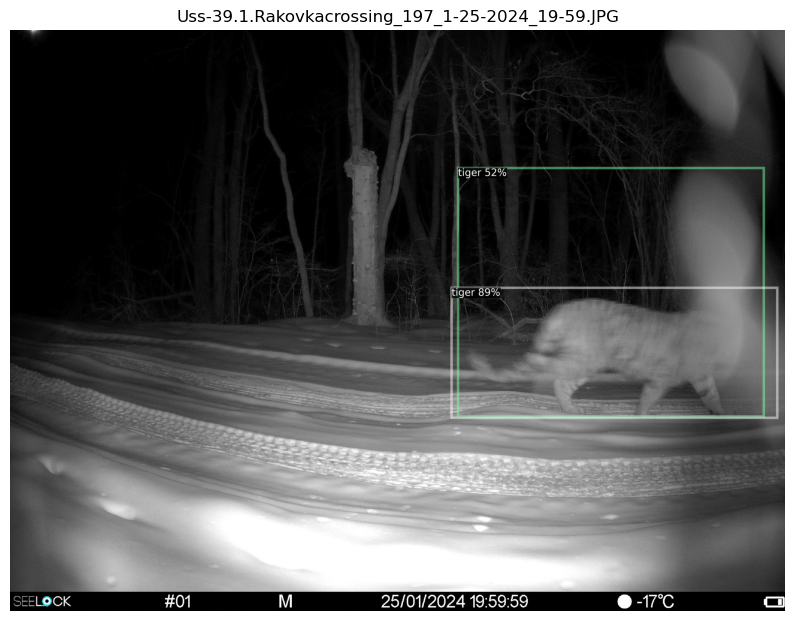

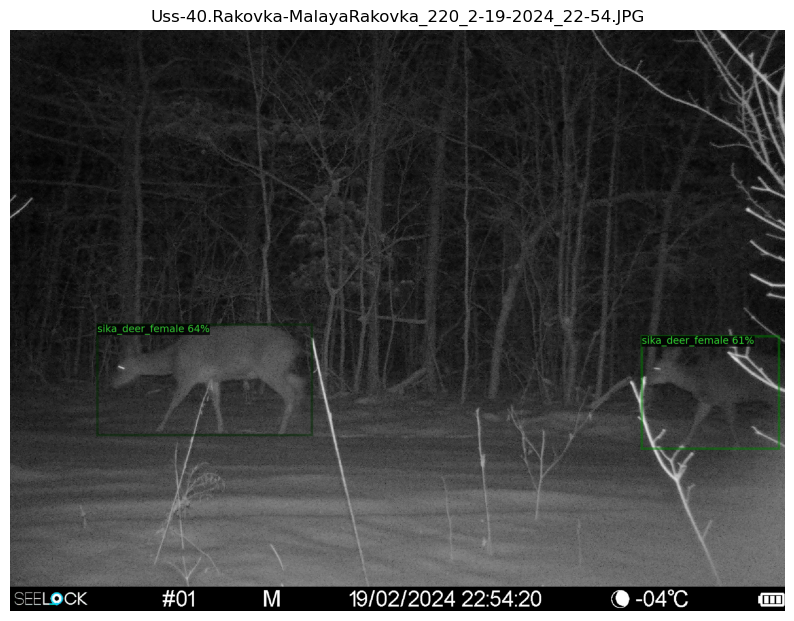

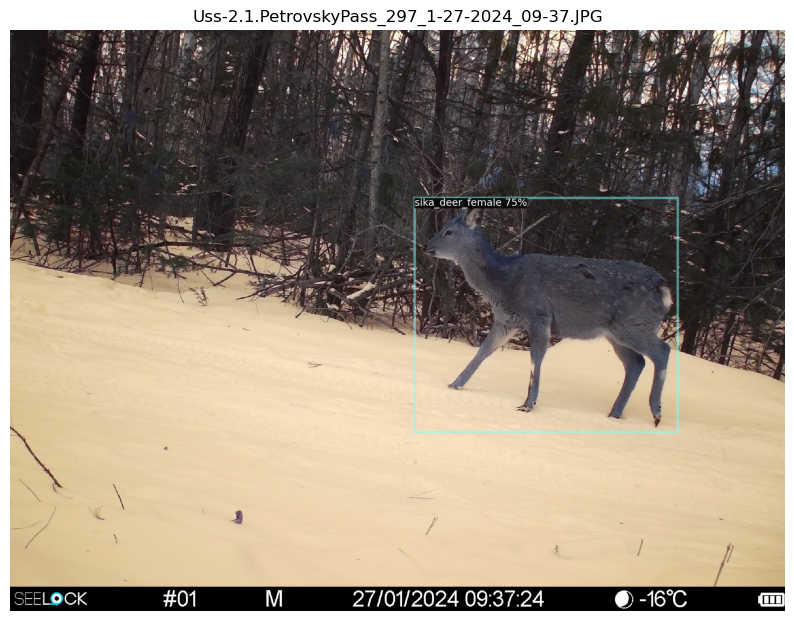

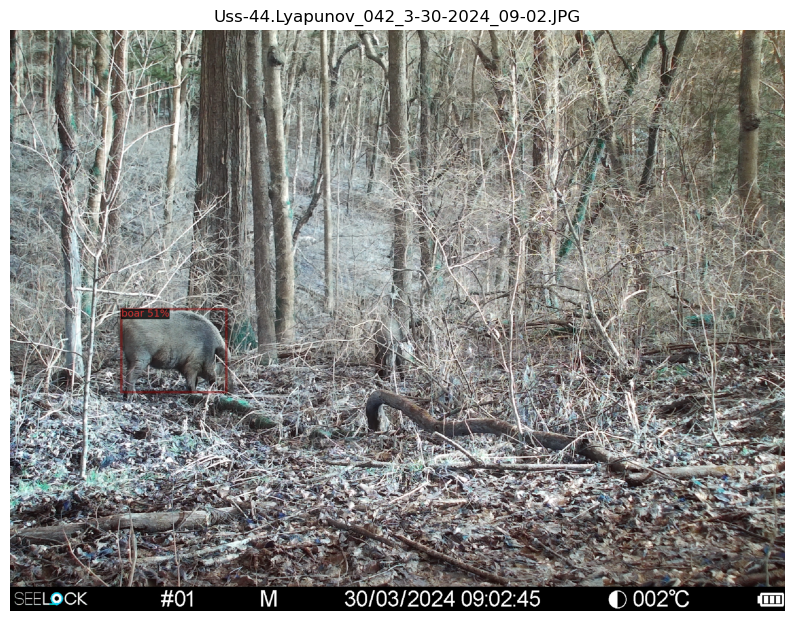

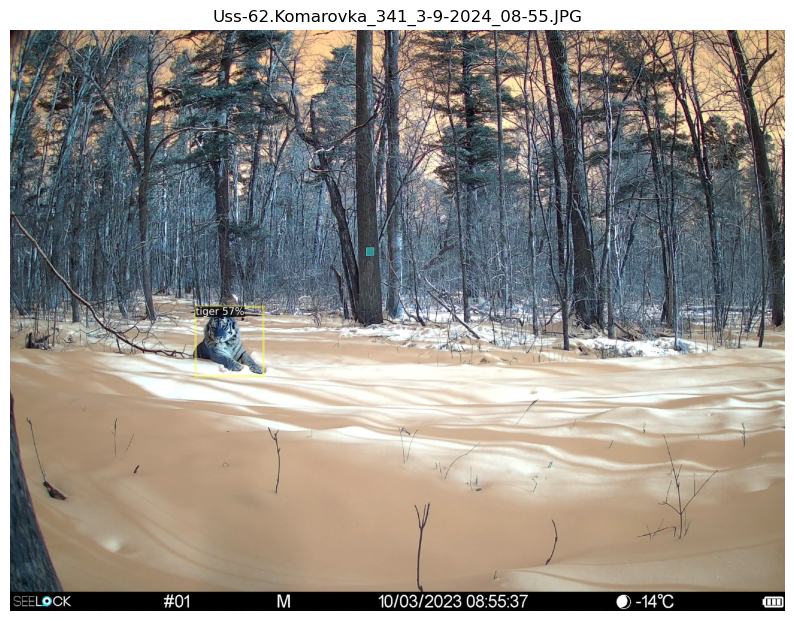

...

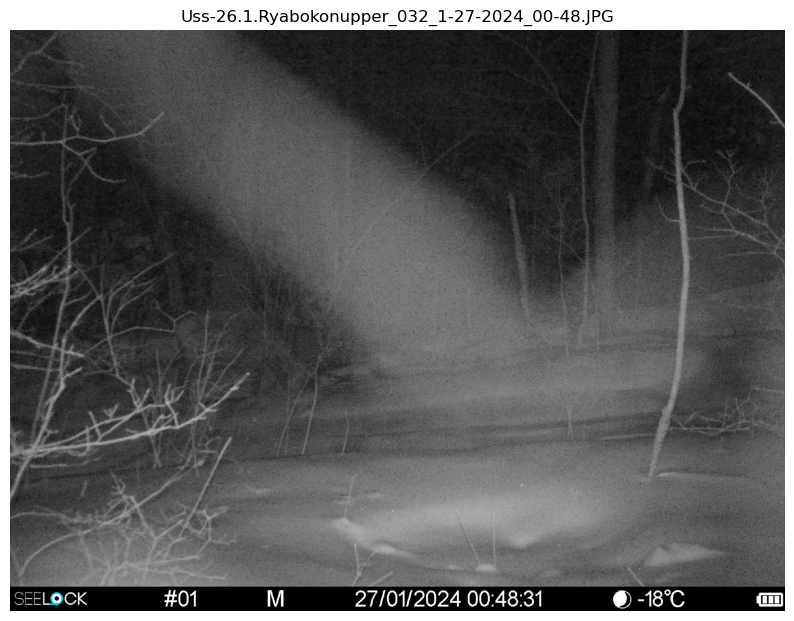

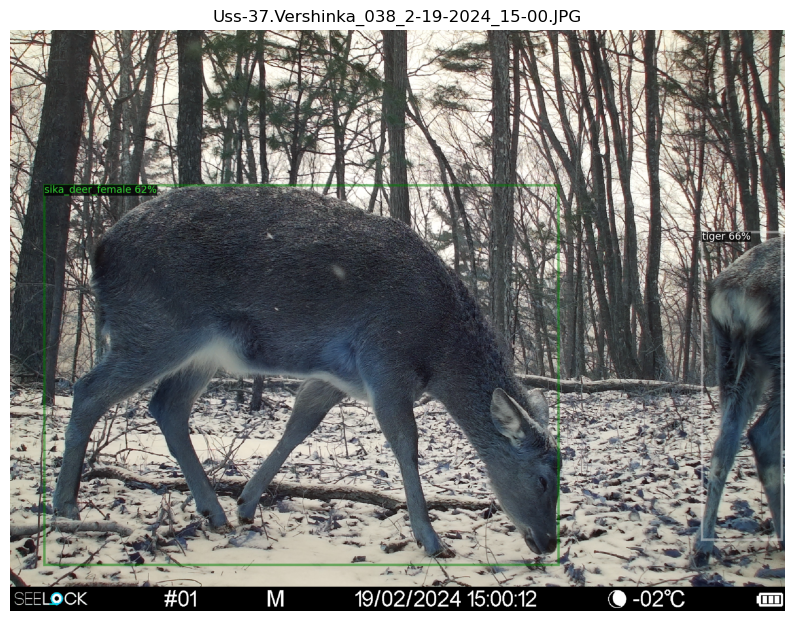

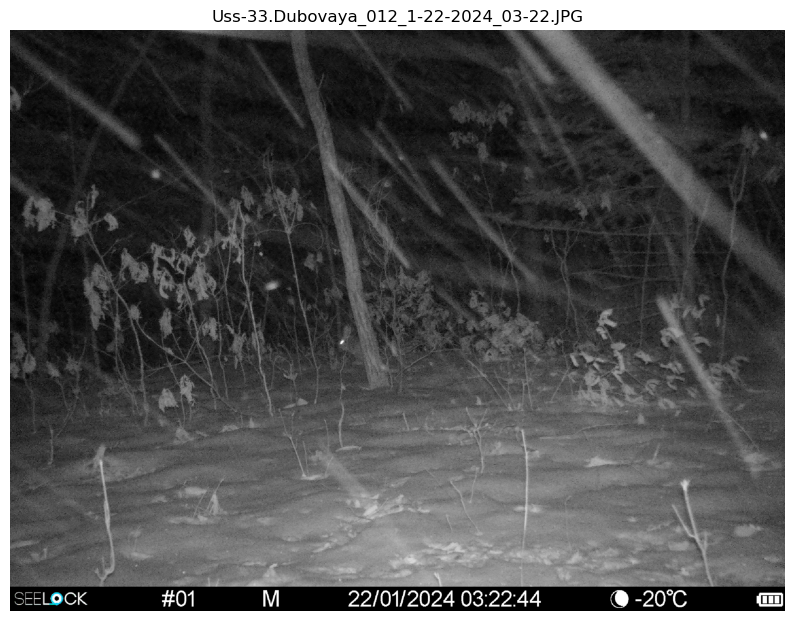

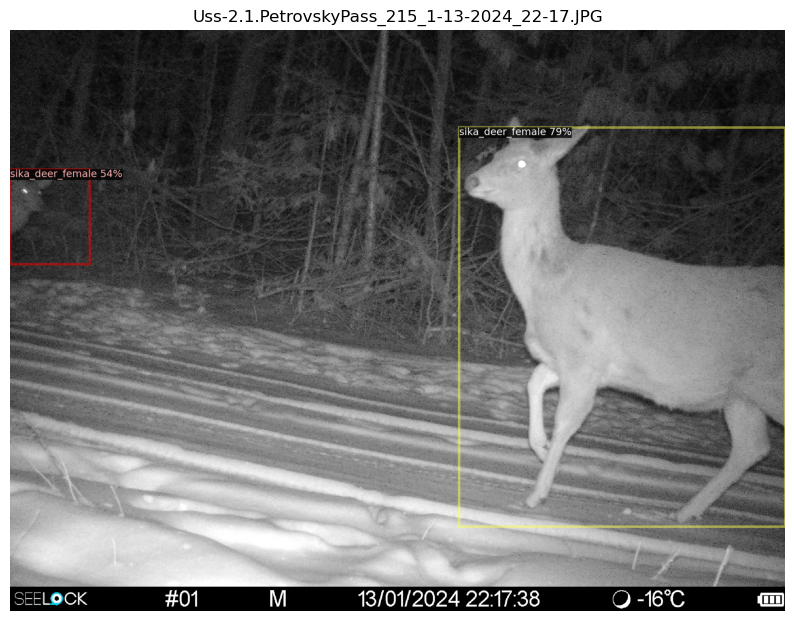

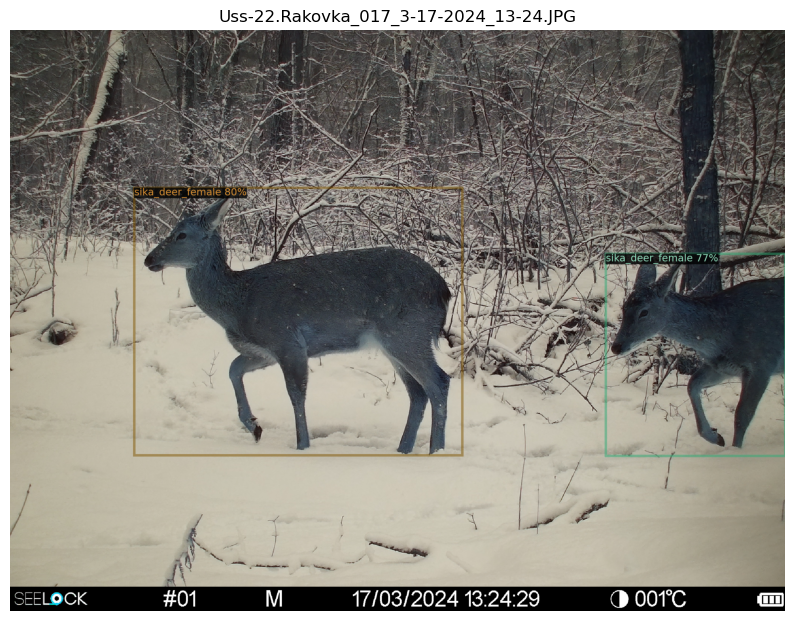

In [39]:
import random

# Получаем список всех изображений
all_imgs = [x for x in os.listdir(imgs_dir) if x.lower().endswith(('.jpg', '.jpeg', '.png'))]
print('Total images:', len(all_imgs))

# Выбираем 20 случайных изображений
random_imgs = random.sample(all_imgs, min(20, len(all_imgs)))  # На случай, если изображений меньше 20

for img_name in random_imgs:
    img_path = os.path.join(imgs_dir, img_name)
    im = cv2.imread(img_path)

    # Делаем предсказание
    outputs = predictor(im)

    # Визуализируем результат
    v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    # Создаем отдельное окно для каждого изображения
    plt.figure(figsize=(10, 8))  # Устанавливаем размер окна
    plt.imshow(out.get_image()[:, :, ::-1])
    plt.title(img_name)
    plt.axis("off")  # Убираем оси
    plt.show()  # Отображаем изображение, затем переходим к следующему

In [3]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
import pandas as pd

def get_detailed_metrics(cfg, predictor):
    evaluator = COCOEvaluator("animal_val", output_dir=cfg.OUTPUT_DIR, tasks=("bbox",))
    val_loader = build_detection_test_loader(cfg, "animal_val")
    results = inference_on_dataset(predictor.model, val_loader, evaluator)
    
    # Convert to DataFrame for better visualization
    metrics = {
        'mAP': results['bbox']['AP'],
        'mAP50': results['bbox']['AP50'],
        'mAP75': results['bbox']['AP75'],
        'Precision': results['bbox']['precision'][0][0],  # Precision at IoU=0.50
        'Recall': results['bbox']['recall'][0][0],       # Recall at IoU=0.50
        'F1': 2 * (results['bbox']['precision'][0][0] * results['bbox']['recall'][0][0]) / 
               (results['bbox']['precision'][0][0] + results['bbox']['recall'][0][0] + 1e-10)
    }
    
    # Per-class metrics
    class_metrics = []
    for idx, cat in enumerate(train_data['categories']):
        class_metrics.append({
            'Class': cat['name'],
            'AP': results['bbox']['AP_per_class'][idx],
            'AP50': results['bbox']['AP50_per_class'][idx],
            'AP75': results['bbox']['AP75_per_class'][idx]
        })
    
    return pd.DataFrame([metrics]), pd.DataFrame(class_metrics)

# Get metrics
overall_metrics, class_metrics = get_detailed_metrics(cfg, predictor)

print("\n================ Overall Metrics ================")
print(overall_metrics.to_markdown(tablefmt="grid", floatfmt=".4f"))

print("\n================ Per-Class Metrics ================")
print(class_metrics.to_markdown(tablefmt="grid", floatfmt=".4f"))

NameError: name 'cfg' is not defined

In [ ]:
import random
import cv2
import matplotlib.pyplot as plt
from detectron2.utils.visualizer import Visualizer

def visualize_predictions(predictor, imgs_dir, num_images=20):
    # Get all validation images
    val_img_files = [img['file_name'] for img in val_data['images']]
    sampled_files = random.sample(val_img_files, min(num_images, len(val_img_files)))
    
    # Setup visualization
    metadata = MetadataCatalog.get("animal_train")
    plt.figure(figsize=(20, 30))
    plt.subplots_adjust(hspace=0.3, wspace=0.1)
    
    for i, img_file in enumerate(sampled_files):
        # Load and predict
        img_path = os.path.join(imgs_dir, img_file)
        im = cv2.imread(img_path)
        outputs = predictor(im)
        
        # Visualize
        v = Visualizer(
            im[:, :, ::-1],
            metadata=metadata,
            scale=0.8,
            instance_mode=ColorMode.IMAGE_BW
        )
        out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
        
        # Plot
        plt.subplot(5, 4, i+1)
        plt.imshow(out.get_image()[:, :, ::-1])
        plt.title(img_file, fontsize=8)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

visualize_predictions(predictor, imgs_dir)